In [5]:
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler,MultiLabelBinarizer
from keras import backend

from deepctr.models import DeepFM
from deepctr.models import FNN
from deepctr.models import *
from deepctr.inputs import SparseFeat,get_feature_names
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import mean_squared_error
import kerastuner
from tensorflow.python.keras.preprocessing.sequence import pad_sequences
from deepctr.inputs import SparseFeat, VarLenSparseFeat,get_feature_names
import math
from deepctr.inputs import  SparseFeat, DenseFeat,get_feature_names
from sklearn.metrics import log_loss, roc_auc_score,roc_curve,auc,precision_recall_fscore_support
import pandas_profiling
from tensorflow.python.keras.models import load_model
from deepctr.layers.utils import *
from deepctr.layers.core import *
from deepctr.layers.interaction import *

Using TensorFlow backend.


## Definition of functions

In [2]:
from deepctr.inputs import build_input_features, get_linear_logit, input_from_feature_columns
from deepctr.layers.core import PredictionLayer
from tensorflow.python.keras.models import Model
def LR(linear_feature_columns, dnn_hidden_units=(128,128), l2_reg_linear=1e-5,
        l2_reg_embedding=1e-5, l2_reg_dnn=0, init_std=0.0001, seed=1024, dnn_dropout=0, dnn_activation='relu',
        task='binary'):
    features = build_input_features(linear_feature_columns )

    inputs_list = list(features.values())

    linear_logit = get_linear_logit(features, linear_feature_columns, init_std=init_std, seed=seed, prefix='linear',
                                        l2_reg=l2_reg_linear)


    output = PredictionLayer(task)(linear_logit)

    model = Model(inputs=inputs_list, outputs=output)
    return model

In [3]:
def normalizeNumerical(inputfile,outputfile):
    df=pd.read_csv(inputfile)
    numFeatures = ["C1"]+['C'+str(i) for i in range(14, 22)]
    for numFeature in numFeatures:
        df[numFeature] = df[numFeature].apply(lambda x: x if x<2 else math.sqrt(math.log(x)))
    df.to_csv(outputfile)
    
def featureHour(filename):
    df=pd.read_csv(filename)
    df['hour']=df['hour'].apply(lambda x: x%24)
    df.to_csv(filename)

def rareFeature(inputfile,outputfile,threshold):
    """
    :param fileName: name of file which needs to handle rare feature values
    :param thershold: when the feature appears less than threshold instances, reassign 'other'
    :return: None
    """
    df=pd.read_csv(inputfile)
    categoryFeatures =["C1"]+['C'+str(i) for i in range(14, 22)] + ["hour","banner_pos","site_id","site_domain","site_category","app_id","app_domain","app_category","device_model","device_type","device_conn_type","device_id"]
    
    for col in categoryFeatures:
        a=datetime.now()
        value_counts = df[col].value_counts() # Specific column 
        to_remove = value_counts[value_counts <= threshold].index
        print(col,"to_remove founded")
        df[col].replace(to_remove, np.nan, inplace=True)
        print("------------------------",col,"filtered------------------------------------")
        b=datetime.now() 
        print((b-a).seconds)
    df.to_csv(outputfile)     
    
def negativeSampling(inputfile,outputfile,negativeRate):
    """
    :param filename: name of file which requires negative sampling
    :param negativeRate: number of times negative sample vs postive sample 
    :return: None
    """
    data=pd.read_csv(inputfile)
    numPos=(data['click'] != 0).sum()
    numNeg=numPos*negativeRate
    res=[]
    for index,row in data.iterrows():
        if row["click"]!=1:
            numNeg-=1
        res.append(row)
        if numNeg<0:
            break
    res=pd.DataFrame(res)
    res.to_csv(outputfile)
def draw_curve(LRTrue=None,LRPred=None,DNNTrue=None,DNNPred=None):
    import matplotlib.pyplot as plt
    plt.figure()
    lw = 1.5
    plt.figure(figsize=(8,8))
    if LRTrue is not None:
        LRfpr,LRtpr,LRthreshold = roc_curve(LRTrue, LRPred) ###计算真正率和假正率
        LRroc_auc = auc(LRfpr,LRtpr) ###计算auc的值
        plt.plot(LRfpr,LRtpr, color='lightslategrey',lw=lw, label='LR ROC curve (area = %0.4f)' % LRroc_auc) ###假正率为横坐标，真正率为纵坐标做曲线
    if DNNTrue is not None:
        DNNfpr,DNNtpr,DNNthreshold = roc_curve(DNNTrue, DNNPred) ###计算真正率和假正率
        DNNroc_auc = auc(DNNfpr,DNNtpr) ###计算auc的值
        plt.plot(DNNfpr,DNNtpr, color='tomato',lw=lw, label='DNN ROC curve (area = %0.4f)' % DNNroc_auc) ###假正率为横坐标，真正率为纵坐标做曲线
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

def draw_history(history):
    import matplotlib.pyplot as plt
    # print(history.history)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Crossentropy') 
    plt.ylabel('crossentropy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

def Matrics(y_true,y_pred,threshold):
    precision,recall,fscore,support=precision_recall_fscore_support(y_true, BinaryValue(y_pred,threshold),labels=[0,1])
    print("precision:",precision)
    print("recall:",recall)
    print("fscore:",fscore)
    print("support",support)
    print("test LogLoss", round(log_loss(y_true, y_pred), 4))
    print("test AUC", round(roc_auc_score(y_true,y_pred), 4))
def BinaryValue(pred_ans,threshold):
    pred_ans=[1 if x>threshold else 0 for x in pred_ans]
    
    
#     print(positiveRate)
    return pred_ans

In [6]:
featureHour("./dac/avazu_normalized.csv")

FileNotFoundError: [Errno 2] File b'./dac/avazu_normalized.csv' does not exist: b'./dac/avazu_normalized.csv'

In [ ]:
normalizeNumerical("./dac/avazu/avazu.csv",'./dac/avazu/avazu_normalized.csv')

In [5]:
rareFeature("./dac/avazu/avazu.csv","./dac/avazu/avazu_filteredFeatures.csv",20)

C1 to_remove founded
------------------------ C1 filtered------------------------------------
0
C14 to_remove founded
------------------------ C14 filtered------------------------------------
0
C15 to_remove founded
------------------------ C15 filtered------------------------------------
0
C16 to_remove founded
------------------------ C16 filtered------------------------------------
0
C17 to_remove founded
------------------------ C17 filtered------------------------------------
0
C18 to_remove founded
------------------------ C18 filtered------------------------------------
0
C19 to_remove founded
------------------------ C19 filtered------------------------------------
0
C20 to_remove founded
------------------------ C20 filtered------------------------------------
0
C21 to_remove founded
------------------------ C21 filtered------------------------------------
0
hour to_remove founded
------------------------ hour filtered------------------------------------
0
banner_pos to_remove

In [12]:
avazu=pd.read_csv("./dac/avazu/avazu_filteredFeatures.csv")
print(avazu.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 0 to 1999999
Data columns (total 26 columns):
Unnamed: 0          int64
0                   int64
id                  float64
click               int64
hour                int64
C1                  int64
banner_pos          float64
site_id             object
site_domain         object
site_category       object
app_id              object
app_domain          object
app_category        object
device_id           object
device_ip           object
device_model        object
device_type         int64
device_conn_type    int64
C14                 float64
C15                 float64
C16                 float64
C17                 float64
C18                 int64
C19                 float64
C20                 float64
C21                 float64
dtypes: float64(9), int64(8), object(9)
memory usage: 396.7+ MB
None


In [11]:
c=avazu['click'].apply(lambda x: 1 if x>0 else 0)
print(c.value_counts()[0]/c.value_counts()[1])

5.187946499014569


In [61]:
negativeSampling("./dac/avazu/avazu_filteredFeatures.csv","./dac/avazu/avazu_sampled.csv",4)

In [ ]:
data=pd.read_csv("./dac/avazu/avazu.csv")
pandas_profiling.ProfileReport(data)

## Load Data

In [6]:
data = pd.read_csv("./dac/avazu/avazu_filteredFeatures.csv")

sparse_features =["C1"]+['C'+str(i) for i in range(14, 22)]+ ["hour","banner_pos","site_id","site_domain","site_category","app_id","app_domain","app_category","device_id","device_ip","device_model","device_type","device_conn_type"]

# 
data[sparse_features] = data[sparse_features].fillna('-1', )

target = 'click'
# 1.Label Encoding for sparse features,and do simple Transformation for dense features
for feat in sparse_features:
    data=data.astype({feat: 'str'})
#     print(feat)
    lbe = LabelEncoder()
    data[feat] = lbe.fit_transform(data[feat])
    
# 2.count #unique features for each sparse field,and record dense feature field name

fixlen_feature_columns = [SparseFeat(feat, vocabulary_size=data[feat].nunique(),embedding_dim=10)
                       for i,feat in enumerate(sparse_features)]

dnn_feature_columns = fixlen_feature_columns
linear_feature_columns = fixlen_feature_columns

feature_names = get_feature_names(linear_feature_columns + dnn_feature_columns)

# 3.generate input data for model
data=data.astype({'hour': 'int32'})

train, test = train_test_split(data, test_size=0.2,random_state=1024)
# train.to_csv("avazu_train.csv")
# test.to_csv("avazu_test.csv")
train_model_input = {name:train[name] for name in feature_names}
test_model_input = {name:test[name] for name in feature_names}
print("Data Loaded!")

Data Loaded!


In [8]:
type(train)

pandas.core.frame.DataFrame

# All Sparse Features

## LR

In [6]:
model = LR(linear_feature_columns, dnn_feature_columns, task='binary')
model.compile(keras.optimizers.Adam(lr=0.0001), "binary_crossentropy",metrics=['accuracy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=10)
history=model.fit(train_model_input,train[target].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss',patience=3),keras.callbacks.ModelCheckpoint("LR.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=256,epochs=100,verbose=2,validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 1280000 samples, validate on 320000 samples
Epoch 1/100

Epoch 00001: val_loss improved from inf to 0.38067, saving model to LR.h5
1280000/1280000 - 366s - loss: 0.3904 - acc: 0.8411 - val_loss: 0.3807 - val_acc: 0.8419
Epoch 2/100

Epoch 00002: val_loss improved from 0.38067 to 0.37870, saving model to LR.h5
1280000/1280000 - 371s - loss: 0.3756 - acc: 0.8433 - val_loss: 0.3787 - val_acc: 0.8423
Epoch 3/100

Epoch 00003: val_loss improved from 0.37870 to 0.37847, saving model to LR.h5
1280000/1280000 - 373s - loss: 0.3719 - acc: 0.8443 - val_loss: 0.3785 - val_acc: 0.8425
Epoch 4/100

Epoch 00004: val_loss improved f

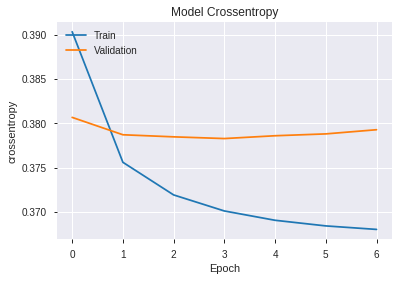

precision: [0.85111401 0.58809872]
recall: [0.9857159  0.10576536]
fscore: [0.91348318 0.1792872 ]
support [335338  64662]
test LogLoss 0.3728
test AUC 0.7753


In [7]:
# model=load_model("AutoInt.h5",custom_objects={"InteractingLayer":InteractingLayer,'NoMask' : NoMask,"Linear":Linear,"FM":FM,"DNN":DNN,"PredictionLayer":PredictionLayer})
# pred_ans=model.predict(test_model_input,batch_size=256)
draw_history(history)
Matrics(test[target].values, pred_ans,0.5) 

## DeepFM

In [ ]:
model=DeepFM(linear_feature_columns,dnn_feature_columns,task='binary',l2_reg_linear=0.0001, l2_reg_embedding=0.0001,dnn_dropout=0.5,l2_reg_dnn=0.001,dnn_hidden_units=(128,128,64))
model.compile(keras.optimizers.Adam(learning_rate=0.0005),loss='binary_crossentropy',metrics=['accuracy'])
history=model.fit(train_model_input,train['click'].values,callbacks=[keras.callbacks.EarlyStopping(monitor='val_acc',patience=2),
                                                                      keras.callbacks.ModelCheckpoint("DeepFM.h5",monitor="val_loss",verbose=1,save_best_only=True)],
                  batch_size=512,epochs=50,verbose=2,validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=512)

Train on 1280000 samples, validate on 320000 samples
Epoch 1/50

Epoch 00001: val_loss improved from inf to 0.39014, saving model to DeepFM.h5
1280000/1280000 - 270s - loss: 0.4074 - acc: 0.8417 - val_loss: 0.3901 - val_acc: 0.8423
Epoch 2/50

Epoch 00002: val_loss improved from 0.39014 to 0.38947, saving model to DeepFM.h5
1280000/1280000 - 228s - loss: 0.3891 - acc: 0.8426 - val_loss: 0.3895 - val_acc: 0.8423
Epoch 3/50

Epoch 00003: val_loss did not improve from 0.38947
1280000/1280000 - 227s - loss: 0.3886 - acc: 0.8428 - val_loss: 0.3905 - val_acc: 0.8426
Epoch 4/50

Epoch 00004: val_loss improved from 0.38947 to 0.38909, saving model to DeepFM.h5
1280000/1280000 - 233s - loss: 0.3884 - acc: 0.8429 - val_loss: 0.3891 - val_acc: 0.8426
Epoch 5/50

Epoch 00005: val_loss improved from 0.38909 to 0.38888, saving model to DeepFM.h5
1280000/1280000 - 237s - loss: 0.3882 - acc: 0.8431 - val_loss: 0.3889 - val_acc: 0.8426
Epoch 6/50


In [ ]:
import matplotlib.pyplot as plt
# print(history.history)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model CE') 
plt.ylabel('CE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

## FGCNN

In [6]:
model = FGCNN(linear_feature_columns, dnn_feature_columns, task='binary')
model.compile("adam", "binary_crossentropy",metrics=['binary_crossentropy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,
                    batch_size=1024, epochs=15, verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 1280000 samples, validate on 320000 samples
Epoch 1/15


KeyboardInterrupt: 

In [6]:
import kerastuner
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow import keras

def buildDeepFM(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = DeepFM(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildPNN(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = PNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model
    
def buildFNN(hp):
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.6, step=0.1, default=0.5)
    model = FNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildFGCNN(hp):
    # k=40
    # conv=7*1
    #Kernal=[14,16,18,20]
    #new=[3,3,3,3]
    # ruenet=[4096,2048,1/]
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.8, step=0.1, default=0.5)
    model = FGCNN(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.8, task='binary')
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model

def buildAutoint(hp):
   
    activation = hp.Choice('activation', ['relu', 'selu','elu'])
    dropout_rate = hp.Float(
                'dropout_rate', 0.0, 0.8, step=0.1, default=0.5)
    model=AutoInt(linear_feature_columns, dnn_feature_columns, dnn_use_bn=True, dnn_dropout=0, task='binary' )
    model.compile( optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4,1e-4])), loss="binary_crossentropy",metrics=['binary_crossentropy'])
    return model
    
    
    
class MyTuner(kerastuner.tuners.BayesianOptimization):
    def run_trial(self, trial, *args, **kwargs):
        # You can add additional HyperParameters for preprocessing and custom training loops
        # via overriding `run_trial`
        kwargs['batch_size'] = trial.hyperparameters.Int('batch_size', 256, 1024, step=256)
        kwargs['epochs'] = trial.hyperparameters.Int('epochs', 10, 30, step=5)
        super(MyTuner, self).run_trial(trial, *args, **kwargs)
        
def HypermeterTune(model,directory):
    tuner = MyTuner(
        model,
        objective='val_binary_crossentropy',
        max_trials=5,
        executions_per_trial=2,
        directory=directory)

    tuner.search_space_summary()

    tuner.search(x=train_model_input,
                 y=train[target].values,callbacks=[tf.keras.callbacks.EarlyStopping('val_binary_crossentropy', patience=3)],
                 validation_data=(test_model_input,test[target].values))
    print("finished")
    return tuner


In [7]:
def bestModel(tuner,batch_size,modelName):
    hps = tuner.get_best_hyperparameters()[0]
    es = EarlyStopping('val_binary_crossentropy', patience=1)
    best_model = tuner.hypermodel.build(hps)
    #callbacks=[es],
    history = best_model.fit(train_model_input, train[target].values,
                                batch_size=batch_size, epochs=20, verbose=2,validation_split=0.2)
    pred_ans = best_model.predict(test_model_input, batch_size=256)
    print("Final Result of ",modelName, " :")
    print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
    print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

In [35]:
tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values

{'activation': 'relu', 'dropout_rate': 0.0, 'batch_size': 1024, 'epochs': 15}

# Falsely Dense Features

## Autoint result

In [8]:
Autointtuner=HypermeterTune(buildAutoint,"turnAutoint")

INFO:tensorflow:Reloading Oracle from turnAutoint/untitled_project/oracle.json
INFO:tensorflow:Reloading Tuner from turnAutoint/untitled_project/tuner0.json


INFO:tensorflow:Oracle triggered exit
finished


In [9]:
Autointtuner.results_summary()
print(Autointtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(Autointtuner,512,"Autoint")

{'activation': 'relu', 'dropout_rate': 0.4, 'learning_rate': 0.0001, 'batch_size': 512, 'epochs': 25}
Train on 334458 samples, validate on 83615 samples
Epoch 1/20


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


334458/334458 - 42s - loss: 0.4306 - binary_crossentropy: 0.4306 - val_loss: 0.3840 - val_binary_crossentropy: 0.3838
Epoch 2/20
334458/334458 - 31s - loss: 0.3269 - binary_crossentropy: 0.3266 - val_loss: 0.3936 - val_binary_crossentropy: 0.3931
Epoch 3/20
334458/334458 - 31s - loss: 0.2516 - binary_crossentropy: 0.2510 - val_loss: 0.4341 - val_binary_crossentropy: 0.4334
Epoch 4/20
334458/334458 - 31s - loss: 0.2196 - binary_crossentropy: 0.2188 - val_loss: 0.4584 - val_binary_crossentropy: 0.4575
Epoch 5/20
334458/334458 - 31s - loss: 0.2070 - binary_crossentropy: 0.2061 - val_loss: 0.4798 - val_binary_crossentropy: 0.4789
Epoch 6/20
334458/334458 - 31s - loss: 0.2002 - binary_crossentropy: 0.1992 - val_loss: 0.5011 - val_binary_crossentropy: 0.5000
Epoch 7/20
334458/334458 - 29s - loss: 0.1959 - binary_crossentropy: 0.1948 - val_loss: 0.5026 - val_binary_crossentropy: 0.5014
Epoch 8/20


KeyboardInterrupt: 

In [15]:
model = AutoInt(linear_feature_columns, dnn_feature_columns,dnn_dropout=0.6, task='binary')
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), loss="binary_crossentropy",metrics=['binary_crossentropy'])
earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,
                    batch_size=512, epochs=25, callbacks=[earlystopping_callback],verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Train on 334458 samples, validate on 83615 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


334458/334458 - 42s - loss: 0.4143 - binary_crossentropy: 0.4142 - val_loss: 0.3961 - val_binary_crossentropy: 0.3959
Epoch 2/25
334458/334458 - 31s - loss: 0.3846 - binary_crossentropy: 0.3842 - val_loss: 0.3825 - val_binary_crossentropy: 0.3818
Epoch 3/25
334458/334458 - 30s - loss: 0.3371 - binary_crossentropy: 0.3360 - val_loss: 0.3909 - val_binary_crossentropy: 0.3895
Epoch 00003: early stopping


In [16]:

print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.3883
test AUC 0.7709


## FGCNN result

In [98]:
FNNtuner=HypermeterTune("buildFGCNN","turnFGCNN")

Train on 1230861 samples, validate on 307716 samples
Epoch 1/10


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74496/1230861 [>.............................] - ETA: 3:18:04 - loss: 0.5914 - binary_crossentropy: 0.59 - ETA: 1:08:15 - loss: 0.5673 - binary_crossentropy: 0.56 - ETA: 42:23 - loss: 0.5601 - binary_crossentropy: 0.5600 - ETA: 31:13 - loss: 0.5414 - binary_crossentropy: 0.54 - ETA: 24:57 - loss: 0.5119 - binary_crossentropy: 0.51 - ETA: 20:59 - loss: 0.5042 - binary_crossentropy: 0.50 - ETA: 18:12 - loss: 0.4892 - binary_crossentropy: 0.48 - ETA: 16:05 - loss: 0.4839 - binary_crossentropy: 0.48 - ETA: 14:32 - loss: 0.4743 - binary_crossentropy: 0.47 - ETA: 13:18 - loss: 0.4744 - binary_crossentropy: 0.47 - ETA: 12:16 - loss: 0.4713 - binary_crossentropy: 0.47 - ETA: 11:24 - loss: 0.4686 - binary_crossentropy: 0.46 - ETA: 10:41 - loss: 0.4685 - binary_crossentropy: 0.46 - ETA: 10:06 - loss: 0.4643 - binary_crossentropy: 0.46 - ETA: 9:34 - loss: 0.4587 - binary_crossentropy: 0.4577 - ETA: 9:07 - loss: 0.4552 - binary_crossentropy: 0.454 - ETA: 8:42 - loss: 0.4532 - binary_crossentropy

 149248/1230861 [==>...........................] - ETA: 2:56 - loss: 0.4533 - binary_crossentropy: 0.428 - ETA: 2:55 - loss: 0.4534 - binary_crossentropy: 0.428 - ETA: 2:55 - loss: 0.4539 - binary_crossentropy: 0.428 - ETA: 2:55 - loss: 0.4542 - binary_crossentropy: 0.428 - ETA: 2:54 - loss: 0.4544 - binary_crossentropy: 0.428 - ETA: 2:54 - loss: 0.4551 - binary_crossentropy: 0.429 - ETA: 2:54 - loss: 0.4556 - binary_crossentropy: 0.429 - ETA: 2:53 - loss: 0.4561 - binary_crossentropy: 0.430 - ETA: 2:53 - loss: 0.4566 - binary_crossentropy: 0.430 - ETA: 2:53 - loss: 0.4569 - binary_crossentropy: 0.430 - ETA: 2:52 - loss: 0.4573 - binary_crossentropy: 0.430 - ETA: 2:52 - loss: 0.4577 - binary_crossentropy: 0.430 - ETA: 2:52 - loss: 0.4581 - binary_crossentropy: 0.431 - ETA: 2:52 - loss: 0.4581 - binary_crossentropy: 0.430 - ETA: 2:51 - loss: 0.4581 - binary_crossentropy: 0.430 - ETA: 2:51 - loss: 0.4581 - binary_crossentropy: 0.430 - ETA: 2:51 - loss: 0.4585 - binary_crossentropy: 0.430

 224000/1230861 [====>.........................] - ETA: 2:25 - loss: 0.4769 - binary_crossentropy: 0.428 - ETA: 2:25 - loss: 0.4772 - binary_crossentropy: 0.428 - ETA: 2:25 - loss: 0.4772 - binary_crossentropy: 0.428 - ETA: 2:25 - loss: 0.4775 - binary_crossentropy: 0.428 - ETA: 2:25 - loss: 0.4775 - binary_crossentropy: 0.428 - ETA: 2:25 - loss: 0.4776 - binary_crossentropy: 0.428 - ETA: 2:25 - loss: 0.4777 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4778 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4777 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4778 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4780 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4782 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4784 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4784 - binary_crossentropy: 0.428 - ETA: 2:24 - loss: 0.4785 - binary_crossentropy: 0.428 - ETA: 2:23 - loss: 0.4787 - binary_crossentropy: 0.428 - ETA: 2:23 - loss: 0.4789 - binary_crossentropy: 0.428

 298752/1230861 [======>.......................] - ETA: 2:09 - loss: 0.4944 - binary_crossentropy: 0.428 - ETA: 2:09 - loss: 0.4946 - binary_crossentropy: 0.429 - ETA: 2:09 - loss: 0.4949 - binary_crossentropy: 0.429 - ETA: 2:09 - loss: 0.4950 - binary_crossentropy: 0.429 - ETA: 2:09 - loss: 0.4952 - binary_crossentropy: 0.429 - ETA: 2:09 - loss: 0.4952 - binary_crossentropy: 0.429 - ETA: 2:09 - loss: 0.4953 - binary_crossentropy: 0.429 - ETA: 2:09 - loss: 0.4953 - binary_crossentropy: 0.429 - ETA: 2:09 - loss: 0.4954 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4955 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4956 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4958 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4958 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4959 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4959 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4960 - binary_crossentropy: 0.429 - ETA: 2:08 - loss: 0.4961 - binary_crossentropy: 0.429

 373504/1230861 [========>.....................] - ETA: 1:57 - loss: 0.5072 - binary_crossentropy: 0.429 - ETA: 1:57 - loss: 0.5072 - binary_crossentropy: 0.429 - ETA: 1:57 - loss: 0.5073 - binary_crossentropy: 0.429 - ETA: 1:57 - loss: 0.5074 - binary_crossentropy: 0.429 - ETA: 1:57 - loss: 0.5074 - binary_crossentropy: 0.429 - ETA: 1:57 - loss: 0.5075 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5075 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5075 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5076 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5077 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5078 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5079 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5080 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5080 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5081 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5082 - binary_crossentropy: 0.429 - ETA: 1:56 - loss: 0.5082 - binary_crossentropy: 0.429

 448256/1230861 [=========>....................] - ETA: 1:46 - loss: 0.5173 - binary_crossentropy: 0.430 - ETA: 1:46 - loss: 0.5173 - binary_crossentropy: 0.430 - ETA: 1:46 - loss: 0.5174 - binary_crossentropy: 0.430 - ETA: 1:46 - loss: 0.5174 - binary_crossentropy: 0.430 - ETA: 1:46 - loss: 0.5174 - binary_crossentropy: 0.430 - ETA: 1:46 - loss: 0.5175 - binary_crossentropy: 0.430 - ETA: 1:46 - loss: 0.5175 - binary_crossentropy: 0.430 - ETA: 1:46 - loss: 0.5175 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5175 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5176 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5177 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5178 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5177 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5178 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5178 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5178 - binary_crossentropy: 0.430 - ETA: 1:45 - loss: 0.5179 - binary_crossentropy: 0.430

 523008/1230861 [===========>..................] - ETA: 1:36 - loss: 0.5253 - binary_crossentropy: 0.431 - ETA: 1:36 - loss: 0.5253 - binary_crossentropy: 0.431 - ETA: 1:36 - loss: 0.5254 - binary_crossentropy: 0.431 - ETA: 1:36 - loss: 0.5255 - binary_crossentropy: 0.431 - ETA: 1:36 - loss: 0.5256 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5257 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5257 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5258 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5259 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5259 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5259 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5259 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5260 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5260 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5260 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5261 - binary_crossentropy: 0.432 - ETA: 1:35 - loss: 0.5261 - binary_crossentropy: 0.432

 597760/1230861 [=============>................] - ETA: 1:26 - loss: 0.5315 - binary_crossentropy: 0.432 - ETA: 1:26 - loss: 0.5316 - binary_crossentropy: 0.432 - ETA: 1:26 - loss: 0.5316 - binary_crossentropy: 0.432 - ETA: 1:26 - loss: 0.5316 - binary_crossentropy: 0.432 - ETA: 1:26 - loss: 0.5317 - binary_crossentropy: 0.432 - ETA: 1:26 - loss: 0.5317 - binary_crossentropy: 0.432 - ETA: 1:26 - loss: 0.5318 - binary_crossentropy: 0.432 - ETA: 1:26 - loss: 0.5318 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5318 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5319 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5319 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5319 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5319 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5320 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5321 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5321 - binary_crossentropy: 0.432 - ETA: 1:25 - loss: 0.5321 - binary_crossentropy: 0.432

 672256/1230861 [===============>..............] - ETA: 1:17 - loss: 0.5359 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5359 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5360 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5360 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5361 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5361 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5361 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5361 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5361 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5361 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5362 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5362 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5362 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5362 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5362 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5362 - binary_crossentropy: 0.432 - ETA: 1:16 - loss: 0.5363 - binary_crossentropy: 0.432

 747520/1230861 [=================>............] - ETA: 1:07 - loss: 0.5389 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5389 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5389 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5389 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5389 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5389 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5389 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5390 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5390 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5390 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5391 - binary_crossentropy: 0.432 - ETA: 1:07 - loss: 0.5391 - binary_crossentropy: 0.432 - ETA: 1:06 - loss: 0.5391 - binary_crossentropy: 0.432 - ETA: 1:06 - loss: 0.5391 - binary_crossentropy: 0.432 - ETA: 1:06 - loss: 0.5391 - binary_crossentropy: 0.432 - ETA: 1:06 - loss: 0.5391 - binary_crossentropy: 0.432 - ETA: 1:06 - loss: 0.5391 - binary_crossentropy: 0.432

 824832/1230861 [===================>..........] - ETA: 58s - loss: 0.5417 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5417 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5418 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5417 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5417 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5418 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5418 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5419 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5419 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5419 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5420 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5420 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5420 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5420 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5420 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5420 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5421 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5421 - binar

 902144/1230861 [====================>.........] - ETA: 48s - loss: 0.5448 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5449 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5450 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5450 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5450 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5450 - binary_crossentropy: 0.43 - ETA: 47s - loss: 0.5450 - binary_crossentropy: 0.43 - ETA: 47s - loss: 0.5450 - binary_crossentropy: 0.43 - ETA: 47s - loss: 0.5451 - binary_crossentropy: 0.43 - ETA: 47s - loss: 0.5451 - binar

 979456/1230861 [======================>.......] - ETA: 39s - loss: 0.5474 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5474 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5474 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5474 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5474 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5474 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5474 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5475 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5475 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5476 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5476 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5476 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5476 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5476 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5477 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5476 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5477 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5477 - binar

1056768/1230861 [========================>.....] - ETA: 30s - loss: 0.5495 - binary_crossentropy: 0.43 - ETA: 30s - loss: 0.5495 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5495 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5495 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5495 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5495 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5495 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5496 - binar

1134080/1230861 [==========================>...] - ETA: 20s - loss: 0.5513 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5513 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5516 - binar

1211392/1230861 [============================>.] - ETA: 11s - loss: 0.5527 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5527 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5527 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5527 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5527 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5527 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5527 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5529 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5528 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5529 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5529 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5539 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5540 - binary

  74496/1230861 [>.............................] - ETA: 2:21 - loss: 0.5299 - binary_crossentropy: 0.391 - ETA: 2:36 - loss: 0.5985 - binary_crossentropy: 0.459 - ETA: 2:33 - loss: 0.5764 - binary_crossentropy: 0.437 - ETA: 2:31 - loss: 0.5775 - binary_crossentropy: 0.439 - ETA: 2:28 - loss: 0.5779 - binary_crossentropy: 0.439 - ETA: 2:27 - loss: 0.5711 - binary_crossentropy: 0.433 - ETA: 2:25 - loss: 0.5694 - binary_crossentropy: 0.431 - ETA: 2:25 - loss: 0.5687 - binary_crossentropy: 0.430 - ETA: 2:27 - loss: 0.5655 - binary_crossentropy: 0.427 - ETA: 2:27 - loss: 0.5667 - binary_crossentropy: 0.429 - ETA: 2:27 - loss: 0.5694 - binary_crossentropy: 0.432 - ETA: 2:27 - loss: 0.5652 - binary_crossentropy: 0.428 - ETA: 2:26 - loss: 0.5613 - binary_crossentropy: 0.424 - ETA: 2:26 - loss: 0.5582 - binary_crossentropy: 0.421 - ETA: 2:25 - loss: 0.5562 - binary_crossentropy: 0.419 - ETA: 2:25 - loss: 0.5524 - binary_crossentropy: 0.415 - ETA: 2:25 - loss: 0.5514 - binary_crossentropy: 0.415

 980224/1230861 [======================>.......] - ETA: 38s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binar

1057536/1230861 [========================>.....] - ETA: 29s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5702 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binar

1134848/1230861 [==========================>...] - ETA: 20s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5699 - binar

1212160/1230861 [============================>.] - ETA: 11s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74496/1230861 [>.............................] - ETA: 3:00:36 - loss: 5.5278 - binary_crossentropy: 5.52 - ETA: 1:01:44 - loss: 2.9477 - binary_crossentropy: 2.94 - ETA: 38:01 - loss: 2.3408 - binary_crossentropy: 2.3407 - ETA: 27:53 - loss: 2.1439 - binary_crossentropy: 2.14 - ETA: 22:15 - loss: 2.1436 - binary_crossentropy: 2.14 - ETA: 18:36 - loss: 2.0427 - binary_crossentropy: 2.04 - ETA: 16:09 - loss: 1.9255 - binary_crossentropy: 1.92 - ETA: 14:17 - loss: 1.7661 - binary_crossentropy: 1.76 - ETA: 12:54 - loss: 1.6495 - binary_crossentropy: 1.64 - ETA: 11:47 - loss: 1.5503 - binary_crossentropy: 1.54 - ETA: 10:53 - loss: 1.4518 - binary_crossentropy: 1.45 - ETA: 10:09 - loss: 1.3706 - binary_crossentropy: 1.37 - ETA: 9:31 - loss: 1.3029 - binary_crossentropy: 1.3023 - ETA: 9:00 - loss: 1.2467 - binary_crossentropy: 1.246 - ETA: 8:32 - loss: 1.1955 - binary_crossentropy: 1.194 - ETA: 8:07 - loss: 1.1455 - binary_crossentropy: 1.144 - ETA: 7:45 - loss: 1.1054 - binary_crossentropy

 149248/1230861 [==>...........................] - ETA: 2:50 - loss: 0.5232 - binary_crossentropy: 0.498 - ETA: 2:50 - loss: 0.5228 - binary_crossentropy: 0.498 - ETA: 2:49 - loss: 0.5225 - binary_crossentropy: 0.497 - ETA: 2:49 - loss: 0.5225 - binary_crossentropy: 0.497 - ETA: 2:49 - loss: 0.5222 - binary_crossentropy: 0.497 - ETA: 2:48 - loss: 0.5222 - binary_crossentropy: 0.496 - ETA: 2:48 - loss: 0.5217 - binary_crossentropy: 0.496 - ETA: 2:48 - loss: 0.5211 - binary_crossentropy: 0.495 - ETA: 2:48 - loss: 0.5209 - binary_crossentropy: 0.495 - ETA: 2:47 - loss: 0.5206 - binary_crossentropy: 0.494 - ETA: 2:47 - loss: 0.5203 - binary_crossentropy: 0.494 - ETA: 2:47 - loss: 0.5199 - binary_crossentropy: 0.493 - ETA: 2:47 - loss: 0.5195 - binary_crossentropy: 0.492 - ETA: 2:46 - loss: 0.5192 - binary_crossentropy: 0.492 - ETA: 2:46 - loss: 0.5193 - binary_crossentropy: 0.492 - ETA: 2:46 - loss: 0.5192 - binary_crossentropy: 0.492 - ETA: 2:45 - loss: 0.5188 - binary_crossentropy: 0.491

 224000/1230861 [====>.........................] - ETA: 2:23 - loss: 0.5108 - binary_crossentropy: 0.463 - ETA: 2:23 - loss: 0.5109 - binary_crossentropy: 0.463 - ETA: 2:23 - loss: 0.5110 - binary_crossentropy: 0.463 - ETA: 2:23 - loss: 0.5110 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5111 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5111 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5111 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5112 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5114 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5115 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5115 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5116 - binary_crossentropy: 0.462 - ETA: 2:22 - loss: 0.5116 - binary_crossentropy: 0.462 - ETA: 2:21 - loss: 0.5118 - binary_crossentropy: 0.462 - ETA: 2:21 - loss: 0.5118 - binary_crossentropy: 0.462 - ETA: 2:21 - loss: 0.5119 - binary_crossentropy: 0.462 - ETA: 2:21 - loss: 0.5118 - binary_crossentropy: 0.461

 298752/1230861 [======>.......................] - ETA: 2:09 - loss: 0.5177 - binary_crossentropy: 0.453 - ETA: 2:09 - loss: 0.5178 - binary_crossentropy: 0.452 - ETA: 2:09 - loss: 0.5180 - binary_crossentropy: 0.453 - ETA: 2:09 - loss: 0.5181 - binary_crossentropy: 0.453 - ETA: 2:08 - loss: 0.5181 - binary_crossentropy: 0.453 - ETA: 2:08 - loss: 0.5181 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5182 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5183 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5183 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5183 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5183 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5183 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5184 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5184 - binary_crossentropy: 0.452 - ETA: 2:08 - loss: 0.5185 - binary_crossentropy: 0.452 - ETA: 2:07 - loss: 0.5185 - binary_crossentropy: 0.452 - ETA: 2:07 - loss: 0.5187 - binary_crossentropy: 0.452

 373504/1230861 [========>.....................] - ETA: 1:57 - loss: 0.5257 - binary_crossentropy: 0.448 - ETA: 1:57 - loss: 0.5258 - binary_crossentropy: 0.448 - ETA: 1:57 - loss: 0.5259 - binary_crossentropy: 0.448 - ETA: 1:57 - loss: 0.5258 - binary_crossentropy: 0.448 - ETA: 1:57 - loss: 0.5259 - binary_crossentropy: 0.448 - ETA: 1:57 - loss: 0.5259 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5260 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5261 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5260 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5261 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5260 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5261 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5261 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5262 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5264 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5264 - binary_crossentropy: 0.448 - ETA: 1:56 - loss: 0.5265 - binary_crossentropy: 0.448

 448000/1230861 [=========>....................] - ETA: 1:46 - loss: 0.5310 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5309 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5310 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5311 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5311 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5311 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5311 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5312 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5313 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5314 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5313 - binary_crossentropy: 0.444 - ETA: 1:46 - loss: 0.5314 - binary_crossentropy: 0.444 - ETA: 1:45 - loss: 0.5314 - binary_crossentropy: 0.444 - ETA: 1:45 - loss: 0.5314 - binary_crossentropy: 0.444 - ETA: 1:45 - loss: 0.5315 - binary_crossentropy: 0.444 - ETA: 1:45 - loss: 0.5315 - binary_crossentropy: 0.444 - ETA: 1:45 - loss: 0.5315 - binary_crossentropy: 0.444

 522752/1230861 [===========>..................] - ETA: 1:36 - loss: 0.5359 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5360 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5360 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5360 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5360 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5360 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5361 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5362 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5362 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5362 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5362 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5363 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5363 - binary_crossentropy: 0.442 - ETA: 1:36 - loss: 0.5364 - binary_crossentropy: 0.442 - ETA: 1:35 - loss: 0.5364 - binary_crossentropy: 0.442 - ETA: 1:35 - loss: 0.5364 - binary_crossentropy: 0.442 - ETA: 1:35 - loss: 0.5364 - binary_crossentropy: 0.442

 597504/1230861 [=============>................] - ETA: 1:27 - loss: 0.5402 - binary_crossentropy: 0.441 - ETA: 1:27 - loss: 0.5403 - binary_crossentropy: 0.441 - ETA: 1:27 - loss: 0.5403 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5404 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5404 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5405 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5405 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5406 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5406 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5405 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5406 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5406 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5407 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5407 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5408 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5407 - binary_crossentropy: 0.441 - ETA: 1:26 - loss: 0.5408 - binary_crossentropy: 0.441

 672256/1230861 [===============>..............] - ETA: 1:17 - loss: 0.5440 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5440 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5440 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5440 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5441 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5441 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5441 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5442 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5441 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5441 - binary_crossentropy: 0.441 - ETA: 1:17 - loss: 0.5442 - binary_crossentropy: 0.441 - ETA: 1:16 - loss: 0.5443 - binary_crossentropy: 0.441 - ETA: 1:16 - loss: 0.5443 - binary_crossentropy: 0.441 - ETA: 1:16 - loss: 0.5443 - binary_crossentropy: 0.441 - ETA: 1:16 - loss: 0.5444 - binary_crossentropy: 0.441 - ETA: 1:16 - loss: 0.5444 - binary_crossentropy: 0.441 - ETA: 1:16 - loss: 0.5444 - binary_crossentropy: 0.441

 747008/1230861 [=================>............] - ETA: 1:08 - loss: 0.5469 - binary_crossentropy: 0.440 - ETA: 1:08 - loss: 0.5469 - binary_crossentropy: 0.440 - ETA: 1:08 - loss: 0.5468 - binary_crossentropy: 0.440 - ETA: 1:08 - loss: 0.5468 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5468 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5468 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5469 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5469 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5469 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5469 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5470 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5470 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5470 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5470 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5470 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5470 - binary_crossentropy: 0.440 - ETA: 1:07 - loss: 0.5470 - binary_crossentropy: 0.440

 824320/1230861 [===================>..........] - ETA: 58s - loss: 0.5490 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5490 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5490 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5490 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5490 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5491 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5492 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5492 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5492 - binary_crossentropy: 0.44 - ETA: 58s - loss: 0.5492 - binary_crossentropy: 0.44 - ETA: 58s - loss: 0.5493 - binary_crossentropy: 0.44 - ETA: 58s - loss: 0.5492 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5493 - binary_crossentropy: 0.44 - ETA: 58s - loss: 0.5493 - binary_crossentropy: 0.43 - ETA: 58s - loss: 0.5493 - binary_crossentropy: 0.44 - ETA: 57s - loss: 0.5493 - binary_crossentropy: 0.43 - ETA: 57s - loss: 0.5494 - binary_crossentropy: 0.44 - ETA: 57s - loss: 0.5494 - binar

 901632/1230861 [====================>.........] - ETA: 49s - loss: 0.5513 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.5513 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5514 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5515 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5516 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5516 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5516 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5517 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5517 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5518 - binary_crossentropy: 0.43 - ETA: 48s - loss: 0.5518 - binar

 978944/1230861 [======================>.......] - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5536 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5537 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5537 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5537 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5537 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5537 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5537 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5537 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5537 - binar

1056256/1230861 [========================>.....] - ETA: 30s - loss: 0.5550 - binary_crossentropy: 0.43 - ETA: 30s - loss: 0.5551 - binary_crossentropy: 0.43 - ETA: 30s - loss: 0.5551 - binary_crossentropy: 0.43 - ETA: 30s - loss: 0.5551 - binary_crossentropy: 0.43 - ETA: 30s - loss: 0.5551 - binary_crossentropy: 0.43 - ETA: 30s - loss: 0.5551 - binary_crossentropy: 0.43 - ETA: 30s - loss: 0.5551 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5551 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5552 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5552 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5552 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5553 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5553 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5553 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5553 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5553 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5553 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5553 - binar

1133568/1230861 [==========================>...] - ETA: 21s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5568 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5569 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5569 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5569 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5569 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5569 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5569 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5569 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5569 - binar

1210880/1230861 [============================>.] - ETA: 11s - loss: 0.5574 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5574 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5575 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5576 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5576 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5576 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5576 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5576 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5584 - binary_crossentropy: 0.438 - ETA: 2s - loss: 0.5584 - binary_crossentropy: 0.438 - ETA: 2s - loss: 0.5584 - binary_crossentropy: 0.438 - ETA: 2s - loss: 0.5584 - binary_crossentropy: 0.438 - ETA: 2s - loss: 0.5585 - binary_crossentropy: 0.438 - ETA: 2s - loss: 0.5585 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5585 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5585 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5585 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5585 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5585 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5586 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5586 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5586 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5586 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5587 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5587 - binary_crossentropy: 0.438 - ETA: 1s - loss: 0.5587 - binary

  74496/1230861 [>.............................] - ETA: 2:37 - loss: 0.5375 - binary_crossentropy: 0.396 - ETA: 2:24 - loss: 0.5239 - binary_crossentropy: 0.382 - ETA: 2:25 - loss: 0.5282 - binary_crossentropy: 0.387 - ETA: 2:26 - loss: 0.5440 - binary_crossentropy: 0.403 - ETA: 2:28 - loss: 0.5496 - binary_crossentropy: 0.408 - ETA: 2:28 - loss: 0.5573 - binary_crossentropy: 0.416 - ETA: 2:28 - loss: 0.5634 - binary_crossentropy: 0.422 - ETA: 2:30 - loss: 0.5580 - binary_crossentropy: 0.417 - ETA: 2:28 - loss: 0.5514 - binary_crossentropy: 0.411 - ETA: 2:29 - loss: 0.5528 - binary_crossentropy: 0.412 - ETA: 2:28 - loss: 0.5528 - binary_crossentropy: 0.412 - ETA: 2:27 - loss: 0.5516 - binary_crossentropy: 0.411 - ETA: 2:27 - loss: 0.5489 - binary_crossentropy: 0.409 - ETA: 2:26 - loss: 0.5475 - binary_crossentropy: 0.407 - ETA: 2:26 - loss: 0.5447 - binary_crossentropy: 0.405 - ETA: 2:26 - loss: 0.5456 - binary_crossentropy: 0.406 - ETA: 2:25 - loss: 0.5453 - binary_crossentropy: 0.406

 979712/1230861 [======================>.......] - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5705 - binar

1057024/1230861 [========================>.....] - ETA: 29s - loss: 0.5709 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5709 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5709 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5709 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5710 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5710 - binar

1134336/1230861 [==========================>...] - ETA: 20s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5714 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5715 - binar

1211648/1230861 [============================>.] - ETA: 11s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5715 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5716 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5716 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5716 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5716 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5716 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5716 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5716 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 2s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 2s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 2s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 1s - loss: 0.5714 - binary

  74240/1230861 [>.............................] - ETA: 2:47 - loss: 0.5980 - binary_crossentropy: 0.457 - ETA: 2:26 - loss: 0.5729 - binary_crossentropy: 0.432 - ETA: 2:25 - loss: 0.5742 - binary_crossentropy: 0.433 - ETA: 2:25 - loss: 0.5461 - binary_crossentropy: 0.405 - ETA: 2:25 - loss: 0.5578 - binary_crossentropy: 0.417 - ETA: 2:25 - loss: 0.5598 - binary_crossentropy: 0.419 - ETA: 2:24 - loss: 0.5577 - binary_crossentropy: 0.417 - ETA: 2:24 - loss: 0.5610 - binary_crossentropy: 0.420 - ETA: 2:23 - loss: 0.5557 - binary_crossentropy: 0.415 - ETA: 2:23 - loss: 0.5475 - binary_crossentropy: 0.407 - ETA: 2:23 - loss: 0.5485 - binary_crossentropy: 0.408 - ETA: 2:23 - loss: 0.5536 - binary_crossentropy: 0.414 - ETA: 2:22 - loss: 0.5489 - binary_crossentropy: 0.409 - ETA: 2:23 - loss: 0.5504 - binary_crossentropy: 0.411 - ETA: 2:23 - loss: 0.5542 - binary_crossentropy: 0.415 - ETA: 2:22 - loss: 0.5490 - binary_crossentropy: 0.409 - ETA: 2:23 - loss: 0.5506 - binary_crossentropy: 0.411

 979200/1230861 [======================>.......] - ETA: 39s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5675 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5675 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5675 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5675 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5674 - binar

1056512/1230861 [========================>.....] - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5687 - binar

1133824/1230861 [==========================>...] - ETA: 20s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binar

1211136/1230861 [============================>.] - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5700 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5701 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5700 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5700 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5701 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary

  74496/1230861 [>.............................] - ETA: 2:33 - loss: 0.5729 - binary_crossentropy: 0.432 - ETA: 2:31 - loss: 0.5770 - binary_crossentropy: 0.437 - ETA: 2:27 - loss: 0.5627 - binary_crossentropy: 0.422 - ETA: 2:26 - loss: 0.5572 - binary_crossentropy: 0.417 - ETA: 2:25 - loss: 0.5505 - binary_crossentropy: 0.410 - ETA: 2:25 - loss: 0.5502 - binary_crossentropy: 0.410 - ETA: 2:24 - loss: 0.5457 - binary_crossentropy: 0.406 - ETA: 2:24 - loss: 0.5524 - binary_crossentropy: 0.412 - ETA: 2:24 - loss: 0.5558 - binary_crossentropy: 0.416 - ETA: 2:23 - loss: 0.5557 - binary_crossentropy: 0.416 - ETA: 2:23 - loss: 0.5541 - binary_crossentropy: 0.414 - ETA: 2:23 - loss: 0.5548 - binary_crossentropy: 0.415 - ETA: 2:23 - loss: 0.5583 - binary_crossentropy: 0.419 - ETA: 2:23 - loss: 0.5557 - binary_crossentropy: 0.416 - ETA: 2:23 - loss: 0.5537 - binary_crossentropy: 0.415 - ETA: 2:24 - loss: 0.5500 - binary_crossentropy: 0.411 - ETA: 2:24 - loss: 0.5481 - binary_crossentropy: 0.409

 979456/1230861 [======================>.......] - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5681 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5681 - binar

1056768/1230861 [========================>.....] - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5686 - binar

1133824/1230861 [==========================>...] - ETA: 20s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5689 - binar

1211136/1230861 [============================>.] - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5693 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5697 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5696 - binary

  74496/1230861 [>.............................] - ETA: 2:25 - loss: 0.5783 - binary_crossentropy: 0.439 - ETA: 2:21 - loss: 0.5545 - binary_crossentropy: 0.415 - ETA: 2:21 - loss: 0.5712 - binary_crossentropy: 0.432 - ETA: 2:21 - loss: 0.5620 - binary_crossentropy: 0.423 - ETA: 2:20 - loss: 0.5715 - binary_crossentropy: 0.432 - ETA: 2:21 - loss: 0.5635 - binary_crossentropy: 0.424 - ETA: 2:23 - loss: 0.5580 - binary_crossentropy: 0.419 - ETA: 2:25 - loss: 0.5615 - binary_crossentropy: 0.423 - ETA: 2:25 - loss: 0.5584 - binary_crossentropy: 0.420 - ETA: 2:24 - loss: 0.5603 - binary_crossentropy: 0.422 - ETA: 2:25 - loss: 0.5643 - binary_crossentropy: 0.426 - ETA: 2:25 - loss: 0.5610 - binary_crossentropy: 0.423 - ETA: 2:24 - loss: 0.5566 - binary_crossentropy: 0.418 - ETA: 2:24 - loss: 0.5541 - binary_crossentropy: 0.416 - ETA: 2:24 - loss: 0.5547 - binary_crossentropy: 0.417 - ETA: 2:23 - loss: 0.5551 - binary_crossentropy: 0.417 - ETA: 2:23 - loss: 0.5577 - binary_crossentropy: 0.420

 979968/1230861 [======================>.......] - ETA: 38s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5691 - binar

1057280/1230861 [========================>.....] - ETA: 29s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5691 - binar

1134592/1230861 [==========================>...] - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binar

1211904/1230861 [============================>.] - ETA: 11s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5697 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5697 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5697 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5697 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5700 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5701 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5701 - binary

  74496/1230861 [>.............................] - ETA: 2:39 - loss: 0.5453 - binary_crossentropy: 0.406 - ETA: 2:25 - loss: 0.6129 - binary_crossentropy: 0.474 - ETA: 2:22 - loss: 0.5905 - binary_crossentropy: 0.452 - ETA: 2:21 - loss: 0.5784 - binary_crossentropy: 0.439 - ETA: 2:21 - loss: 0.5859 - binary_crossentropy: 0.447 - ETA: 2:21 - loss: 0.5924 - binary_crossentropy: 0.454 - ETA: 2:20 - loss: 0.5920 - binary_crossentropy: 0.453 - ETA: 2:20 - loss: 0.5882 - binary_crossentropy: 0.450 - ETA: 2:21 - loss: 0.5869 - binary_crossentropy: 0.448 - ETA: 2:21 - loss: 0.5814 - binary_crossentropy: 0.443 - ETA: 2:23 - loss: 0.5806 - binary_crossentropy: 0.442 - ETA: 2:23 - loss: 0.5801 - binary_crossentropy: 0.442 - ETA: 2:23 - loss: 0.5780 - binary_crossentropy: 0.440 - ETA: 2:22 - loss: 0.5774 - binary_crossentropy: 0.439 - ETA: 2:21 - loss: 0.5808 - binary_crossentropy: 0.443 - ETA: 2:21 - loss: 0.5797 - binary_crossentropy: 0.442 - ETA: 2:21 - loss: 0.5786 - binary_crossentropy: 0.441

 980224/1230861 [======================>.......] - ETA: 38s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5696 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5696 - binar

1057024/1230861 [========================>.....] - ETA: 29s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5704 - binar

1134336/1230861 [==========================>...] - ETA: 20s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5705 - binar

1211648/1230861 [============================>.] - ETA: 11s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5706 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5707 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5707 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5707 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5707 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5707 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5705 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5706 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5706 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5706 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5706 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5706 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5706 - binary

  74496/1230861 [>.............................] - ETA: 2:46 - loss: 0.5570 - binary_crossentropy: 0.418 - ETA: 2:27 - loss: 0.5944 - binary_crossentropy: 0.455 - ETA: 2:25 - loss: 0.5696 - binary_crossentropy: 0.431 - ETA: 2:27 - loss: 0.5766 - binary_crossentropy: 0.438 - ETA: 2:26 - loss: 0.5602 - binary_crossentropy: 0.421 - ETA: 2:26 - loss: 0.5654 - binary_crossentropy: 0.427 - ETA: 2:25 - loss: 0.5592 - binary_crossentropy: 0.421 - ETA: 2:24 - loss: 0.5536 - binary_crossentropy: 0.415 - ETA: 2:24 - loss: 0.5454 - binary_crossentropy: 0.407 - ETA: 2:23 - loss: 0.5525 - binary_crossentropy: 0.415 - ETA: 2:24 - loss: 0.5519 - binary_crossentropy: 0.414 - ETA: 2:23 - loss: 0.5458 - binary_crossentropy: 0.408 - ETA: 2:23 - loss: 0.5428 - binary_crossentropy: 0.405 - ETA: 2:23 - loss: 0.5460 - binary_crossentropy: 0.409 - ETA: 2:23 - loss: 0.5455 - binary_crossentropy: 0.408 - ETA: 2:23 - loss: 0.5467 - binary_crossentropy: 0.410 - ETA: 2:23 - loss: 0.5473 - binary_crossentropy: 0.411

 980224/1230861 [======================>.......] - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binar

1057536/1230861 [========================>.....] - ETA: 29s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5694 - binar

1134848/1230861 [==========================>...] - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5695 - binar

1212160/1230861 [============================>.] - ETA: 11s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5699 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 2s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5698 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5698 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5698 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5698 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5698 - binary_crossentropy: 0.432 - ETA: 1s - loss: 0.5698 - binary

  74496/1230861 [>.............................] - ETA: 2:30 - loss: 0.4602 - binary_crossentropy: 0.327 - ETA: 2:21 - loss: 0.4871 - binary_crossentropy: 0.354 - ETA: 2:20 - loss: 0.5117 - binary_crossentropy: 0.378 - ETA: 2:22 - loss: 0.5238 - binary_crossentropy: 0.391 - ETA: 2:23 - loss: 0.5392 - binary_crossentropy: 0.406 - ETA: 2:23 - loss: 0.5386 - binary_crossentropy: 0.406 - ETA: 2:22 - loss: 0.5403 - binary_crossentropy: 0.408 - ETA: 2:23 - loss: 0.5416 - binary_crossentropy: 0.409 - ETA: 2:22 - loss: 0.5360 - binary_crossentropy: 0.403 - ETA: 2:21 - loss: 0.5394 - binary_crossentropy: 0.407 - ETA: 2:22 - loss: 0.5403 - binary_crossentropy: 0.408 - ETA: 2:22 - loss: 0.5412 - binary_crossentropy: 0.409 - ETA: 2:22 - loss: 0.5471 - binary_crossentropy: 0.415 - ETA: 2:22 - loss: 0.5481 - binary_crossentropy: 0.416 - ETA: 2:21 - loss: 0.5566 - binary_crossentropy: 0.425 - ETA: 2:22 - loss: 0.5581 - binary_crossentropy: 0.426 - ETA: 2:22 - loss: 0.5564 - binary_crossentropy: 0.425

 980224/1230861 [======================>.......] - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5687 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5686 - binar

1057536/1230861 [========================>.....] - ETA: 29s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5688 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binar

1134848/1230861 [==========================>...] - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binar

1212160/1230861 [============================>.] - ETA: 11s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5695 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5699 - binary

  74496/1230861 [>.............................] - ETA: 2:59 - loss: 0.4919 - binary_crossentropy: 0.351 - ETA: 2:29 - loss: 0.5351 - binary_crossentropy: 0.395 - ETA: 2:29 - loss: 0.5405 - binary_crossentropy: 0.400 - ETA: 2:32 - loss: 0.5519 - binary_crossentropy: 0.412 - ETA: 2:34 - loss: 0.5527 - binary_crossentropy: 0.413 - ETA: 2:33 - loss: 0.5583 - binary_crossentropy: 0.418 - ETA: 2:31 - loss: 0.5555 - binary_crossentropy: 0.416 - ETA: 2:29 - loss: 0.5522 - binary_crossentropy: 0.413 - ETA: 2:28 - loss: 0.5558 - binary_crossentropy: 0.416 - ETA: 2:28 - loss: 0.5579 - binary_crossentropy: 0.419 - ETA: 2:28 - loss: 0.5571 - binary_crossentropy: 0.418 - ETA: 2:27 - loss: 0.5569 - binary_crossentropy: 0.418 - ETA: 2:27 - loss: 0.5551 - binary_crossentropy: 0.416 - ETA: 2:27 - loss: 0.5555 - binary_crossentropy: 0.417 - ETA: 2:27 - loss: 0.5526 - binary_crossentropy: 0.414 - ETA: 2:26 - loss: 0.5533 - binary_crossentropy: 0.415 - ETA: 2:26 - loss: 0.5491 - binary_crossentropy: 0.411

 980224/1230861 [======================>.......] - ETA: 38s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5695 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5694 - binar

1057536/1230861 [========================>.....] - ETA: 29s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5698 - binar

1134848/1230861 [==========================>...] - ETA: 20s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5703 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5704 - binar

1212160/1230861 [============================>.] - ETA: 11s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5705 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5704 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5705 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5702 - binary

  74496/1230861 [>.............................] - ETA: 2:36 - loss: 0.4966 - binary_crossentropy: 0.359 - ETA: 2:36 - loss: 0.5251 - binary_crossentropy: 0.387 - ETA: 2:34 - loss: 0.5431 - binary_crossentropy: 0.405 - ETA: 2:31 - loss: 0.5467 - binary_crossentropy: 0.409 - ETA: 2:31 - loss: 0.5469 - binary_crossentropy: 0.409 - ETA: 2:29 - loss: 0.5576 - binary_crossentropy: 0.420 - ETA: 2:27 - loss: 0.5714 - binary_crossentropy: 0.434 - ETA: 2:25 - loss: 0.5692 - binary_crossentropy: 0.432 - ETA: 2:26 - loss: 0.5645 - binary_crossentropy: 0.428 - ETA: 2:25 - loss: 0.5639 - binary_crossentropy: 0.427 - ETA: 2:24 - loss: 0.5648 - binary_crossentropy: 0.428 - ETA: 2:23 - loss: 0.5592 - binary_crossentropy: 0.423 - ETA: 2:23 - loss: 0.5533 - binary_crossentropy: 0.417 - ETA: 2:23 - loss: 0.5523 - binary_crossentropy: 0.416 - ETA: 2:22 - loss: 0.5510 - binary_crossentropy: 0.415 - ETA: 2:22 - loss: 0.5523 - binary_crossentropy: 0.417 - ETA: 2:22 - loss: 0.5545 - binary_crossentropy: 0.419

 979968/1230861 [======================>.......] - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 38s - loss: 0.5682 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5683 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5684 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5684 - binary_crossentropy: 0.43 - ETA: 37s - loss: 0.5684 - binar

1057280/1230861 [========================>.....] - ETA: 29s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 29s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5690 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binary_crossentropy: 0.43 - ETA: 28s - loss: 0.5689 - binar

1134592/1230861 [==========================>...] - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5692 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.5693 - binar

1211904/1230861 [============================>.] - ETA: 11s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 11s - loss: 0.5699 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5701 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binary_crossentropy: 0.43 - ETA: 10s - loss: 0.5700 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5703 - binary_crossentropy: 0.433 - ETA: 2s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary_crossentropy: 0.433 - ETA: 1s - loss: 0.5704 - binary

Train on 1230861 samples, validate on 307716 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148992/1230861 [==>...........................] - ETA: 1:35:45 - loss: 0.7243 - binary_crossentropy: 0.72 - ETA: 32:40 - loss: 0.6232 - binary_crossentropy: 0.6232 - ETA: 20:03 - loss: 0.5661 - binary_crossentropy: 0.56 - ETA: 14:40 - loss: 0.5349 - binary_crossentropy: 0.53 - ETA: 11:41 - loss: 0.5129 - binary_crossentropy: 0.51 - ETA: 9:46 - loss: 0.5097 - binary_crossentropy: 0.5094 - ETA: 8:26 - loss: 0.4896 - binary_crossentropy: 0.489 - ETA: 7:28 - loss: 0.4775 - binary_crossentropy: 0.476 - ETA: 6:43 - loss: 0.4645 - binary_crossentropy: 0.463 - ETA: 6:08 - loss: 0.4598 - binary_crossentropy: 0.459 - ETA: 5:39 - loss: 0.4518 - binary_crossentropy: 0.450 - ETA: 5:16 - loss: 0.4488 - binary_crossentropy: 0.447 - ETA: 4:56 - loss: 0.4493 - binary_crossentropy: 0.448 - ETA: 4:39 - loss: 0.4472 - binary_crossentropy: 0.445 - ETA: 4:25 - loss: 0.4460 - binary_crossentropy: 0.444 - ETA: 4:12 - loss: 0.4431 - binary_crossentropy: 0.441 - ETA: 4:01 - loss: 0.4399 - binary_crossentropy: 

 298496/1230861 [======>.......................] - ETA: 1:19 - loss: 0.4442 - binary_crossentropy: 0.412 - ETA: 1:19 - loss: 0.4444 - binary_crossentropy: 0.412 - ETA: 1:19 - loss: 0.4445 - binary_crossentropy: 0.412 - ETA: 1:18 - loss: 0.4449 - binary_crossentropy: 0.412 - ETA: 1:18 - loss: 0.4452 - binary_crossentropy: 0.412 - ETA: 1:18 - loss: 0.4451 - binary_crossentropy: 0.412 - ETA: 1:18 - loss: 0.4454 - binary_crossentropy: 0.412 - ETA: 1:18 - loss: 0.4455 - binary_crossentropy: 0.412 - ETA: 1:18 - loss: 0.4455 - binary_crossentropy: 0.412 - ETA: 1:17 - loss: 0.4458 - binary_crossentropy: 0.412 - ETA: 1:17 - loss: 0.4458 - binary_crossentropy: 0.412 - ETA: 1:17 - loss: 0.4460 - binary_crossentropy: 0.412 - ETA: 1:17 - loss: 0.4461 - binary_crossentropy: 0.412 - ETA: 1:17 - loss: 0.4465 - binary_crossentropy: 0.412 - ETA: 1:17 - loss: 0.4466 - binary_crossentropy: 0.412 - ETA: 1:16 - loss: 0.4467 - binary_crossentropy: 0.412 - ETA: 1:16 - loss: 0.4465 - binary_crossentropy: 0.412

 453120/1230861 [==========>...................] - ETA: 1:01 - loss: 0.4656 - binary_crossentropy: 0.411 - ETA: 1:01 - loss: 0.4657 - binary_crossentropy: 0.410 - ETA: 1:01 - loss: 0.4659 - binary_crossentropy: 0.411 - ETA: 1:01 - loss: 0.4662 - binary_crossentropy: 0.411 - ETA: 1:01 - loss: 0.4664 - binary_crossentropy: 0.411 - ETA: 1:01 - loss: 0.4666 - binary_crossentropy: 0.411 - ETA: 1:01 - loss: 0.4666 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4668 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4669 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4671 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4672 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4673 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4674 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4675 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4676 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4677 - binary_crossentropy: 0.411 - ETA: 1:00 - loss: 0.4677 - binary_crossentropy: 0.411

 607744/1230861 [=============>................] - ETA: 49s - loss: 0.4814 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4815 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4816 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4817 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4818 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4818 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4819 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4821 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4822 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4823 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4825 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4825 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4827 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4828 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4829 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4829 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4830 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4831 - binar

 762368/1230861 [=================>............] - ETA: 38s - loss: 0.4924 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4925 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4926 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4927 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4927 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4927 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4928 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4929 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4930 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4931 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4931 - binary_crossentropy: 0.41 - ETA: 37s - loss: 0.4932 - binary_crossentropy: 0.41 - ETA: 37s - loss: 0.4932 - binary_crossentropy: 0.41 - ETA: 37s - loss: 0.4933 - binary_crossentropy: 0.41 - ETA: 37s - loss: 0.4933 - binary_crossentropy: 0.41 - ETA: 37s - loss: 0.4934 - binary_crossentropy: 0.41 - ETA: 37s - loss: 0.4935 - binary_crossentropy: 0.41 - ETA: 37s - loss: 0.4935 - binar

 916992/1230861 [=====================>........] - ETA: 28s - loss: 0.4999 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.4999 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5000 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5000 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5000 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5001 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5001 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5001 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5001 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5001 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5002 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5002 - binary_crossentropy: 0.41 - ETA: 27s - loss: 0.5002 - binary_crossentropy: 0.41 - ETA: 27s - loss: 0.5003 - binary_crossentropy: 0.41 - ETA: 27s - loss: 0.5003 - binary_crossentropy: 0.41 - ETA: 27s - loss: 0.5003 - binary_crossentropy: 0.41 - ETA: 27s - loss: 0.5005 - binary_crossentropy: 0.41 - ETA: 27s - loss: 0.5005 - binar

1071616/1230861 [=========================>....] - ETA: 19s - loss: 0.5058 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5057 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5058 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5058 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5059 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5059 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5060 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5060 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5060 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5060 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5060 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5061 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5061 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5062 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5062 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5062 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5063 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5064 - binar

1226240/1230861 [============================>.] - ETA: 9s - loss: 0.5106 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5106 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5106 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5106 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5107 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5107 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5107 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5108 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5108 - binary_crossentropy: 0.414 - ETA: 9s - loss: 0.5108 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5109 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5109 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5109 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5110 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5110 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5110 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5110 - binary_crossentropy: 0.414 - ETA: 8s - loss: 0.5110 - binary

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5143 - binary_crossentropy: 0.414 - ETA: 0s - loss: 0.5144 - binary_crossentropy: 0.414 - ETA: 0s - loss: 0.5144 - binary_crossentropy: 0.414 - ETA: 0s - loss: 0.5144 - binary_crossentropy: 0.414 - 82s 66us/sample - loss: 0.5144 - binary_crossentropy: 0.4148 - val_loss: 0.5447 - val_binary_crossentropy: 0.4230
Epoch 2/25
 148992/1230861 [==>...........................] - ETA: 1:13 - loss: 0.5116 - binary_crossentropy: 0.389 - ETA: 1:12 - loss: 0.4919 - binary_crossentropy: 0.370 - ETA: 1:15 - loss: 0.5123 - binary_crossentropy: 0.390 - ETA: 1:14 - loss: 0.5241 - binary_crossentropy: 0.402 - ETA: 1:14 - loss: 0.5254 - binary_crossentropy: 0.404 - ETA: 1:14 - loss: 0.5179 - binary_crossentropy: 0.397 - ETA: 1:14 - loss: 0.5150 - binary_crossentropy: 0.394 - ETA: 1:14 - loss: 0.5139 - binary_crossentropy: 0.393 - ETA: 1:13 - loss: 0.5201 - binary_crossentropy: 0.400 - ETA: 1:13 - loss: 0.5211 - binary_crossentropy: 0.401

 148992/1230861 [==>...........................] - ETA: 1:46 - loss: 0.5158 - binary_crossentropy: 0.393 - ETA: 1:30 - loss: 0.5155 - binary_crossentropy: 0.393 - ETA: 1:24 - loss: 0.5176 - binary_crossentropy: 0.395 - ETA: 1:20 - loss: 0.5163 - binary_crossentropy: 0.394 - ETA: 1:18 - loss: 0.5112 - binary_crossentropy: 0.389 - ETA: 1:17 - loss: 0.5107 - binary_crossentropy: 0.389 - ETA: 1:17 - loss: 0.5112 - binary_crossentropy: 0.390 - ETA: 1:16 - loss: 0.5141 - binary_crossentropy: 0.393 - ETA: 1:16 - loss: 0.5110 - binary_crossentropy: 0.390 - ETA: 1:15 - loss: 0.5130 - binary_crossentropy: 0.393 - ETA: 1:14 - loss: 0.5110 - binary_crossentropy: 0.391 - ETA: 1:14 - loss: 0.5124 - binary_crossentropy: 0.393 - ETA: 1:14 - loss: 0.5137 - binary_crossentropy: 0.394 - ETA: 1:14 - loss: 0.5125 - binary_crossentropy: 0.393 - ETA: 1:13 - loss: 0.5119 - binary_crossentropy: 0.393 - ETA: 1:13 - loss: 0.5126 - binary_crossentropy: 0.394 - ETA: 1:13 - loss: 0.5115 - binary_crossentropy: 0.393

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5337 - binary_crossentropy: 0.412 - 79s 64us/sample - loss: 0.5337 - binary_crossentropy: 0.4122 - val_loss: 0.5358 - val_binary_crossentropy: 0.4135
Epoch 4/25
 148992/1230861 [==>...........................] - ETA: 1:17 - loss: 0.4893 - binary_crossentropy: 0.366 - ETA: 1:11 - loss: 0.5189 - binary_crossentropy: 0.396 - ETA: 1:11 - loss: 0.5285 - binary_crossentropy: 0.406 - ETA: 1:12 - loss: 0.5256 - binary_crossentropy: 0.403 - ETA: 1:11 - loss: 0.5312 - binary_crossentropy: 0.409 - ETA: 1:11 - loss: 0.5317 - binary_crossentropy: 0.410 - ETA: 1:11 - loss: 0.5232 - binary_crossentropy: 0.401 - ETA: 1:12 - loss: 0.5233 - binary_crossentropy: 0.402 - ETA: 1:12 - loss: 0.5199 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5204 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5204 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5174 - binary_crossentropy: 0.397 - ETA: 1:12 - loss: 0.5160 - binary_crossentropy:

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148480/1230861 [==>...........................] - ETA: 1:34:56 - loss: 0.9265 - binary_crossentropy: 0.92 - ETA: 32:25 - loss: 0.7173 - binary_crossentropy: 0.7173 - ETA: 19:55 - loss: 0.6244 - binary_crossentropy: 0.62 - ETA: 14:34 - loss: 0.5780 - binary_crossentropy: 0.57 - ETA: 11:35 - loss: 0.5434 - binary_crossentropy: 0.54 - ETA: 9:40 - loss: 0.5305 - binary_crossentropy: 0.5302 - ETA: 8:21 - loss: 0.5130 - binary_crossentropy: 0.512 - ETA: 7:24 - loss: 0.4995 - binary_crossentropy: 0.499 - ETA: 6:40 - loss: 0.4944 - binary_crossentropy: 0.493 - ETA: 6:06 - loss: 0.4894 - binary_crossentropy: 0.488 - ETA: 5:38 - loss: 0.4819 - binary_crossentropy: 0.481 - ETA: 5:14 - loss: 0.4755 - binary_crossentropy: 0.474 - ETA: 4:54 - loss: 0.4682 - binary_crossentropy: 0.466 - ETA: 4:37 - loss: 0.4623 - binary_crossentropy: 0.460 - ETA: 4:23 - loss: 0.4573 - binary_crossentropy: 0.455 - ETA: 4:10 - loss: 0.4537 - binary_crossentropy: 0.452 - ETA: 3:59 - loss: 0.4512 - binary_crossentropy: 

 297984/1230861 [======>.......................] - ETA: 1:21 - loss: 0.4455 - binary_crossentropy: 0.414 - ETA: 1:21 - loss: 0.4454 - binary_crossentropy: 0.413 - ETA: 1:20 - loss: 0.4456 - binary_crossentropy: 0.413 - ETA: 1:20 - loss: 0.4454 - binary_crossentropy: 0.413 - ETA: 1:20 - loss: 0.4453 - binary_crossentropy: 0.413 - ETA: 1:20 - loss: 0.4456 - binary_crossentropy: 0.413 - ETA: 1:20 - loss: 0.4456 - binary_crossentropy: 0.413 - ETA: 1:20 - loss: 0.4460 - binary_crossentropy: 0.413 - ETA: 1:19 - loss: 0.4462 - binary_crossentropy: 0.413 - ETA: 1:19 - loss: 0.4465 - binary_crossentropy: 0.413 - ETA: 1:19 - loss: 0.4467 - binary_crossentropy: 0.413 - ETA: 1:19 - loss: 0.4469 - binary_crossentropy: 0.413 - ETA: 1:19 - loss: 0.4468 - binary_crossentropy: 0.413 - ETA: 1:19 - loss: 0.4468 - binary_crossentropy: 0.413 - ETA: 1:18 - loss: 0.4472 - binary_crossentropy: 0.413 - ETA: 1:18 - loss: 0.4472 - binary_crossentropy: 0.413 - ETA: 1:18 - loss: 0.4472 - binary_crossentropy: 0.412

 451584/1230861 [==========>...................] - ETA: 1:02 - loss: 0.4674 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4675 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4676 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4677 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4678 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4679 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4680 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4683 - binary_crossentropy: 0.412 - ETA: 1:02 - loss: 0.4685 - binary_crossentropy: 0.412 - ETA: 1:01 - loss: 0.4685 - binary_crossentropy: 0.412 - ETA: 1:01 - loss: 0.4687 - binary_crossentropy: 0.412 - ETA: 1:01 - loss: 0.4689 - binary_crossentropy: 0.413 - ETA: 1:01 - loss: 0.4691 - binary_crossentropy: 0.413 - ETA: 1:01 - loss: 0.4692 - binary_crossentropy: 0.413 - ETA: 1:01 - loss: 0.4693 - binary_crossentropy: 0.413 - ETA: 1:01 - loss: 0.4694 - binary_crossentropy: 0.412 - ETA: 1:01 - loss: 0.4696 - binary_crossentropy: 0.413

 605696/1230861 [=============>................] - ETA: 50s - loss: 0.4823 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4824 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4825 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4827 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4828 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4829 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4830 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4831 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4833 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4834 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4835 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4836 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4837 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4836 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4837 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4838 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4840 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4841 - binar

 760320/1230861 [=================>............] - ETA: 39s - loss: 0.4927 - binary_crossentropy: 0.41 - ETA: 39s - loss: 0.4928 - binary_crossentropy: 0.41 - ETA: 39s - loss: 0.4928 - binary_crossentropy: 0.41 - ETA: 39s - loss: 0.4928 - binary_crossentropy: 0.41 - ETA: 39s - loss: 0.4929 - binary_crossentropy: 0.41 - ETA: 39s - loss: 0.4929 - binary_crossentropy: 0.41 - ETA: 39s - loss: 0.4929 - binary_crossentropy: 0.41 - ETA: 39s - loss: 0.4929 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4930 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4930 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4930 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4931 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4931 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4931 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4931 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4931 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4932 - binary_crossentropy: 0.41 - ETA: 38s - loss: 0.4932 - binar

 914432/1230861 [=====================>........] - ETA: 29s - loss: 0.4994 - binary_crossentropy: 0.41 - ETA: 29s - loss: 0.4995 - binary_crossentropy: 0.41 - ETA: 29s - loss: 0.4996 - binary_crossentropy: 0.41 - ETA: 29s - loss: 0.4996 - binary_crossentropy: 0.41 - ETA: 29s - loss: 0.4996 - binary_crossentropy: 0.41 - ETA: 29s - loss: 0.4996 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.4997 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.4997 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.4998 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.4999 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.4999 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5000 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5001 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5001 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5002 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5003 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5003 - binary_crossentropy: 0.41 - ETA: 28s - loss: 0.5003 - binar

1069056/1230861 [=========================>....] - ETA: 19s - loss: 0.5052 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5052 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5052 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5053 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5053 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5053 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5053 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5054 - binary_crossentropy: 0.41 - ETA: 19s - loss: 0.5054 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5054 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5055 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5055 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5056 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5056 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5057 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5057 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5057 - binary_crossentropy: 0.41 - ETA: 18s - loss: 0.5057 - binar

1223680/1230861 [============================>.] - ETA: 9s - loss: 0.5093 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5093 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5093 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5093 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5094 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5094 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5094 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5094 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5094 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5094 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5094 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5095 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5095 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5095 - binary_crossentropy: 0.413 - ETA: 9s - loss: 0.5095 - binary_crossentropy: 0.413 - ETA: 8s - loss: 0.5095 - binary_crossentropy: 0.413 - ETA: 8s - loss: 0.5095 - binary_crossentropy: 0.413 - ETA: 8s - loss: 0.5096 - binary

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5130 - binary_crossentropy: 0.413 - ETA: 0s - loss: 0.5130 - binary_crossentropy: 0.413 - ETA: 0s - loss: 0.5131 - binary_crossentropy: 0.413 - ETA: 0s - loss: 0.5131 - binary_crossentropy: 0.413 - ETA: 0s - loss: 0.5131 - binary_crossentropy: 0.413 - ETA: 0s - loss: 0.5131 - binary_crossentropy: 0.413 - ETA: 0s - loss: 0.5132 - binary_crossentropy: 0.413 - 83s 67us/sample - loss: 0.5132 - binary_crossentropy: 0.4139 - val_loss: 0.5434 - val_binary_crossentropy: 0.4216
Epoch 2/25
 148992/1230861 [==>...........................] - ETA: 1:18 - loss: 0.6025 - binary_crossentropy: 0.480 - ETA: 1:14 - loss: 0.5251 - binary_crossentropy: 0.403 - ETA: 1:17 - loss: 0.5221 - binary_crossentropy: 0.400 - ETA: 1:18 - loss: 0.5272 - binary_crossentropy: 0.405 - ETA: 1:19 - loss: 0.5255 - binary_crossentropy: 0.404 - ETA: 1:18 - loss: 0.5227 - binary_crossentropy: 0.401 - ETA: 1:18 - loss: 0.5246 - binary_crossentropy: 0.404 - ETA

 148992/1230861 [==>...........................] - ETA: 1:15 - loss: 0.5747 - binary_crossentropy: 0.449 - ETA: 1:14 - loss: 0.5176 - binary_crossentropy: 0.393 - ETA: 1:13 - loss: 0.5289 - binary_crossentropy: 0.404 - ETA: 1:13 - loss: 0.5247 - binary_crossentropy: 0.400 - ETA: 1:12 - loss: 0.5197 - binary_crossentropy: 0.395 - ETA: 1:12 - loss: 0.5224 - binary_crossentropy: 0.398 - ETA: 1:12 - loss: 0.5213 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5209 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5220 - binary_crossentropy: 0.399 - ETA: 1:11 - loss: 0.5211 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5200 - binary_crossentropy: 0.398 - ETA: 1:10 - loss: 0.5177 - binary_crossentropy: 0.396 - ETA: 1:10 - loss: 0.5147 - binary_crossentropy: 0.393 - ETA: 1:10 - loss: 0.5133 - binary_crossentropy: 0.392 - ETA: 1:10 - loss: 0.5115 - binary_crossentropy: 0.390 - ETA: 1:11 - loss: 0.5119 - binary_crossentropy: 0.391 - ETA: 1:11 - loss: 0.5109 - binary_crossentropy: 0.390

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5332 - binary_crossentropy: 0.412 - 79s 64us/sample - loss: 0.5333 - binary_crossentropy: 0.4125 - val_loss: 0.5343 - val_binary_crossentropy: 0.4141
Epoch 4/25
 148992/1230861 [==>...........................] - ETA: 1:25 - loss: 0.4835 - binary_crossentropy: 0.363 - ETA: 1:16 - loss: 0.5232 - binary_crossentropy: 0.403 - ETA: 1:15 - loss: 0.5294 - binary_crossentropy: 0.409 - ETA: 1:16 - loss: 0.5261 - binary_crossentropy: 0.406 - ETA: 1:15 - loss: 0.5201 - binary_crossentropy: 0.400 - ETA: 1:17 - loss: 0.5151 - binary_crossentropy: 0.395 - ETA: 1:16 - loss: 0.5167 - binary_crossentropy: 0.397 - ETA: 1:16 - loss: 0.5232 - binary_crossentropy: 0.404 - ETA: 1:16 - loss: 0.5221 - binary_crossentropy: 0.403 - ETA: 1:15 - loss: 0.5247 - binary_crossentropy: 0.406 - ETA: 1:16 - loss: 0.5283 - binary_crossentropy: 0.410 - ETA: 1:16 - loss: 0.5298 - binary_crossentropy: 0.411 - ETA: 1:16 - loss: 0.5297 - binary_crossentropy:

 148992/1230861 [==>...........................] - ETA: 1:27 - loss: 0.5607 - binary_crossentropy: 0.437 - ETA: 1:19 - loss: 0.5244 - binary_crossentropy: 0.400 - ETA: 1:16 - loss: 0.5194 - binary_crossentropy: 0.396 - ETA: 1:16 - loss: 0.5242 - binary_crossentropy: 0.401 - ETA: 1:15 - loss: 0.5226 - binary_crossentropy: 0.399 - ETA: 1:15 - loss: 0.5228 - binary_crossentropy: 0.400 - ETA: 1:16 - loss: 0.5229 - binary_crossentropy: 0.400 - ETA: 1:16 - loss: 0.5160 - binary_crossentropy: 0.393 - ETA: 1:16 - loss: 0.5143 - binary_crossentropy: 0.392 - ETA: 1:16 - loss: 0.5152 - binary_crossentropy: 0.393 - ETA: 1:15 - loss: 0.5177 - binary_crossentropy: 0.395 - ETA: 1:15 - loss: 0.5209 - binary_crossentropy: 0.399 - ETA: 1:14 - loss: 0.5200 - binary_crossentropy: 0.398 - ETA: 1:14 - loss: 0.5195 - binary_crossentropy: 0.398 - ETA: 1:14 - loss: 0.5180 - binary_crossentropy: 0.396 - ETA: 1:13 - loss: 0.5172 - binary_crossentropy: 0.395 - ETA: 1:13 - loss: 0.5173 - binary_crossentropy: 0.396

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5325 - binary_crossentropy: 0.411 - 79s 64us/sample - loss: 0.5325 - binary_crossentropy: 0.4116 - val_loss: 0.5397 - val_binary_crossentropy: 0.4156
Epoch 6/25
 148992/1230861 [==>...........................] - ETA: 1:15 - loss: 0.5318 - binary_crossentropy: 0.407 - ETA: 1:12 - loss: 0.5259 - binary_crossentropy: 0.401 - ETA: 1:12 - loss: 0.5221 - binary_crossentropy: 0.398 - ETA: 1:14 - loss: 0.5140 - binary_crossentropy: 0.390 - ETA: 1:13 - loss: 0.5167 - binary_crossentropy: 0.393 - ETA: 1:15 - loss: 0.5208 - binary_crossentropy: 0.398 - ETA: 1:14 - loss: 0.5191 - binary_crossentropy: 0.396 - ETA: 1:13 - loss: 0.5169 - binary_crossentropy: 0.394 - ETA: 1:13 - loss: 0.5148 - binary_crossentropy: 0.393 - ETA: 1:13 - loss: 0.5133 - binary_crossentropy: 0.391 - ETA: 1:13 - loss: 0.5121 - binary_crossentropy: 0.390 - ETA: 1:13 - loss: 0.5108 - binary_crossentropy: 0.389 - ETA: 1:13 - loss: 0.5111 - binary_crossentropy:

 148992/1230861 [==>...........................] - ETA: 1:22 - loss: 0.5228 - binary_crossentropy: 0.400 - ETA: 1:17 - loss: 0.5975 - binary_crossentropy: 0.475 - ETA: 1:15 - loss: 0.5840 - binary_crossentropy: 0.461 - ETA: 1:14 - loss: 0.5702 - binary_crossentropy: 0.448 - ETA: 1:14 - loss: 0.5749 - binary_crossentropy: 0.452 - ETA: 1:14 - loss: 0.5696 - binary_crossentropy: 0.447 - ETA: 1:13 - loss: 0.5650 - binary_crossentropy: 0.443 - ETA: 1:14 - loss: 0.5626 - binary_crossentropy: 0.441 - ETA: 1:13 - loss: 0.5610 - binary_crossentropy: 0.439 - ETA: 1:13 - loss: 0.5588 - binary_crossentropy: 0.437 - ETA: 1:12 - loss: 0.5539 - binary_crossentropy: 0.432 - ETA: 1:12 - loss: 0.5524 - binary_crossentropy: 0.431 - ETA: 1:12 - loss: 0.5479 - binary_crossentropy: 0.426 - ETA: 1:12 - loss: 0.5462 - binary_crossentropy: 0.425 - ETA: 1:12 - loss: 0.5421 - binary_crossentropy: 0.421 - ETA: 1:12 - loss: 0.5411 - binary_crossentropy: 0.420 - ETA: 1:12 - loss: 0.5401 - binary_crossentropy: 0.419

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5326 - binary_crossentropy: 0.412 - 79s 64us/sample - loss: 0.5326 - binary_crossentropy: 0.4120 - val_loss: 0.5470 - val_binary_crossentropy: 0.4201
Epoch 8/25
 148480/1230861 [==>...........................] - ETA: 1:19 - loss: 0.5210 - binary_crossentropy: 0.394 - ETA: 1:14 - loss: 0.5332 - binary_crossentropy: 0.406 - ETA: 1:13 - loss: 0.5497 - binary_crossentropy: 0.423 - ETA: 1:14 - loss: 0.5498 - binary_crossentropy: 0.423 - ETA: 1:14 - loss: 0.5553 - binary_crossentropy: 0.428 - ETA: 1:15 - loss: 0.5482 - binary_crossentropy: 0.421 - ETA: 1:14 - loss: 0.5524 - binary_crossentropy: 0.426 - ETA: 1:16 - loss: 0.5497 - binary_crossentropy: 0.423 - ETA: 1:17 - loss: 0.5454 - binary_crossentropy: 0.419 - ETA: 1:16 - loss: 0.5387 - binary_crossentropy: 0.413 - ETA: 1:16 - loss: 0.5400 - binary_crossentropy: 0.414 - ETA: 1:20 - loss: 0.5411 - binary_crossentropy: 0.415 - ETA: 1:20 - loss: 0.5415 - binary_crossentropy:

 148992/1230861 [==>...........................] - ETA: 1:18 - loss: 0.5324 - binary_crossentropy: 0.410 - ETA: 1:14 - loss: 0.5652 - binary_crossentropy: 0.443 - ETA: 1:14 - loss: 0.5550 - binary_crossentropy: 0.433 - ETA: 1:14 - loss: 0.5519 - binary_crossentropy: 0.429 - ETA: 1:13 - loss: 0.5521 - binary_crossentropy: 0.430 - ETA: 1:13 - loss: 0.5465 - binary_crossentropy: 0.424 - ETA: 1:13 - loss: 0.5437 - binary_crossentropy: 0.422 - ETA: 1:13 - loss: 0.5431 - binary_crossentropy: 0.421 - ETA: 1:13 - loss: 0.5452 - binary_crossentropy: 0.424 - ETA: 1:12 - loss: 0.5411 - binary_crossentropy: 0.420 - ETA: 1:13 - loss: 0.5372 - binary_crossentropy: 0.416 - ETA: 1:13 - loss: 0.5327 - binary_crossentropy: 0.412 - ETA: 1:13 - loss: 0.5342 - binary_crossentropy: 0.413 - ETA: 1:13 - loss: 0.5325 - binary_crossentropy: 0.412 - ETA: 1:12 - loss: 0.5310 - binary_crossentropy: 0.410 - ETA: 1:12 - loss: 0.5288 - binary_crossentropy: 0.408 - ETA: 1:12 - loss: 0.5304 - binary_crossentropy: 0.410

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5326 - binary_crossentropy: 0.412 - 79s 64us/sample - loss: 0.5326 - binary_crossentropy: 0.4122 - val_loss: 0.5696 - val_binary_crossentropy: 0.4441
Epoch 10/25
 148992/1230861 [==>...........................] - ETA: 1:16 - loss: 0.5677 - binary_crossentropy: 0.442 - ETA: 1:14 - loss: 0.5688 - binary_crossentropy: 0.443 - ETA: 1:12 - loss: 0.5438 - binary_crossentropy: 0.418 - ETA: 1:10 - loss: 0.5507 - binary_crossentropy: 0.425 - ETA: 1:10 - loss: 0.5588 - binary_crossentropy: 0.434 - ETA: 1:10 - loss: 0.5524 - binary_crossentropy: 0.428 - ETA: 1:09 - loss: 0.5495 - binary_crossentropy: 0.425 - ETA: 1:09 - loss: 0.5401 - binary_crossentropy: 0.416 - ETA: 1:09 - loss: 0.5420 - binary_crossentropy: 0.418 - ETA: 1:09 - loss: 0.5408 - binary_crossentropy: 0.417 - ETA: 1:09 - loss: 0.5406 - binary_crossentropy: 0.417 - ETA: 1:09 - loss: 0.5418 - binary_crossentropy: 0.419 - ETA: 1:09 - loss: 0.5417 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 1:16 - loss: 0.5279 - binary_crossentropy: 0.404 - ETA: 1:19 - loss: 0.5631 - binary_crossentropy: 0.439 - ETA: 1:16 - loss: 0.5397 - binary_crossentropy: 0.416 - ETA: 1:14 - loss: 0.5385 - binary_crossentropy: 0.415 - ETA: 1:14 - loss: 0.5309 - binary_crossentropy: 0.408 - ETA: 1:13 - loss: 0.5198 - binary_crossentropy: 0.397 - ETA: 1:12 - loss: 0.5234 - binary_crossentropy: 0.401 - ETA: 1:12 - loss: 0.5179 - binary_crossentropy: 0.396 - ETA: 1:11 - loss: 0.5189 - binary_crossentropy: 0.397 - ETA: 1:11 - loss: 0.5177 - binary_crossentropy: 0.396 - ETA: 1:11 - loss: 0.5160 - binary_crossentropy: 0.395 - ETA: 1:11 - loss: 0.5175 - binary_crossentropy: 0.396 - ETA: 1:11 - loss: 0.5167 - binary_crossentropy: 0.396 - ETA: 1:11 - loss: 0.5180 - binary_crossentropy: 0.397 - ETA: 1:11 - loss: 0.5201 - binary_crossentropy: 0.400 - ETA: 1:11 - loss: 0.5198 - binary_crossentropy: 0.400 - ETA: 1:11 - loss: 0.5173 - binary_crossentropy: 0.397

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5328 - binary_crossentropy: 0.412 - 80s 65us/sample - loss: 0.5328 - binary_crossentropy: 0.4121 - val_loss: 0.5336 - val_binary_crossentropy: 0.4107
Epoch 12/25
 148992/1230861 [==>...........................] - ETA: 1:21 - loss: 0.4685 - binary_crossentropy: 0.345 - ETA: 1:16 - loss: 0.5030 - binary_crossentropy: 0.380 - ETA: 1:16 - loss: 0.5133 - binary_crossentropy: 0.390 - ETA: 1:15 - loss: 0.5233 - binary_crossentropy: 0.400 - ETA: 1:15 - loss: 0.5245 - binary_crossentropy: 0.401 - ETA: 1:14 - loss: 0.5305 - binary_crossentropy: 0.408 - ETA: 1:14 - loss: 0.5308 - binary_crossentropy: 0.408 - ETA: 1:14 - loss: 0.5297 - binary_crossentropy: 0.407 - ETA: 1:14 - loss: 0.5283 - binary_crossentropy: 0.406 - ETA: 1:14 - loss: 0.5270 - binary_crossentropy: 0.405 - ETA: 1:14 - loss: 0.5237 - binary_crossentropy: 0.402 - ETA: 1:14 - loss: 0.5197 - binary_crossentropy: 0.398 - ETA: 1:14 - loss: 0.5189 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 1:20 - loss: 0.5140 - binary_crossentropy: 0.387 - ETA: 1:14 - loss: 0.5081 - binary_crossentropy: 0.382 - ETA: 1:13 - loss: 0.5163 - binary_crossentropy: 0.390 - ETA: 1:13 - loss: 0.5303 - binary_crossentropy: 0.404 - ETA: 1:14 - loss: 0.5315 - binary_crossentropy: 0.406 - ETA: 1:14 - loss: 0.5302 - binary_crossentropy: 0.405 - ETA: 1:15 - loss: 0.5233 - binary_crossentropy: 0.398 - ETA: 1:14 - loss: 0.5207 - binary_crossentropy: 0.396 - ETA: 1:13 - loss: 0.5225 - binary_crossentropy: 0.398 - ETA: 1:13 - loss: 0.5227 - binary_crossentropy: 0.398 - ETA: 1:12 - loss: 0.5204 - binary_crossentropy: 0.396 - ETA: 1:12 - loss: 0.5171 - binary_crossentropy: 0.393 - ETA: 1:12 - loss: 0.5187 - binary_crossentropy: 0.395 - ETA: 1:11 - loss: 0.5167 - binary_crossentropy: 0.393 - ETA: 1:12 - loss: 0.5135 - binary_crossentropy: 0.390 - ETA: 1:12 - loss: 0.5149 - binary_crossentropy: 0.392 - ETA: 1:12 - loss: 0.5130 - binary_crossentropy: 0.390

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5322 - binary_crossentropy: 0.411 - 79s 65us/sample - loss: 0.5322 - binary_crossentropy: 0.4114 - val_loss: 0.5400 - val_binary_crossentropy: 0.4147
Epoch 14/25
 148992/1230861 [==>...........................] - ETA: 1:16 - loss: 0.5553 - binary_crossentropy: 0.430 - ETA: 1:19 - loss: 0.5260 - binary_crossentropy: 0.400 - ETA: 1:18 - loss: 0.5263 - binary_crossentropy: 0.401 - ETA: 1:16 - loss: 0.5124 - binary_crossentropy: 0.387 - ETA: 1:14 - loss: 0.5188 - binary_crossentropy: 0.393 - ETA: 1:14 - loss: 0.5199 - binary_crossentropy: 0.395 - ETA: 1:14 - loss: 0.5216 - binary_crossentropy: 0.396 - ETA: 1:13 - loss: 0.5240 - binary_crossentropy: 0.399 - ETA: 1:13 - loss: 0.5253 - binary_crossentropy: 0.400 - ETA: 1:13 - loss: 0.5248 - binary_crossentropy: 0.400 - ETA: 1:13 - loss: 0.5238 - binary_crossentropy: 0.399 - ETA: 1:13 - loss: 0.5187 - binary_crossentropy: 0.394 - ETA: 1:13 - loss: 0.5208 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 1:25 - loss: 0.5219 - binary_crossentropy: 0.396 - ETA: 1:17 - loss: 0.5312 - binary_crossentropy: 0.405 - ETA: 1:16 - loss: 0.5322 - binary_crossentropy: 0.407 - ETA: 1:16 - loss: 0.5411 - binary_crossentropy: 0.416 - ETA: 1:15 - loss: 0.5441 - binary_crossentropy: 0.419 - ETA: 1:14 - loss: 0.5401 - binary_crossentropy: 0.415 - ETA: 1:13 - loss: 0.5351 - binary_crossentropy: 0.410 - ETA: 1:14 - loss: 0.5400 - binary_crossentropy: 0.415 - ETA: 1:15 - loss: 0.5409 - binary_crossentropy: 0.416 - ETA: 1:15 - loss: 0.5393 - binary_crossentropy: 0.415 - ETA: 1:15 - loss: 0.5397 - binary_crossentropy: 0.416 - ETA: 1:14 - loss: 0.5395 - binary_crossentropy: 0.416 - ETA: 1:15 - loss: 0.5374 - binary_crossentropy: 0.414 - ETA: 1:14 - loss: 0.5349 - binary_crossentropy: 0.411 - ETA: 1:14 - loss: 0.5340 - binary_crossentropy: 0.411 - ETA: 1:14 - loss: 0.5314 - binary_crossentropy: 0.408 - ETA: 1:13 - loss: 0.5312 - binary_crossentropy: 0.408

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5325 - binary_crossentropy: 0.411 - 79s 64us/sample - loss: 0.5325 - binary_crossentropy: 0.4119 - val_loss: 0.5382 - val_binary_crossentropy: 0.4119
Epoch 16/25
 148992/1230861 [==>...........................] - ETA: 1:18 - loss: 0.4519 - binary_crossentropy: 0.325 - ETA: 1:13 - loss: 0.4838 - binary_crossentropy: 0.357 - ETA: 1:12 - loss: 0.4947 - binary_crossentropy: 0.368 - ETA: 1:12 - loss: 0.4882 - binary_crossentropy: 0.362 - ETA: 1:11 - loss: 0.4884 - binary_crossentropy: 0.362 - ETA: 1:12 - loss: 0.4966 - binary_crossentropy: 0.371 - ETA: 1:12 - loss: 0.5034 - binary_crossentropy: 0.378 - ETA: 1:12 - loss: 0.5061 - binary_crossentropy: 0.381 - ETA: 1:13 - loss: 0.5034 - binary_crossentropy: 0.379 - ETA: 1:13 - loss: 0.5039 - binary_crossentropy: 0.379 - ETA: 1:13 - loss: 0.5045 - binary_crossentropy: 0.380 - ETA: 1:13 - loss: 0.5053 - binary_crossentropy: 0.381 - ETA: 1:12 - loss: 0.5041 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 1:15 - loss: 0.4904 - binary_crossentropy: 0.369 - ETA: 1:12 - loss: 0.5162 - binary_crossentropy: 0.395 - ETA: 1:11 - loss: 0.5107 - binary_crossentropy: 0.389 - ETA: 1:12 - loss: 0.5183 - binary_crossentropy: 0.397 - ETA: 1:11 - loss: 0.5135 - binary_crossentropy: 0.392 - ETA: 1:11 - loss: 0.5141 - binary_crossentropy: 0.393 - ETA: 1:11 - loss: 0.5147 - binary_crossentropy: 0.394 - ETA: 1:11 - loss: 0.5197 - binary_crossentropy: 0.399 - ETA: 1:11 - loss: 0.5198 - binary_crossentropy: 0.400 - ETA: 1:11 - loss: 0.5191 - binary_crossentropy: 0.399 - ETA: 1:11 - loss: 0.5175 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5162 - binary_crossentropy: 0.397 - ETA: 1:11 - loss: 0.5173 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5175 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5194 - binary_crossentropy: 0.400 - ETA: 1:11 - loss: 0.5189 - binary_crossentropy: 0.400 - ETA: 1:11 - loss: 0.5204 - binary_crossentropy: 0.402

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5320 - binary_crossentropy: 0.411 - ETA: 0s - loss: 0.5320 - binary_crossentropy: 0.411 - 79s 64us/sample - loss: 0.5320 - binary_crossentropy: 0.4115 - val_loss: 0.5809 - val_binary_crossentropy: 0.4560
Epoch 18/25
 148992/1230861 [==>...........................] - ETA: 1:18 - loss: 0.5540 - binary_crossentropy: 0.429 - ETA: 1:13 - loss: 0.5338 - binary_crossentropy: 0.408 - ETA: 1:13 - loss: 0.5496 - binary_crossentropy: 0.424 - ETA: 1:13 - loss: 0.5317 - binary_crossentropy: 0.407 - ETA: 1:12 - loss: 0.5305 - binary_crossentropy: 0.406 - ETA: 1:12 - loss: 0.5308 - binary_crossentropy: 0.406 - ETA: 1:12 - loss: 0.5305 - binary_crossentropy: 0.406 - ETA: 1:12 - loss: 0.5260 - binary_crossentropy: 0.402 - ETA: 1:12 - loss: 0.5250 - binary_crossentropy: 0.401 - ETA: 1:12 - loss: 0.5234 - binary_crossentropy: 0.400 - ETA: 1:12 - loss: 0.5186 - binary_crossentropy: 0.395 - ETA: 1:12 - loss: 0.5183 - binary_crossentropy: 

 148992/1230861 [==>...........................] - ETA: 1:17 - loss: 0.5620 - binary_crossentropy: 0.435 - ETA: 1:14 - loss: 0.5173 - binary_crossentropy: 0.390 - ETA: 1:12 - loss: 0.5307 - binary_crossentropy: 0.404 - ETA: 1:12 - loss: 0.5336 - binary_crossentropy: 0.407 - ETA: 1:11 - loss: 0.5395 - binary_crossentropy: 0.413 - ETA: 1:11 - loss: 0.5463 - binary_crossentropy: 0.420 - ETA: 1:11 - loss: 0.5441 - binary_crossentropy: 0.418 - ETA: 1:11 - loss: 0.5404 - binary_crossentropy: 0.414 - ETA: 1:11 - loss: 0.5454 - binary_crossentropy: 0.420 - ETA: 1:11 - loss: 0.5424 - binary_crossentropy: 0.417 - ETA: 1:11 - loss: 0.5400 - binary_crossentropy: 0.415 - ETA: 1:11 - loss: 0.5395 - binary_crossentropy: 0.414 - ETA: 1:11 - loss: 0.5390 - binary_crossentropy: 0.414 - ETA: 1:11 - loss: 0.5406 - binary_crossentropy: 0.415 - ETA: 1:11 - loss: 0.5409 - binary_crossentropy: 0.416 - ETA: 1:11 - loss: 0.5370 - binary_crossentropy: 0.412 - ETA: 1:11 - loss: 0.5382 - binary_crossentropy: 0.413

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5323 - binary_crossentropy: 0.411 - 79s 64us/sample - loss: 0.5323 - binary_crossentropy: 0.4119 - val_loss: 0.5413 - val_binary_crossentropy: 0.4197
Epoch 20/25
 148992/1230861 [==>...........................] - ETA: 1:19 - loss: 0.5098 - binary_crossentropy: 0.388 - ETA: 1:15 - loss: 0.5088 - binary_crossentropy: 0.387 - ETA: 1:14 - loss: 0.5213 - binary_crossentropy: 0.399 - ETA: 1:13 - loss: 0.5204 - binary_crossentropy: 0.399 - ETA: 1:13 - loss: 0.5321 - binary_crossentropy: 0.410 - ETA: 1:12 - loss: 0.5334 - binary_crossentropy: 0.412 - ETA: 1:12 - loss: 0.5298 - binary_crossentropy: 0.408 - ETA: 1:12 - loss: 0.5272 - binary_crossentropy: 0.406 - ETA: 1:11 - loss: 0.5204 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5203 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5182 - binary_crossentropy: 0.397 - ETA: 1:12 - loss: 0.5190 - binary_crossentropy: 0.398 - ETA: 1:12 - loss: 0.5195 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 1:19 - loss: 0.4818 - binary_crossentropy: 0.359 - ETA: 1:13 - loss: 0.4986 - binary_crossentropy: 0.376 - ETA: 1:12 - loss: 0.5123 - binary_crossentropy: 0.390 - ETA: 1:11 - loss: 0.5022 - binary_crossentropy: 0.379 - ETA: 1:12 - loss: 0.5098 - binary_crossentropy: 0.387 - ETA: 1:12 - loss: 0.5030 - binary_crossentropy: 0.381 - ETA: 1:12 - loss: 0.5089 - binary_crossentropy: 0.387 - ETA: 1:13 - loss: 0.5113 - binary_crossentropy: 0.389 - ETA: 1:13 - loss: 0.5103 - binary_crossentropy: 0.388 - ETA: 1:13 - loss: 0.5099 - binary_crossentropy: 0.388 - ETA: 1:13 - loss: 0.5101 - binary_crossentropy: 0.389 - ETA: 1:12 - loss: 0.5162 - binary_crossentropy: 0.395 - ETA: 1:13 - loss: 0.5198 - binary_crossentropy: 0.399 - ETA: 1:13 - loss: 0.5204 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5203 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5185 - binary_crossentropy: 0.398 - ETA: 1:12 - loss: 0.5171 - binary_crossentropy: 0.397

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5320 - binary_crossentropy: 0.411 - ETA: 0s - loss: 0.5320 - binary_crossentropy: 0.411 - 79s 64us/sample - loss: 0.5320 - binary_crossentropy: 0.4117 - val_loss: 0.5422 - val_binary_crossentropy: 0.4194
Epoch 22/25
 148992/1230861 [==>...........................] - ETA: 1:19 - loss: 0.4408 - binary_crossentropy: 0.318 - ETA: 1:12 - loss: 0.5236 - binary_crossentropy: 0.400 - ETA: 1:17 - loss: 0.5147 - binary_crossentropy: 0.392 - ETA: 1:16 - loss: 0.5140 - binary_crossentropy: 0.391 - ETA: 1:15 - loss: 0.5128 - binary_crossentropy: 0.390 - ETA: 1:14 - loss: 0.5121 - binary_crossentropy: 0.390 - ETA: 1:13 - loss: 0.5143 - binary_crossentropy: 0.392 - ETA: 1:13 - loss: 0.5116 - binary_crossentropy: 0.389 - ETA: 1:13 - loss: 0.5105 - binary_crossentropy: 0.389 - ETA: 1:13 - loss: 0.5133 - binary_crossentropy: 0.391 - ETA: 1:12 - loss: 0.5138 - binary_crossentropy: 0.392 - ETA: 1:12 - loss: 0.5125 - binary_crossentropy: 

 148992/1230861 [==>...........................] - ETA: 1:13 - loss: 0.5582 - binary_crossentropy: 0.436 - ETA: 1:10 - loss: 0.5835 - binary_crossentropy: 0.461 - ETA: 1:13 - loss: 0.5703 - binary_crossentropy: 0.448 - ETA: 1:13 - loss: 0.5519 - binary_crossentropy: 0.430 - ETA: 1:12 - loss: 0.5499 - binary_crossentropy: 0.429 - ETA: 1:12 - loss: 0.5400 - binary_crossentropy: 0.419 - ETA: 1:12 - loss: 0.5390 - binary_crossentropy: 0.418 - ETA: 1:12 - loss: 0.5340 - binary_crossentropy: 0.414 - ETA: 1:11 - loss: 0.5308 - binary_crossentropy: 0.411 - ETA: 1:11 - loss: 0.5323 - binary_crossentropy: 0.413 - ETA: 1:12 - loss: 0.5285 - binary_crossentropy: 0.409 - ETA: 1:12 - loss: 0.5247 - binary_crossentropy: 0.406 - ETA: 1:12 - loss: 0.5208 - binary_crossentropy: 0.402 - ETA: 1:12 - loss: 0.5172 - binary_crossentropy: 0.399 - ETA: 1:12 - loss: 0.5167 - binary_crossentropy: 0.398 - ETA: 1:12 - loss: 0.5141 - binary_crossentropy: 0.396 - ETA: 1:12 - loss: 0.5158 - binary_crossentropy: 0.398

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5316 - binary_crossentropy: 0.412 - 79s 64us/sample - loss: 0.5316 - binary_crossentropy: 0.4120 - val_loss: 0.5425 - val_binary_crossentropy: 0.4211
Epoch 24/25
 148992/1230861 [==>...........................] - ETA: 1:15 - loss: 0.4823 - binary_crossentropy: 0.360 - ETA: 1:11 - loss: 0.4908 - binary_crossentropy: 0.369 - ETA: 1:11 - loss: 0.5166 - binary_crossentropy: 0.395 - ETA: 1:11 - loss: 0.5191 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5205 - binary_crossentropy: 0.399 - ETA: 1:11 - loss: 0.5132 - binary_crossentropy: 0.392 - ETA: 1:11 - loss: 0.5127 - binary_crossentropy: 0.392 - ETA: 1:11 - loss: 0.5116 - binary_crossentropy: 0.391 - ETA: 1:11 - loss: 0.5150 - binary_crossentropy: 0.395 - ETA: 1:11 - loss: 0.5140 - binary_crossentropy: 0.394 - ETA: 1:11 - loss: 0.5122 - binary_crossentropy: 0.393 - ETA: 1:11 - loss: 0.5131 - binary_crossentropy: 0.394 - ETA: 1:12 - loss: 0.5121 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 1:12 - loss: 0.5579 - binary_crossentropy: 0.432 - ETA: 1:10 - loss: 0.5366 - binary_crossentropy: 0.411 - ETA: 1:11 - loss: 0.5395 - binary_crossentropy: 0.414 - ETA: 1:12 - loss: 0.5465 - binary_crossentropy: 0.421 - ETA: 1:12 - loss: 0.5409 - binary_crossentropy: 0.416 - ETA: 1:11 - loss: 0.5388 - binary_crossentropy: 0.414 - ETA: 1:12 - loss: 0.5394 - binary_crossentropy: 0.415 - ETA: 1:12 - loss: 0.5359 - binary_crossentropy: 0.411 - ETA: 1:13 - loss: 0.5282 - binary_crossentropy: 0.404 - ETA: 1:12 - loss: 0.5256 - binary_crossentropy: 0.402 - ETA: 1:12 - loss: 0.5243 - binary_crossentropy: 0.400 - ETA: 1:12 - loss: 0.5246 - binary_crossentropy: 0.401 - ETA: 1:12 - loss: 0.5252 - binary_crossentropy: 0.402 - ETA: 1:12 - loss: 0.5241 - binary_crossentropy: 0.401 - ETA: 1:11 - loss: 0.5218 - binary_crossentropy: 0.399 - ETA: 1:11 - loss: 0.5210 - binary_crossentropy: 0.398 - ETA: 1:11 - loss: 0.5197 - binary_crossentropy: 0.397

1230861/1230861 [==============================] - ETA: 0s - loss: 0.5325 - binary_crossentropy: 0.411 - 79s 64us/sample - loss: 0.5325 - binary_crossentropy: 0.4119 - val_loss: 0.5467 - val_binary_crossentropy: 0.4193


IndexError: list index out of range

In [107]:
FGCNNtuner.results_summary()
print(FGCNNtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(FGCNNtuner,256,"FGCNN")

{'activation': 'relu', 'dropout_rate': 0.1, 'learning_rate': 0.001, 'batch_size': 512, 'epochs': 10}
Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 125s - loss: 0.3954 - binary_crossentropy: 0.3861 - val_loss: 0.3857 - val_binary_crossentropy: 0.3718
Epoch 2/15
984688/984688 - 122s - loss: 0.3807 - binary_crossentropy: 0.3638 - val_loss: 0.3872 - val_binary_crossentropy: 0.3704
Epoch 3/15
984688/984688 - 122s - loss: 0.3794 - binary_crossentropy: 0.3606 - val_loss: 0.3889 - val_binary_crossentropy: 0.3709
Final Result of  FGCNN  :
test LogLoss 0.372
test AUC 0.7745


## DeepFM Result

In [ ]:
DeepFMtuner=HypermeterTune(buildDeepFM,"turnDeepFM")

In [63]:
bestModel(tuner,512,"DeepFM")

Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 63s - loss: 0.3949 - binary_crossentropy: 0.3871 - val_loss: 0.3848 - val_binary_crossentropy: 0.3718
Epoch 2/15
984688/984688 - 60s - loss: 0.3778 - binary_crossentropy: 0.3608 - val_loss: 0.3881 - val_binary_crossentropy: 0.3701
Epoch 3/15
984688/984688 - 60s - loss: 0.3749 - binary_crossentropy: 0.3541 - val_loss: 0.3897 - val_binary_crossentropy: 0.3692
Epoch 4/15
984688/984688 - 60s - loss: 0.3728 - binary_crossentropy: 0.3496 - val_loss: 0.3911 - val_binary_crossentropy: 0.3683
Epoch 5/15
984688/984688 - 60s - loss: 0.3665 - binary_crossentropy: 0.3410 - val_loss: 0.3931 - val_binary_crossentropy: 0.3679
Epoch 6/15
984688/984688 - 60s - loss: 0.3526 - binary_crossentropy: 0.3264 - val_loss: 0.3952 - val_binary_crossentropy: 0.3692
Final Result of  DeepFM
test LogLoss 0.3696
test AUC 0.7812


## Result of FNN

In [7]:
FNNtuner=HypermeterTune(buildFNN,"turnFNN")

INFO:tensorflow:Reloading Oracle from turnFNN/untitled_project/oracle.json


Train on 1230861 samples, validate on 307716 samples
Epoch 1/10


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  73728/1230861 [>.............................] - ETA: 2:50:45 - loss: 2.3937 - binary_crossentropy: 2.39 - ETA: 58:47 - loss: 2.2568 - binary_crossentropy: 2.2567 - ETA: 36:20 - loss: 2.2320 - binary_crossentropy: 2.23 - ETA: 26:43 - loss: 2.1844 - binary_crossentropy: 2.18 - ETA: 21:21 - loss: 2.1870 - binary_crossentropy: 2.18 - ETA: 18:03 - loss: 2.1690 - binary_crossentropy: 2.16 - ETA: 15:38 - loss: 2.1303 - binary_crossentropy: 2.13 - ETA: 13:56 - loss: 2.1040 - binary_crossentropy: 2.10 - ETA: 12:37 - loss: 2.0601 - binary_crossentropy: 2.06 - ETA: 11:33 - loss: 2.0403 - binary_crossentropy: 2.04 - ETA: 10:42 - loss: 2.0167 - binary_crossentropy: 2.01 - ETA: 10:01 - loss: 1.9921 - binary_crossentropy: 1.99 - ETA: 9:26 - loss: 1.9668 - binary_crossentropy: 1.9667 - ETA: 8:58 - loss: 1.9396 - binary_crossentropy: 1.939 - ETA: 8:48 - loss: 1.9278 - binary_crossentropy: 1.927 - ETA: 8:23 - loss: 1.9093 - binary_crossentropy: 1.909 - ETA: 8:02 - loss: 1.8928 - binary_crossentropy: 

 146944/1230861 [==>...........................] - ETA: 3:07 - loss: 0.9016 - binary_crossentropy: 0.901 - ETA: 3:07 - loss: 0.8993 - binary_crossentropy: 0.899 - ETA: 3:07 - loss: 0.8979 - binary_crossentropy: 0.897 - ETA: 3:06 - loss: 0.8957 - binary_crossentropy: 0.895 - ETA: 3:06 - loss: 0.8938 - binary_crossentropy: 0.893 - ETA: 3:06 - loss: 0.8915 - binary_crossentropy: 0.891 - ETA: 3:05 - loss: 0.8897 - binary_crossentropy: 0.889 - ETA: 3:05 - loss: 0.8876 - binary_crossentropy: 0.887 - ETA: 3:05 - loss: 0.8852 - binary_crossentropy: 0.885 - ETA: 3:04 - loss: 0.8825 - binary_crossentropy: 0.882 - ETA: 3:04 - loss: 0.8809 - binary_crossentropy: 0.880 - ETA: 3:04 - loss: 0.8787 - binary_crossentropy: 0.878 - ETA: 3:04 - loss: 0.8772 - binary_crossentropy: 0.877 - ETA: 3:03 - loss: 0.8750 - binary_crossentropy: 0.874 - ETA: 3:03 - loss: 0.8730 - binary_crossentropy: 0.873 - ETA: 3:03 - loss: 0.8708 - binary_crossentropy: 0.870 - ETA: 3:03 - loss: 0.8689 - binary_crossentropy: 0.868

 221184/1230861 [====>.........................] - ETA: 2:38 - loss: 0.7179 - binary_crossentropy: 0.717 - ETA: 2:38 - loss: 0.7169 - binary_crossentropy: 0.716 - ETA: 2:38 - loss: 0.7159 - binary_crossentropy: 0.715 - ETA: 2:38 - loss: 0.7152 - binary_crossentropy: 0.715 - ETA: 2:38 - loss: 0.7143 - binary_crossentropy: 0.714 - ETA: 2:38 - loss: 0.7134 - binary_crossentropy: 0.713 - ETA: 2:38 - loss: 0.7126 - binary_crossentropy: 0.712 - ETA: 2:38 - loss: 0.7118 - binary_crossentropy: 0.711 - ETA: 2:38 - loss: 0.7110 - binary_crossentropy: 0.710 - ETA: 2:38 - loss: 0.7102 - binary_crossentropy: 0.710 - ETA: 2:37 - loss: 0.7094 - binary_crossentropy: 0.709 - ETA: 2:38 - loss: 0.7091 - binary_crossentropy: 0.709 - ETA: 2:37 - loss: 0.7081 - binary_crossentropy: 0.708 - ETA: 2:37 - loss: 0.7073 - binary_crossentropy: 0.707 - ETA: 2:37 - loss: 0.7065 - binary_crossentropy: 0.706 - ETA: 2:37 - loss: 0.7057 - binary_crossentropy: 0.705 - ETA: 2:37 - loss: 0.7050 - binary_crossentropy: 0.705

 293632/1230861 [======>.......................] - ETA: 2:23 - loss: 0.6296 - binary_crossentropy: 0.629 - ETA: 2:23 - loss: 0.6292 - binary_crossentropy: 0.629 - ETA: 2:23 - loss: 0.6287 - binary_crossentropy: 0.628 - ETA: 2:23 - loss: 0.6285 - binary_crossentropy: 0.628 - ETA: 2:23 - loss: 0.6281 - binary_crossentropy: 0.628 - ETA: 2:23 - loss: 0.6276 - binary_crossentropy: 0.627 - ETA: 2:23 - loss: 0.6273 - binary_crossentropy: 0.627 - ETA: 2:23 - loss: 0.6269 - binary_crossentropy: 0.626 - ETA: 2:23 - loss: 0.6265 - binary_crossentropy: 0.626 - ETA: 2:22 - loss: 0.6260 - binary_crossentropy: 0.626 - ETA: 2:22 - loss: 0.6256 - binary_crossentropy: 0.625 - ETA: 2:22 - loss: 0.6252 - binary_crossentropy: 0.625 - ETA: 2:22 - loss: 0.6248 - binary_crossentropy: 0.624 - ETA: 2:22 - loss: 0.6244 - binary_crossentropy: 0.624 - ETA: 2:22 - loss: 0.6239 - binary_crossentropy: 0.623 - ETA: 2:22 - loss: 0.6234 - binary_crossentropy: 0.623 - ETA: 2:22 - loss: 0.6229 - binary_crossentropy: 0.622

 367872/1230861 [=======>......................] - ETA: 2:11 - loss: 0.5776 - binary_crossentropy: 0.577 - ETA: 2:11 - loss: 0.5772 - binary_crossentropy: 0.577 - ETA: 2:11 - loss: 0.5768 - binary_crossentropy: 0.576 - ETA: 2:10 - loss: 0.5766 - binary_crossentropy: 0.576 - ETA: 2:10 - loss: 0.5763 - binary_crossentropy: 0.576 - ETA: 2:10 - loss: 0.5761 - binary_crossentropy: 0.576 - ETA: 2:10 - loss: 0.5758 - binary_crossentropy: 0.575 - ETA: 2:10 - loss: 0.5755 - binary_crossentropy: 0.575 - ETA: 2:10 - loss: 0.5753 - binary_crossentropy: 0.575 - ETA: 2:10 - loss: 0.5750 - binary_crossentropy: 0.574 - ETA: 2:10 - loss: 0.5747 - binary_crossentropy: 0.574 - ETA: 2:10 - loss: 0.5744 - binary_crossentropy: 0.574 - ETA: 2:10 - loss: 0.5742 - binary_crossentropy: 0.574 - ETA: 2:09 - loss: 0.5740 - binary_crossentropy: 0.573 - ETA: 2:09 - loss: 0.5738 - binary_crossentropy: 0.573 - ETA: 2:09 - loss: 0.5734 - binary_crossentropy: 0.573 - ETA: 2:09 - loss: 0.5732 - binary_crossentropy: 0.573

 442368/1230861 [=========>....................] - ETA: 1:58 - loss: 0.5432 - binary_crossentropy: 0.543 - ETA: 1:58 - loss: 0.5430 - binary_crossentropy: 0.542 - ETA: 1:58 - loss: 0.5428 - binary_crossentropy: 0.542 - ETA: 1:58 - loss: 0.5427 - binary_crossentropy: 0.542 - ETA: 1:58 - loss: 0.5425 - binary_crossentropy: 0.542 - ETA: 1:58 - loss: 0.5423 - binary_crossentropy: 0.542 - ETA: 1:58 - loss: 0.5421 - binary_crossentropy: 0.542 - ETA: 1:57 - loss: 0.5419 - binary_crossentropy: 0.541 - ETA: 1:57 - loss: 0.5416 - binary_crossentropy: 0.541 - ETA: 1:57 - loss: 0.5415 - binary_crossentropy: 0.541 - ETA: 1:57 - loss: 0.5413 - binary_crossentropy: 0.541 - ETA: 1:57 - loss: 0.5411 - binary_crossentropy: 0.541 - ETA: 1:57 - loss: 0.5409 - binary_crossentropy: 0.540 - ETA: 1:57 - loss: 0.5407 - binary_crossentropy: 0.540 - ETA: 1:57 - loss: 0.5406 - binary_crossentropy: 0.540 - ETA: 1:57 - loss: 0.5404 - binary_crossentropy: 0.540 - ETA: 1:57 - loss: 0.5401 - binary_crossentropy: 0.540

 517120/1230861 [===========>..................] - ETA: 1:46 - loss: 0.5187 - binary_crossentropy: 0.518 - ETA: 1:46 - loss: 0.5186 - binary_crossentropy: 0.518 - ETA: 1:46 - loss: 0.5185 - binary_crossentropy: 0.518 - ETA: 1:46 - loss: 0.5184 - binary_crossentropy: 0.518 - ETA: 1:46 - loss: 0.5183 - binary_crossentropy: 0.518 - ETA: 1:46 - loss: 0.5181 - binary_crossentropy: 0.518 - ETA: 1:46 - loss: 0.5180 - binary_crossentropy: 0.517 - ETA: 1:46 - loss: 0.5178 - binary_crossentropy: 0.517 - ETA: 1:46 - loss: 0.5177 - binary_crossentropy: 0.517 - ETA: 1:45 - loss: 0.5176 - binary_crossentropy: 0.517 - ETA: 1:45 - loss: 0.5175 - binary_crossentropy: 0.517 - ETA: 1:45 - loss: 0.5173 - binary_crossentropy: 0.517 - ETA: 1:45 - loss: 0.5171 - binary_crossentropy: 0.517 - ETA: 1:45 - loss: 0.5170 - binary_crossentropy: 0.516 - ETA: 1:45 - loss: 0.5168 - binary_crossentropy: 0.516 - ETA: 1:45 - loss: 0.5167 - binary_crossentropy: 0.516 - ETA: 1:45 - loss: 0.5166 - binary_crossentropy: 0.516

 591616/1230861 [=============>................] - ETA: 1:35 - loss: 0.5008 - binary_crossentropy: 0.500 - ETA: 1:35 - loss: 0.5007 - binary_crossentropy: 0.500 - ETA: 1:35 - loss: 0.5006 - binary_crossentropy: 0.500 - ETA: 1:35 - loss: 0.5005 - binary_crossentropy: 0.500 - ETA: 1:35 - loss: 0.5004 - binary_crossentropy: 0.500 - ETA: 1:35 - loss: 0.5003 - binary_crossentropy: 0.500 - ETA: 1:35 - loss: 0.5002 - binary_crossentropy: 0.500 - ETA: 1:35 - loss: 0.5000 - binary_crossentropy: 0.499 - ETA: 1:35 - loss: 0.4999 - binary_crossentropy: 0.499 - ETA: 1:35 - loss: 0.4999 - binary_crossentropy: 0.499 - ETA: 1:35 - loss: 0.4997 - binary_crossentropy: 0.499 - ETA: 1:34 - loss: 0.4996 - binary_crossentropy: 0.499 - ETA: 1:34 - loss: 0.4995 - binary_crossentropy: 0.499 - ETA: 1:34 - loss: 0.4994 - binary_crossentropy: 0.499 - ETA: 1:34 - loss: 0.4993 - binary_crossentropy: 0.499 - ETA: 1:34 - loss: 0.4992 - binary_crossentropy: 0.499 - ETA: 1:34 - loss: 0.4990 - binary_crossentropy: 0.498

 665856/1230861 [===============>..............] - ETA: 1:25 - loss: 0.4869 - binary_crossentropy: 0.486 - ETA: 1:25 - loss: 0.4868 - binary_crossentropy: 0.486 - ETA: 1:24 - loss: 0.4867 - binary_crossentropy: 0.486 - ETA: 1:24 - loss: 0.4866 - binary_crossentropy: 0.486 - ETA: 1:24 - loss: 0.4865 - binary_crossentropy: 0.486 - ETA: 1:24 - loss: 0.4864 - binary_crossentropy: 0.486 - ETA: 1:24 - loss: 0.4863 - binary_crossentropy: 0.486 - ETA: 1:24 - loss: 0.4862 - binary_crossentropy: 0.486 - ETA: 1:24 - loss: 0.4861 - binary_crossentropy: 0.485 - ETA: 1:24 - loss: 0.4860 - binary_crossentropy: 0.485 - ETA: 1:24 - loss: 0.4860 - binary_crossentropy: 0.485 - ETA: 1:24 - loss: 0.4858 - binary_crossentropy: 0.485 - ETA: 1:24 - loss: 0.4858 - binary_crossentropy: 0.485 - ETA: 1:24 - loss: 0.4857 - binary_crossentropy: 0.485 - ETA: 1:24 - loss: 0.4856 - binary_crossentropy: 0.485 - ETA: 1:23 - loss: 0.4855 - binary_crossentropy: 0.485 - ETA: 1:23 - loss: 0.4854 - binary_crossentropy: 0.485

 740352/1230861 [=================>............] - ETA: 1:14 - loss: 0.4763 - binary_crossentropy: 0.476 - ETA: 1:14 - loss: 0.4762 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4761 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4760 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4760 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4759 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4758 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4758 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4757 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4757 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4756 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4755 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4755 - binary_crossentropy: 0.475 - ETA: 1:14 - loss: 0.4754 - binary_crossentropy: 0.475 - ETA: 1:13 - loss: 0.4753 - binary_crossentropy: 0.475 - ETA: 1:13 - loss: 0.4752 - binary_crossentropy: 0.475 - ETA: 1:13 - loss: 0.4751 - binary_crossentropy: 0.474

 816384/1230861 [==================>...........] - ETA: 1:04 - loss: 0.4677 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4677 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4676 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4676 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4675 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4675 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4674 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4674 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4673 - binary_crossentropy: 0.467 - ETA: 1:04 - loss: 0.4672 - binary_crossentropy: 0.466 - ETA: 1:04 - loss: 0.4672 - binary_crossentropy: 0.466 - ETA: 1:04 - loss: 0.4672 - binary_crossentropy: 0.466 - ETA: 1:03 - loss: 0.4672 - binary_crossentropy: 0.466 - ETA: 1:03 - loss: 0.4671 - binary_crossentropy: 0.466 - ETA: 1:03 - loss: 0.4671 - binary_crossentropy: 0.466 - ETA: 1:03 - loss: 0.4670 - binary_crossentropy: 0.466 - ETA: 1:03 - loss: 0.4670 - binary_crossentropy: 0.466

 893696/1230861 [====================>.........] - ETA: 54s - loss: 0.4602 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4601 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4601 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4600 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4600 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4599 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4599 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4599 - binary_crossentropy: 0.45 - ETA: 54s - loss: 0.4598 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4598 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4597 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4597 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4596 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4595 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4595 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4594 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4594 - binary_crossentropy: 0.45 - ETA: 53s - loss: 0.4594 - binar

 970752/1230861 [======================>.......] - ETA: 44s - loss: 0.4538 - binary_crossentropy: 0.45 - ETA: 44s - loss: 0.4538 - binary_crossentropy: 0.45 - ETA: 44s - loss: 0.4538 - binary_crossentropy: 0.45 - ETA: 44s - loss: 0.4538 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4537 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4537 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4537 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4536 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4536 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4535 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4535 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4535 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4534 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4534 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4533 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4533 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4533 - binary_crossentropy: 0.45 - ETA: 43s - loss: 0.4533 - binar

1047808/1230861 [========================>.....] - ETA: 33s - loss: 0.4484 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4484 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4483 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4483 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4483 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4482 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4482 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4482 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4481 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4481 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4481 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4480 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4480 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4480 - binary_crossentropy: 0.44 - ETA: 33s - loss: 0.4479 - binary_crossentropy: 0.44 - ETA: 32s - loss: 0.4479 - binary_crossentropy: 0.44 - ETA: 32s - loss: 0.4479 - binary_crossentropy: 0.44 - ETA: 32s - loss: 0.4478 - binar

1125120/1230861 [==========================>...] - ETA: 23s - loss: 0.4437 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4437 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4437 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4436 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4436 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4436 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4435 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4435 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4435 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4435 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 23s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 22s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 22s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 22s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 22s - loss: 0.4433 - binary_crossentropy: 0.44 - ETA: 22s - loss: 0.4433 - binar

1201408/1230861 [============================>.] - ETA: 13s - loss: 0.4398 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4397 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4397 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4397 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4397 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4397 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4396 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4396 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4396 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4396 - binary_crossentropy: 0.43 - ETA: 13s - loss: 0.4396 - binary_crossentropy: 0.43 - ETA: 12s - loss: 0.4395 - binary_crossentropy: 0.43 - ETA: 12s - loss: 0.4395 - binary_crossentropy: 0.43 - ETA: 12s - loss: 0.4395 - binary_crossentropy: 0.43 - ETA: 12s - loss: 0.4395 - binary_crossentropy: 0.43 - ETA: 12s - loss: 0.4395 - binary_crossentropy: 0.43 - ETA: 12s - loss: 0.4394 - binary_crossentropy: 0.43 - ETA: 12s - loss: 0.4394 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.4365 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4364 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4364 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4364 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4364 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4363 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4363 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4363 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4363 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4363 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4362 - binary_crossentropy: 0.435 - ETA: 3s - loss: 0.4362 - binary_crossentropy: 0.435 - ETA: 2s - loss: 0.4362 - binary_crossentropy: 0.435 - ETA: 2s - loss: 0.4362 - binary_crossentropy: 0.435 - ETA: 2s - loss: 0.4362 - binary_crossentropy: 0.435 - ETA: 2s - loss: 0.4361 - binary_crossentropy: 0.435 - ETA: 2s - loss: 0.4361 - binary_crossentropy: 0.435 - ETA: 2s - loss: 0.4361 - binary

  74240/1230861 [>.............................] - ETA: 2:46 - loss: 0.3313 - binary_crossentropy: 0.330 - ETA: 2:34 - loss: 0.3319 - binary_crossentropy: 0.330 - ETA: 2:38 - loss: 0.3449 - binary_crossentropy: 0.343 - ETA: 2:34 - loss: 0.3623 - binary_crossentropy: 0.361 - ETA: 2:34 - loss: 0.3716 - binary_crossentropy: 0.370 - ETA: 2:32 - loss: 0.3695 - binary_crossentropy: 0.368 - ETA: 2:37 - loss: 0.3693 - binary_crossentropy: 0.368 - ETA: 2:38 - loss: 0.3649 - binary_crossentropy: 0.363 - ETA: 2:39 - loss: 0.3702 - binary_crossentropy: 0.369 - ETA: 2:38 - loss: 0.3732 - binary_crossentropy: 0.372 - ETA: 2:36 - loss: 0.3731 - binary_crossentropy: 0.371 - ETA: 2:35 - loss: 0.3747 - binary_crossentropy: 0.373 - ETA: 2:35 - loss: 0.3748 - binary_crossentropy: 0.373 - ETA: 2:35 - loss: 0.3770 - binary_crossentropy: 0.375 - ETA: 2:34 - loss: 0.3775 - binary_crossentropy: 0.376 - ETA: 2:33 - loss: 0.3800 - binary_crossentropy: 0.378 - ETA: 2:32 - loss: 0.3825 - binary_crossentropy: 0.381

 893952/1230861 [====================>.........] - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3760 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3761 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3760 - binar

 971264/1230861 [======================>.......] - ETA: 43s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 43s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3759 - binar

1047808/1230861 [========================>.....] - ETA: 33s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 33s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 33s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3759 - binar

1125120/1230861 [==========================>...] - ETA: 23s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 23s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 23s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 23s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 23s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 23s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3759 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3758 - binar

1200896/1230861 [============================>.] - ETA: 13s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 13s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 13s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 13s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 13s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 13s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 13s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3757 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 3s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 2s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 2s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 2s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 2s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 2s - loss: 0.3756 - binary_crossentropy: 0.373 - ETA: 2s - loss: 0.3756 - binary

  73984/1230861 [>.............................] - ETA: 2:48 - loss: 0.3881 - binary_crossentropy: 0.384 - ETA: 2:36 - loss: 0.4050 - binary_crossentropy: 0.401 - ETA: 2:30 - loss: 0.3792 - binary_crossentropy: 0.375 - ETA: 2:29 - loss: 0.3671 - binary_crossentropy: 0.363 - ETA: 2:29 - loss: 0.3679 - binary_crossentropy: 0.364 - ETA: 2:30 - loss: 0.3636 - binary_crossentropy: 0.360 - ETA: 2:28 - loss: 0.3564 - binary_crossentropy: 0.353 - ETA: 2:29 - loss: 0.3609 - binary_crossentropy: 0.357 - ETA: 2:30 - loss: 0.3628 - binary_crossentropy: 0.359 - ETA: 2:30 - loss: 0.3664 - binary_crossentropy: 0.363 - ETA: 2:30 - loss: 0.3696 - binary_crossentropy: 0.366 - ETA: 2:30 - loss: 0.3682 - binary_crossentropy: 0.364 - ETA: 2:30 - loss: 0.3674 - binary_crossentropy: 0.364 - ETA: 2:30 - loss: 0.3669 - binary_crossentropy: 0.363 - ETA: 2:30 - loss: 0.3673 - binary_crossentropy: 0.364 - ETA: 2:30 - loss: 0.3670 - binary_crossentropy: 0.363 - ETA: 2:30 - loss: 0.3666 - binary_crossentropy: 0.363

 896256/1230861 [====================>.........] - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3609 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3610 - binar

 973568/1230861 [======================>.......] - ETA: 42s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 42s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 42s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 42s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 42s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 42s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 42s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3614 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3614 - binary_crossentropy: 0.35 - ETA: 41s - loss: 0.3613 - binar

1050880/1230861 [========================>.....] - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3615 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3615 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 32s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3616 - binar

1127168/1230861 [==========================>...] - ETA: 22s - loss: 0.3619 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3619 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 22s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3620 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3620 - binar

1204224/1230861 [============================>.] - ETA: 13s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 13s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 13s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3621 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 3s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 3s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 3s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 3s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.358 - ETA: 2s - loss: 0.3624 - binary

  74240/1230861 [>.............................] - ETA: 2:46 - loss: 0.3367 - binary_crossentropy: 0.331 - ETA: 2:40 - loss: 0.3294 - binary_crossentropy: 0.324 - ETA: 2:36 - loss: 0.3328 - binary_crossentropy: 0.327 - ETA: 2:34 - loss: 0.3314 - binary_crossentropy: 0.326 - ETA: 2:37 - loss: 0.3308 - binary_crossentropy: 0.325 - ETA: 2:41 - loss: 0.3346 - binary_crossentropy: 0.329 - ETA: 2:42 - loss: 0.3320 - binary_crossentropy: 0.326 - ETA: 2:39 - loss: 0.3353 - binary_crossentropy: 0.330 - ETA: 2:42 - loss: 0.3408 - binary_crossentropy: 0.335 - ETA: 2:41 - loss: 0.3395 - binary_crossentropy: 0.334 - ETA: 2:41 - loss: 0.3396 - binary_crossentropy: 0.334 - ETA: 2:45 - loss: 0.3367 - binary_crossentropy: 0.331 - ETA: 2:44 - loss: 0.3346 - binary_crossentropy: 0.329 - ETA: 2:42 - loss: 0.3337 - binary_crossentropy: 0.328 - ETA: 2:41 - loss: 0.3347 - binary_crossentropy: 0.329 - ETA: 2:39 - loss: 0.3361 - binary_crossentropy: 0.331 - ETA: 2:38 - loss: 0.3378 - binary_crossentropy: 0.332

 896256/1230861 [====================>.........] - ETA: 52s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 52s - loss: 0.3455 - binary_crossentropy: 0.34 - ETA: 52s - loss: 0.3456 - binary_crossentropy: 0.34 - ETA: 52s - loss: 0.3456 - binary_crossentropy: 0.34 - ETA: 51s - loss: 0.3456 - binary_crossentropy: 0.34 - ETA: 51s - loss: 0.3456 - binary_crossentropy: 0.34 - ETA: 51s - loss: 0.3456 - binary_crossentropy: 0.34 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.34 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3455 - binar

 973312/1230861 [======================>.......] - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 42s - loss: 0.3458 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binary_crossentropy: 0.34 - ETA: 41s - loss: 0.3459 - binar

1050368/1230861 [========================>.....] - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 32s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3466 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3466 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3466 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3465 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3466 - binar

1127424/1230861 [==========================>...] - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 22s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3470 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3470 - binar

1204736/1230861 [============================>.] - ETA: 13s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 13s - loss: 0.3476 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3477 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3478 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 3s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 3s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 3s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3483 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary_crossentropy: 0.342 - ETA: 2s - loss: 0.3484 - binary

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74240/1230861 [>.............................] - ETA: 2:58:11 - loss: 1.0315 - binary_crossentropy: 1.03 - ETA: 1:01:06 - loss: 0.9596 - binary_crossentropy: 0.95 - ETA: 37:35 - loss: 0.9352 - binary_crossentropy: 0.9352 - ETA: 27:36 - loss: 0.9268 - binary_crossentropy: 0.92 - ETA: 21:58 - loss: 0.9045 - binary_crossentropy: 0.90 - ETA: 18:24 - loss: 0.8945 - binary_crossentropy: 0.89 - ETA: 15:57 - loss: 0.8772 - binary_crossentropy: 0.87 - ETA: 14:08 - loss: 0.8687 - binary_crossentropy: 0.86 - ETA: 12:44 - loss: 0.8633 - binary_crossentropy: 0.86 - ETA: 11:40 - loss: 0.8584 - binary_crossentropy: 0.85 - ETA: 10:46 - loss: 0.8533 - binary_crossentropy: 0.85 - ETA: 10:01 - loss: 0.8427 - binary_crossentropy: 0.84 - ETA: 9:24 - loss: 0.8350 - binary_crossentropy: 0.8350 - ETA: 8:53 - loss: 0.8284 - binary_crossentropy: 0.828 - ETA: 8:26 - loss: 0.8188 - binary_crossentropy: 0.818 - ETA: 8:03 - loss: 0.8106 - binary_crossentropy: 0.810 - ETA: 7:42 - loss: 0.8029 - binary_crossentropy

 148480/1230861 [==>...........................] - ETA: 3:00 - loss: 0.5711 - binary_crossentropy: 0.571 - ETA: 3:00 - loss: 0.5707 - binary_crossentropy: 0.570 - ETA: 2:59 - loss: 0.5703 - binary_crossentropy: 0.570 - ETA: 2:59 - loss: 0.5695 - binary_crossentropy: 0.569 - ETA: 2:59 - loss: 0.5690 - binary_crossentropy: 0.569 - ETA: 2:58 - loss: 0.5683 - binary_crossentropy: 0.568 - ETA: 2:58 - loss: 0.5679 - binary_crossentropy: 0.567 - ETA: 2:58 - loss: 0.5671 - binary_crossentropy: 0.567 - ETA: 2:57 - loss: 0.5668 - binary_crossentropy: 0.566 - ETA: 2:57 - loss: 0.5661 - binary_crossentropy: 0.566 - ETA: 2:57 - loss: 0.5655 - binary_crossentropy: 0.565 - ETA: 2:57 - loss: 0.5651 - binary_crossentropy: 0.565 - ETA: 2:56 - loss: 0.5645 - binary_crossentropy: 0.564 - ETA: 2:56 - loss: 0.5643 - binary_crossentropy: 0.564 - ETA: 2:56 - loss: 0.5638 - binary_crossentropy: 0.563 - ETA: 2:55 - loss: 0.5633 - binary_crossentropy: 0.563 - ETA: 2:55 - loss: 0.5630 - binary_crossentropy: 0.563

 222208/1230861 [====>.........................] - ETA: 2:34 - loss: 0.5105 - binary_crossentropy: 0.510 - ETA: 2:34 - loss: 0.5103 - binary_crossentropy: 0.510 - ETA: 2:34 - loss: 0.5100 - binary_crossentropy: 0.509 - ETA: 2:34 - loss: 0.5096 - binary_crossentropy: 0.509 - ETA: 2:34 - loss: 0.5093 - binary_crossentropy: 0.509 - ETA: 2:34 - loss: 0.5089 - binary_crossentropy: 0.508 - ETA: 2:34 - loss: 0.5088 - binary_crossentropy: 0.508 - ETA: 2:33 - loss: 0.5085 - binary_crossentropy: 0.508 - ETA: 2:33 - loss: 0.5082 - binary_crossentropy: 0.508 - ETA: 2:33 - loss: 0.5079 - binary_crossentropy: 0.507 - ETA: 2:33 - loss: 0.5075 - binary_crossentropy: 0.507 - ETA: 2:33 - loss: 0.5072 - binary_crossentropy: 0.507 - ETA: 2:33 - loss: 0.5070 - binary_crossentropy: 0.507 - ETA: 2:33 - loss: 0.5067 - binary_crossentropy: 0.506 - ETA: 2:33 - loss: 0.5064 - binary_crossentropy: 0.506 - ETA: 2:33 - loss: 0.5061 - binary_crossentropy: 0.506 - ETA: 2:33 - loss: 0.5058 - binary_crossentropy: 0.505

 296960/1230861 [======>.......................] - ETA: 2:19 - loss: 0.4789 - binary_crossentropy: 0.478 - ETA: 2:19 - loss: 0.4788 - binary_crossentropy: 0.478 - ETA: 2:19 - loss: 0.4787 - binary_crossentropy: 0.478 - ETA: 2:18 - loss: 0.4786 - binary_crossentropy: 0.478 - ETA: 2:18 - loss: 0.4784 - binary_crossentropy: 0.478 - ETA: 2:18 - loss: 0.4782 - binary_crossentropy: 0.478 - ETA: 2:18 - loss: 0.4781 - binary_crossentropy: 0.478 - ETA: 2:18 - loss: 0.4779 - binary_crossentropy: 0.477 - ETA: 2:18 - loss: 0.4778 - binary_crossentropy: 0.477 - ETA: 2:18 - loss: 0.4776 - binary_crossentropy: 0.477 - ETA: 2:18 - loss: 0.4775 - binary_crossentropy: 0.477 - ETA: 2:17 - loss: 0.4774 - binary_crossentropy: 0.477 - ETA: 2:17 - loss: 0.4771 - binary_crossentropy: 0.477 - ETA: 2:17 - loss: 0.4771 - binary_crossentropy: 0.477 - ETA: 2:17 - loss: 0.4769 - binary_crossentropy: 0.476 - ETA: 2:17 - loss: 0.4767 - binary_crossentropy: 0.476 - ETA: 2:17 - loss: 0.4766 - binary_crossentropy: 0.476

 370688/1230861 [========>.....................] - ETA: 2:05 - loss: 0.4597 - binary_crossentropy: 0.459 - ETA: 2:05 - loss: 0.4596 - binary_crossentropy: 0.459 - ETA: 2:05 - loss: 0.4595 - binary_crossentropy: 0.459 - ETA: 2:05 - loss: 0.4595 - binary_crossentropy: 0.459 - ETA: 2:05 - loss: 0.4594 - binary_crossentropy: 0.459 - ETA: 2:05 - loss: 0.4592 - binary_crossentropy: 0.459 - ETA: 2:05 - loss: 0.4591 - binary_crossentropy: 0.459 - ETA: 2:05 - loss: 0.4590 - binary_crossentropy: 0.458 - ETA: 2:05 - loss: 0.4589 - binary_crossentropy: 0.458 - ETA: 2:05 - loss: 0.4588 - binary_crossentropy: 0.458 - ETA: 2:04 - loss: 0.4586 - binary_crossentropy: 0.458 - ETA: 2:04 - loss: 0.4586 - binary_crossentropy: 0.458 - ETA: 2:04 - loss: 0.4586 - binary_crossentropy: 0.458 - ETA: 2:04 - loss: 0.4584 - binary_crossentropy: 0.458 - ETA: 2:04 - loss: 0.4584 - binary_crossentropy: 0.458 - ETA: 2:04 - loss: 0.4583 - binary_crossentropy: 0.458 - ETA: 2:04 - loss: 0.4582 - binary_crossentropy: 0.458

 444672/1230861 [=========>....................] - ETA: 1:54 - loss: 0.4478 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4478 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4478 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4476 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4476 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4476 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4475 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4474 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4473 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4472 - binary_crossentropy: 0.447 - ETA: 1:54 - loss: 0.4471 - binary_crossentropy: 0.447 - ETA: 1:53 - loss: 0.4470 - binary_crossentropy: 0.446 - ETA: 1:53 - loss: 0.4470 - binary_crossentropy: 0.446 - ETA: 1:53 - loss: 0.4469 - binary_crossentropy: 0.446 - ETA: 1:53 - loss: 0.4469 - binary_crossentropy: 0.446 - ETA: 1:53 - loss: 0.4469 - binary_crossentropy: 0.446 - ETA: 1:53 - loss: 0.4468 - binary_crossentropy: 0.446

 519168/1230861 [===========>..................] - ETA: 1:43 - loss: 0.4390 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4390 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4389 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4389 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4388 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4388 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4388 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4387 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4386 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4386 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4385 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4385 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4384 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4383 - binary_crossentropy: 0.438 - ETA: 1:43 - loss: 0.4383 - binary_crossentropy: 0.438 - ETA: 1:42 - loss: 0.4382 - binary_crossentropy: 0.438 - ETA: 1:42 - loss: 0.4381 - binary_crossentropy: 0.438

 593920/1230861 [=============>................] - ETA: 1:33 - loss: 0.4324 - binary_crossentropy: 0.432 - ETA: 1:33 - loss: 0.4324 - binary_crossentropy: 0.432 - ETA: 1:33 - loss: 0.4323 - binary_crossentropy: 0.432 - ETA: 1:33 - loss: 0.4323 - binary_crossentropy: 0.432 - ETA: 1:33 - loss: 0.4323 - binary_crossentropy: 0.432 - ETA: 1:33 - loss: 0.4322 - binary_crossentropy: 0.432 - ETA: 1:32 - loss: 0.4322 - binary_crossentropy: 0.432 - ETA: 1:32 - loss: 0.4322 - binary_crossentropy: 0.432 - ETA: 1:32 - loss: 0.4321 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4320 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4320 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4319 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4319 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4319 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4319 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4318 - binary_crossentropy: 0.431 - ETA: 1:32 - loss: 0.4318 - binary_crossentropy: 0.431

 667904/1230861 [===============>..............] - ETA: 1:23 - loss: 0.4273 - binary_crossentropy: 0.427 - ETA: 1:23 - loss: 0.4273 - binary_crossentropy: 0.427 - ETA: 1:22 - loss: 0.4272 - binary_crossentropy: 0.427 - ETA: 1:22 - loss: 0.4272 - binary_crossentropy: 0.427 - ETA: 1:22 - loss: 0.4272 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4271 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4271 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4271 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4271 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4270 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4270 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4270 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4269 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4269 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4268 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4268 - binary_crossentropy: 0.426 - ETA: 1:22 - loss: 0.4268 - binary_crossentropy: 0.426

 742656/1230861 [=================>............] - ETA: 1:13 - loss: 0.4226 - binary_crossentropy: 0.422 - ETA: 1:13 - loss: 0.4226 - binary_crossentropy: 0.422 - ETA: 1:13 - loss: 0.4226 - binary_crossentropy: 0.422 - ETA: 1:13 - loss: 0.4225 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4225 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4225 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4224 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4224 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4224 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4224 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4223 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4223 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4223 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4222 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4222 - binary_crossentropy: 0.422 - ETA: 1:12 - loss: 0.4222 - binary_crossentropy: 0.421 - ETA: 1:12 - loss: 0.4221 - binary_crossentropy: 0.421

 818688/1230861 [==================>...........] - ETA: 1:03 - loss: 0.4191 - binary_crossentropy: 0.418 - ETA: 1:03 - loss: 0.4190 - binary_crossentropy: 0.418 - ETA: 1:03 - loss: 0.4190 - binary_crossentropy: 0.418 - ETA: 1:03 - loss: 0.4190 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4190 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4190 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4190 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4189 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4189 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4190 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4189 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4189 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4189 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4189 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4188 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4188 - binary_crossentropy: 0.418 - ETA: 1:02 - loss: 0.4188 - binary_crossentropy: 0.418

 896000/1230861 [====================>.........] - ETA: 53s - loss: 0.4159 - binary_crossentropy: 0.41 - ETA: 53s - loss: 0.4159 - binary_crossentropy: 0.41 - ETA: 53s - loss: 0.4159 - binary_crossentropy: 0.41 - ETA: 53s - loss: 0.4159 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4159 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4159 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4158 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4158 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4158 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4158 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4158 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4157 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4157 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4157 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4157 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4157 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4157 - binary_crossentropy: 0.41 - ETA: 52s - loss: 0.4156 - binar

 972288/1230861 [======================>.......] - ETA: 43s - loss: 0.4132 - binary_crossentropy: 0.41 - ETA: 43s - loss: 0.4132 - binary_crossentropy: 0.41 - ETA: 43s - loss: 0.4132 - binary_crossentropy: 0.41 - ETA: 43s - loss: 0.4132 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4132 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4132 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4131 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4131 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4131 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4131 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4130 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4130 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4130 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4130 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4130 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4130 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4129 - binary_crossentropy: 0.41 - ETA: 42s - loss: 0.4129 - binar

1049600/1230861 [========================>.....] - ETA: 33s - loss: 0.4108 - binary_crossentropy: 0.41 - ETA: 33s - loss: 0.4108 - binary_crossentropy: 0.41 - ETA: 33s - loss: 0.4108 - binary_crossentropy: 0.41 - ETA: 33s - loss: 0.4108 - binary_crossentropy: 0.41 - ETA: 33s - loss: 0.4108 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4108 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4108 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4107 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4106 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4106 - binary_crossentropy: 0.41 - ETA: 32s - loss: 0.4106 - binar

1126656/1230861 [==========================>...] - ETA: 23s - loss: 0.4087 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4087 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4087 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4087 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4087 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4087 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4087 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4086 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4085 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4085 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4085 - binar

1203456/1230861 [============================>.] - ETA: 13s - loss: 0.4071 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4071 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4071 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4070 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4069 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4069 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4069 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4069 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4069 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4058 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4057 - binary

  74496/1230861 [>.............................] - ETA: 2:51 - loss: 0.3651 - binary_crossentropy: 0.364 - ETA: 2:40 - loss: 0.3828 - binary_crossentropy: 0.381 - ETA: 2:43 - loss: 0.3595 - binary_crossentropy: 0.358 - ETA: 2:37 - loss: 0.3666 - binary_crossentropy: 0.365 - ETA: 2:43 - loss: 0.3684 - binary_crossentropy: 0.367 - ETA: 2:44 - loss: 0.3753 - binary_crossentropy: 0.374 - ETA: 2:41 - loss: 0.3783 - binary_crossentropy: 0.377 - ETA: 2:39 - loss: 0.3764 - binary_crossentropy: 0.375 - ETA: 2:38 - loss: 0.3771 - binary_crossentropy: 0.376 - ETA: 2:37 - loss: 0.3813 - binary_crossentropy: 0.380 - ETA: 2:36 - loss: 0.3802 - binary_crossentropy: 0.379 - ETA: 2:35 - loss: 0.3760 - binary_crossentropy: 0.375 - ETA: 2:38 - loss: 0.3744 - binary_crossentropy: 0.373 - ETA: 2:38 - loss: 0.3766 - binary_crossentropy: 0.375 - ETA: 2:37 - loss: 0.3775 - binary_crossentropy: 0.376 - ETA: 2:37 - loss: 0.3766 - binary_crossentropy: 0.375 - ETA: 2:38 - loss: 0.3787 - binary_crossentropy: 0.377

 896768/1230861 [====================>.........] - ETA: 52s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3768 - binar

 973568/1230861 [======================>.......] - ETA: 42s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 42s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 41s - loss: 0.3770 - binar

1050624/1230861 [========================>.....] - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 32s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3768 - binar

1127424/1230861 [==========================>...] - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 22s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3770 - binar

1204480/1230861 [============================>.] - ETA: 13s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 3s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 3s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 3s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 3s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3769 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3768 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3768 - binary

  74240/1230861 [>.............................] - ETA: 2:44 - loss: 0.4095 - binary_crossentropy: 0.407 - ETA: 2:37 - loss: 0.3934 - binary_crossentropy: 0.390 - ETA: 2:37 - loss: 0.3882 - binary_crossentropy: 0.385 - ETA: 2:39 - loss: 0.3797 - binary_crossentropy: 0.377 - ETA: 2:37 - loss: 0.3749 - binary_crossentropy: 0.372 - ETA: 2:42 - loss: 0.3777 - binary_crossentropy: 0.375 - ETA: 2:42 - loss: 0.3806 - binary_crossentropy: 0.378 - ETA: 2:41 - loss: 0.3777 - binary_crossentropy: 0.375 - ETA: 2:44 - loss: 0.3740 - binary_crossentropy: 0.371 - ETA: 2:43 - loss: 0.3732 - binary_crossentropy: 0.370 - ETA: 2:45 - loss: 0.3720 - binary_crossentropy: 0.369 - ETA: 2:45 - loss: 0.3716 - binary_crossentropy: 0.369 - ETA: 2:44 - loss: 0.3702 - binary_crossentropy: 0.367 - ETA: 2:42 - loss: 0.3728 - binary_crossentropy: 0.370 - ETA: 2:42 - loss: 0.3710 - binary_crossentropy: 0.368 - ETA: 2:41 - loss: 0.3697 - binary_crossentropy: 0.367 - ETA: 2:40 - loss: 0.3693 - binary_crossentropy: 0.366

 896512/1230861 [====================>.........] - ETA: 52s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3721 - binar

 972800/1230861 [======================>.......] - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 42s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3718 - binar

1049856/1230861 [========================>.....] - ETA: 32s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 32s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3718 - binar

1126144/1230861 [==========================>...] - ETA: 23s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3718 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3719 - binar

1203200/1230861 [============================>.] - ETA: 13s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 13s - loss: 0.3719 - binary_crossentropy: 0.36 - ETA: 13s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 13s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 13s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3720 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.3722 - binary_crossentropy: 0.368 - ETA: 3s - loss: 0.3722 - binary_crossentropy: 0.368 - ETA: 3s - loss: 0.3722 - binary_crossentropy: 0.368 - ETA: 3s - loss: 0.3722 - binary_crossentropy: 0.368 - ETA: 3s - loss: 0.3722 - binary_crossentropy: 0.368 - ETA: 3s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 3s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 3s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3721 - binary

  74496/1230861 [>.............................] - ETA: 2:40 - loss: 0.3962 - binary_crossentropy: 0.392 - ETA: 2:23 - loss: 0.3685 - binary_crossentropy: 0.364 - ETA: 2:39 - loss: 0.3556 - binary_crossentropy: 0.351 - ETA: 2:39 - loss: 0.3673 - binary_crossentropy: 0.363 - ETA: 2:35 - loss: 0.3679 - binary_crossentropy: 0.364 - ETA: 2:32 - loss: 0.3699 - binary_crossentropy: 0.366 - ETA: 2:30 - loss: 0.3674 - binary_crossentropy: 0.363 - ETA: 2:28 - loss: 0.3678 - binary_crossentropy: 0.364 - ETA: 2:27 - loss: 0.3710 - binary_crossentropy: 0.367 - ETA: 2:27 - loss: 0.3659 - binary_crossentropy: 0.362 - ETA: 2:29 - loss: 0.3641 - binary_crossentropy: 0.360 - ETA: 2:30 - loss: 0.3672 - binary_crossentropy: 0.363 - ETA: 2:30 - loss: 0.3647 - binary_crossentropy: 0.360 - ETA: 2:30 - loss: 0.3653 - binary_crossentropy: 0.361 - ETA: 2:30 - loss: 0.3657 - binary_crossentropy: 0.361 - ETA: 2:31 - loss: 0.3667 - binary_crossentropy: 0.362 - ETA: 2:30 - loss: 0.3645 - binary_crossentropy: 0.360

 898304/1230861 [====================>.........] - ETA: 51s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3679 - binar

 975616/1230861 [======================>.......] - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 41s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3678 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3678 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3678 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3679 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3679 - binar

1052672/1230861 [========================>.....] - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 31s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3680 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3680 - binar

1129728/1230861 [==========================>...] - ETA: 22s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 22s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3681 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3682 - binar

1206528/1230861 [============================>.] - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3682 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3685 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3685 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3685 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3685 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3685 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 2s - loss: 0.3684 - binary_crossentropy: 0.363 - ETA: 1s - loss: 0.3685 - binary_crossentropy: 0.363 - ETA: 1s - loss: 0.3684 - binary

  74496/1230861 [>.............................] - ETA: 2:22 - loss: 0.3321 - binary_crossentropy: 0.327 - ETA: 2:25 - loss: 0.3440 - binary_crossentropy: 0.338 - ETA: 2:25 - loss: 0.3453 - binary_crossentropy: 0.340 - ETA: 2:26 - loss: 0.3477 - binary_crossentropy: 0.342 - ETA: 2:29 - loss: 0.3502 - binary_crossentropy: 0.345 - ETA: 2:28 - loss: 0.3520 - binary_crossentropy: 0.346 - ETA: 2:27 - loss: 0.3518 - binary_crossentropy: 0.346 - ETA: 2:26 - loss: 0.3558 - binary_crossentropy: 0.350 - ETA: 2:26 - loss: 0.3534 - binary_crossentropy: 0.348 - ETA: 2:27 - loss: 0.3519 - binary_crossentropy: 0.346 - ETA: 2:27 - loss: 0.3521 - binary_crossentropy: 0.347 - ETA: 2:26 - loss: 0.3519 - binary_crossentropy: 0.346 - ETA: 2:26 - loss: 0.3569 - binary_crossentropy: 0.351 - ETA: 2:26 - loss: 0.3565 - binary_crossentropy: 0.351 - ETA: 2:28 - loss: 0.3552 - binary_crossentropy: 0.350 - ETA: 2:29 - loss: 0.3536 - binary_crossentropy: 0.348 - ETA: 2:28 - loss: 0.3533 - binary_crossentropy: 0.348

 900352/1230861 [====================>.........] - ETA: 50s - loss: 0.3592 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3592 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3592 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3592 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3592 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3593 - binar

 977408/1230861 [======================>.......] - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3595 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3595 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3595 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3595 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3596 - binar

1054208/1230861 [========================>.....] - ETA: 31s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3598 - binar

1131264/1230861 [==========================>...] - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3596 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 21s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3597 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3597 - binar

1208576/1230861 [============================>.] - ETA: 12s - loss: 0.3601 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3601 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3601 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 12s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3602 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3604 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3604 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3604 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3604 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3604 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3604 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3604 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 2s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 1s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 1s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 1s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 1s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 1s - loss: 0.3603 - binary_crossentropy: 0.354 - ETA: 1s - loss: 0.3603 - binary

  74240/1230861 [>.............................] - ETA: 2:44 - loss: 0.3066 - binary_crossentropy: 0.300 - ETA: 2:30 - loss: 0.3152 - binary_crossentropy: 0.309 - ETA: 2:24 - loss: 0.3254 - binary_crossentropy: 0.319 - ETA: 2:23 - loss: 0.3385 - binary_crossentropy: 0.332 - ETA: 2:24 - loss: 0.3420 - binary_crossentropy: 0.335 - ETA: 2:24 - loss: 0.3412 - binary_crossentropy: 0.335 - ETA: 2:25 - loss: 0.3396 - binary_crossentropy: 0.333 - ETA: 2:26 - loss: 0.3430 - binary_crossentropy: 0.336 - ETA: 2:28 - loss: 0.3429 - binary_crossentropy: 0.336 - ETA: 2:29 - loss: 0.3461 - binary_crossentropy: 0.340 - ETA: 2:32 - loss: 0.3422 - binary_crossentropy: 0.336 - ETA: 2:34 - loss: 0.3406 - binary_crossentropy: 0.334 - ETA: 2:35 - loss: 0.3383 - binary_crossentropy: 0.332 - ETA: 2:34 - loss: 0.3335 - binary_crossentropy: 0.327 - ETA: 2:34 - loss: 0.3327 - binary_crossentropy: 0.326 - ETA: 2:34 - loss: 0.3347 - binary_crossentropy: 0.328 - ETA: 2:33 - loss: 0.3335 - binary_crossentropy: 0.327

 898560/1230861 [====================>.........] - ETA: 51s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 51s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3415 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3416 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.3417 - binar

 975872/1230861 [======================>.......] - ETA: 41s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 41s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 41s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 41s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 41s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 41s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 41s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3424 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3423 - binary_crossentropy: 0.33 - ETA: 40s - loss: 0.3424 - binar

1052672/1230861 [========================>.....] - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3428 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3428 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3428 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3428 - binary_crossentropy: 0.33 - ETA: 31s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 30s - loss: 0.3428 - binary_crossentropy: 0.33 - ETA: 30s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 30s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 30s - loss: 0.3427 - binary_crossentropy: 0.33 - ETA: 30s - loss: 0.3427 - binar

1129728/1230861 [==========================>...] - ETA: 22s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 22s - loss: 0.3431 - binary_crossentropy: 0.33 - ETA: 22s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 22s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3431 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3431 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3431 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binary_crossentropy: 0.33 - ETA: 21s - loss: 0.3432 - binar

1206528/1230861 [============================>.] - ETA: 12s - loss: 0.3438 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3438 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3438 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3438 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3438 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 12s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binary_crossentropy: 0.33 - ETA: 11s - loss: 0.3439 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.337 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.337 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.337 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 2s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 1s - loss: 0.3444 - binary_crossentropy: 0.338 - ETA: 1s - loss: 0.3444 - binary

  74240/1230861 [>.............................] - ETA: 2:57 - loss: 0.3162 - binary_crossentropy: 0.309 - ETA: 2:30 - loss: 0.3029 - binary_crossentropy: 0.296 - ETA: 2:28 - loss: 0.2992 - binary_crossentropy: 0.292 - ETA: 2:26 - loss: 0.3092 - binary_crossentropy: 0.302 - ETA: 2:26 - loss: 0.3210 - binary_crossentropy: 0.314 - ETA: 2:28 - loss: 0.3218 - binary_crossentropy: 0.315 - ETA: 2:28 - loss: 0.3243 - binary_crossentropy: 0.317 - ETA: 2:33 - loss: 0.3254 - binary_crossentropy: 0.318 - ETA: 2:33 - loss: 0.3231 - binary_crossentropy: 0.316 - ETA: 2:33 - loss: 0.3245 - binary_crossentropy: 0.318 - ETA: 2:32 - loss: 0.3268 - binary_crossentropy: 0.320 - ETA: 2:32 - loss: 0.3261 - binary_crossentropy: 0.319 - ETA: 2:32 - loss: 0.3251 - binary_crossentropy: 0.318 - ETA: 2:32 - loss: 0.3243 - binary_crossentropy: 0.317 - ETA: 2:32 - loss: 0.3221 - binary_crossentropy: 0.315 - ETA: 2:32 - loss: 0.3198 - binary_crossentropy: 0.313 - ETA: 2:31 - loss: 0.3217 - binary_crossentropy: 0.315

 898048/1230861 [====================>.........] - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 51s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binary_crossentropy: 0.31 - ETA: 50s - loss: 0.3248 - binar

 975104/1230861 [======================>.......] - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3253 - binary_crossentropy: 0.31 - ETA: 41s - loss: 0.3254 - binary_crossentropy: 0.31 - ETA: 40s - loss: 0.3254 - binary_crossentropy: 0.31 - ETA: 40s - loss: 0.3254 - binary_crossentropy: 0.31 - ETA: 40s - loss: 0.3254 - binary_crossentropy: 0.31 - ETA: 40s - loss: 0.3254 - binary_crossentropy: 0.31 - ETA: 40s - loss: 0.3254 - binar

1052160/1230861 [========================>.....] - ETA: 32s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 32s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3261 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3261 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 31s - loss: 0.3260 - binary_crossentropy: 0.31 - ETA: 30s - loss: 0.3260 - binar

1128960/1230861 [==========================>...] - ETA: 22s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 22s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 22s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 22s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 22s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 22s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3268 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3269 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3269 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3269 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3269 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3269 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3269 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3269 - binar

1206272/1230861 [============================>.] - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3277 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3277 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3276 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3277 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3277 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3277 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3284 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3285 - binary_crossentropy: 0.321 - ETA: 2s - loss: 0.3285 - binary_crossentropy: 0.321 - ETA: 1s - loss: 0.3285 - binary_crossentropy: 0.321 - ETA: 1s - loss: 0.3285 - binary

  74496/1230861 [>.............................] - ETA: 3:21 - loss: 0.2965 - binary_crossentropy: 0.289 - ETA: 2:50 - loss: 0.3288 - binary_crossentropy: 0.322 - ETA: 2:44 - loss: 0.3061 - binary_crossentropy: 0.299 - ETA: 2:43 - loss: 0.3011 - binary_crossentropy: 0.294 - ETA: 2:37 - loss: 0.2927 - binary_crossentropy: 0.286 - ETA: 2:35 - loss: 0.2906 - binary_crossentropy: 0.284 - ETA: 2:33 - loss: 0.2987 - binary_crossentropy: 0.292 - ETA: 2:32 - loss: 0.3012 - binary_crossentropy: 0.294 - ETA: 2:31 - loss: 0.3068 - binary_crossentropy: 0.300 - ETA: 2:31 - loss: 0.3092 - binary_crossentropy: 0.302 - ETA: 2:31 - loss: 0.3129 - binary_crossentropy: 0.306 - ETA: 2:29 - loss: 0.3117 - binary_crossentropy: 0.305 - ETA: 2:30 - loss: 0.3109 - binary_crossentropy: 0.304 - ETA: 2:31 - loss: 0.3120 - binary_crossentropy: 0.305 - ETA: 2:31 - loss: 0.3126 - binary_crossentropy: 0.306 - ETA: 2:30 - loss: 0.3138 - binary_crossentropy: 0.307 - ETA: 2:30 - loss: 0.3142 - binary_crossentropy: 0.307

 898304/1230861 [====================>.........] - ETA: 50s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 50s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3124 - binar

 975360/1230861 [======================>.......] - ETA: 41s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 41s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 40s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 39s - loss: 0.3134 - binar

1052672/1230861 [========================>.....] - ETA: 31s - loss: 0.3141 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3141 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3141 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3141 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3141 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3143 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3143 - binar

1129472/1230861 [==========================>...] - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3151 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3151 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3151 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3151 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3150 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3151 - binar

1206784/1230861 [============================>.] - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3157 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3158 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3158 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3158 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3158 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3158 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3158 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3158 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3165 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3165 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3165 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3165 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3165 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3165 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3165 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.309 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.310 - ETA: 2s - loss: 0.3166 - binary_crossentropy: 0.310 - ETA: 1s - loss: 0.3166 - binary_crossentropy: 0.310 - ETA: 1s - loss: 0.3166 - binary_crossentropy: 0.310 - ETA: 1s - loss: 0.3166 - binary

  73984/1230861 [>.............................] - ETA: 2:41 - loss: 0.3114 - binary_crossentropy: 0.304 - ETA: 2:31 - loss: 0.3012 - binary_crossentropy: 0.294 - ETA: 2:39 - loss: 0.3005 - binary_crossentropy: 0.293 - ETA: 2:49 - loss: 0.3010 - binary_crossentropy: 0.294 - ETA: 2:51 - loss: 0.3039 - binary_crossentropy: 0.297 - ETA: 2:46 - loss: 0.2969 - binary_crossentropy: 0.290 - ETA: 2:50 - loss: 0.2933 - binary_crossentropy: 0.286 - ETA: 2:48 - loss: 0.2965 - binary_crossentropy: 0.289 - ETA: 2:46 - loss: 0.3038 - binary_crossentropy: 0.297 - ETA: 2:44 - loss: 0.3028 - binary_crossentropy: 0.296 - ETA: 2:43 - loss: 0.2981 - binary_crossentropy: 0.291 - ETA: 2:42 - loss: 0.2988 - binary_crossentropy: 0.292 - ETA: 2:40 - loss: 0.2982 - binary_crossentropy: 0.291 - ETA: 2:41 - loss: 0.2972 - binary_crossentropy: 0.290 - ETA: 2:40 - loss: 0.2972 - binary_crossentropy: 0.290 - ETA: 2:39 - loss: 0.2966 - binary_crossentropy: 0.290 - ETA: 2:38 - loss: 0.2964 - binary_crossentropy: 0.289

 898048/1230861 [====================>.........] - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3055 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3054 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3055 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3055 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3055 - binar

 975360/1230861 [======================>.......] - ETA: 41s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3061 - binar

1052672/1230861 [========================>.....] - ETA: 31s - loss: 0.3067 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3067 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3067 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3067 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3067 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3067 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 31s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3068 - binar

1129472/1230861 [==========================>...] - ETA: 22s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3078 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3078 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3078 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3078 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3078 - binary_crossentropy: 0.30 - ETA: 21s - loss: 0.3078 - binar

1206528/1230861 [============================>.] - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 12s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3087 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3093 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3093 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3093 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3094 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3094 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3094 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3094 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3094 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3094 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 2s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 1s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 1s - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 1s - loss: 0.3095 - binary

  74496/1230861 [>.............................] - ETA: 2:37 - loss: 0.2572 - binary_crossentropy: 0.250 - ETA: 2:41 - loss: 0.2858 - binary_crossentropy: 0.279 - ETA: 2:45 - loss: 0.2881 - binary_crossentropy: 0.281 - ETA: 2:39 - loss: 0.2869 - binary_crossentropy: 0.280 - ETA: 2:38 - loss: 0.2899 - binary_crossentropy: 0.283 - ETA: 2:40 - loss: 0.2892 - binary_crossentropy: 0.282 - ETA: 2:37 - loss: 0.2882 - binary_crossentropy: 0.281 - ETA: 2:34 - loss: 0.2931 - binary_crossentropy: 0.286 - ETA: 2:33 - loss: 0.2892 - binary_crossentropy: 0.282 - ETA: 2:34 - loss: 0.2852 - binary_crossentropy: 0.278 - ETA: 2:36 - loss: 0.2898 - binary_crossentropy: 0.283 - ETA: 2:40 - loss: 0.2881 - binary_crossentropy: 0.281 - ETA: 2:38 - loss: 0.2894 - binary_crossentropy: 0.282 - ETA: 2:40 - loss: 0.2888 - binary_crossentropy: 0.282 - ETA: 2:41 - loss: 0.2896 - binary_crossentropy: 0.283 - ETA: 2:40 - loss: 0.2916 - binary_crossentropy: 0.285 - ETA: 2:39 - loss: 0.2905 - binary_crossentropy: 0.283

 898304/1230861 [====================>.........] - ETA: 50s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3012 - binar

 975616/1230861 [======================>.......] - ETA: 41s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 41s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3017 - binar

1052672/1230861 [========================>.....] - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3029 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3028 - binar

1129728/1230861 [==========================>...] - ETA: 22s - loss: 0.3034 - binary_crossentropy: 0.29 - ETA: 22s - loss: 0.3034 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3034 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3034 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3034 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3035 - binar

1207040/1230861 [============================>.] - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3042 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3052 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3052 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3052 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3052 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3052 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3052 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3052 - binary

Train on 1230861 samples, validate on 307716 samples
Epoch 1/30


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74240/1230861 [>.............................] - ETA: 2:53:42 - loss: 1.3148 - binary_crossentropy: 1.31 - ETA: 59:25 - loss: 1.2737 - binary_crossentropy: 1.2737 - ETA: 36:33 - loss: 1.2779 - binary_crossentropy: 1.27 - ETA: 26:48 - loss: 1.2602 - binary_crossentropy: 1.26 - ETA: 21:22 - loss: 1.2521 - binary_crossentropy: 1.25 - ETA: 17:54 - loss: 1.2205 - binary_crossentropy: 1.22 - ETA: 15:33 - loss: 1.2000 - binary_crossentropy: 1.19 - ETA: 13:51 - loss: 1.1913 - binary_crossentropy: 1.19 - ETA: 12:30 - loss: 1.1777 - binary_crossentropy: 1.17 - ETA: 11:26 - loss: 1.1739 - binary_crossentropy: 1.17 - ETA: 10:34 - loss: 1.1568 - binary_crossentropy: 1.15 - ETA: 9:51 - loss: 1.1456 - binary_crossentropy: 1.1456 - ETA: 9:16 - loss: 1.1342 - binary_crossentropy: 1.134 - ETA: 8:45 - loss: 1.1203 - binary_crossentropy: 1.120 - ETA: 8:19 - loss: 1.1057 - binary_crossentropy: 1.105 - ETA: 7:56 - loss: 1.0890 - binary_crossentropy: 1.089 - ETA: 7:35 - loss: 1.0807 - binary_crossentropy: 

 148480/1230861 [==>...........................] - ETA: 2:55 - loss: 0.6783 - binary_crossentropy: 0.678 - ETA: 2:55 - loss: 0.6772 - binary_crossentropy: 0.677 - ETA: 2:54 - loss: 0.6762 - binary_crossentropy: 0.676 - ETA: 2:54 - loss: 0.6751 - binary_crossentropy: 0.675 - ETA: 2:54 - loss: 0.6741 - binary_crossentropy: 0.674 - ETA: 2:54 - loss: 0.6733 - binary_crossentropy: 0.673 - ETA: 2:53 - loss: 0.6720 - binary_crossentropy: 0.672 - ETA: 2:53 - loss: 0.6707 - binary_crossentropy: 0.670 - ETA: 2:53 - loss: 0.6694 - binary_crossentropy: 0.669 - ETA: 2:52 - loss: 0.6683 - binary_crossentropy: 0.668 - ETA: 2:52 - loss: 0.6674 - binary_crossentropy: 0.667 - ETA: 2:52 - loss: 0.6664 - binary_crossentropy: 0.666 - ETA: 2:52 - loss: 0.6653 - binary_crossentropy: 0.665 - ETA: 2:51 - loss: 0.6641 - binary_crossentropy: 0.664 - ETA: 2:51 - loss: 0.6630 - binary_crossentropy: 0.662 - ETA: 2:51 - loss: 0.6621 - binary_crossentropy: 0.662 - ETA: 2:50 - loss: 0.6613 - binary_crossentropy: 0.661

 223232/1230861 [====>.........................] - ETA: 2:28 - loss: 0.5757 - binary_crossentropy: 0.575 - ETA: 2:28 - loss: 0.5753 - binary_crossentropy: 0.575 - ETA: 2:28 - loss: 0.5748 - binary_crossentropy: 0.574 - ETA: 2:28 - loss: 0.5745 - binary_crossentropy: 0.574 - ETA: 2:27 - loss: 0.5741 - binary_crossentropy: 0.574 - ETA: 2:27 - loss: 0.5735 - binary_crossentropy: 0.573 - ETA: 2:27 - loss: 0.5731 - binary_crossentropy: 0.573 - ETA: 2:27 - loss: 0.5725 - binary_crossentropy: 0.572 - ETA: 2:27 - loss: 0.5722 - binary_crossentropy: 0.572 - ETA: 2:27 - loss: 0.5718 - binary_crossentropy: 0.571 - ETA: 2:27 - loss: 0.5714 - binary_crossentropy: 0.571 - ETA: 2:27 - loss: 0.5710 - binary_crossentropy: 0.570 - ETA: 2:27 - loss: 0.5706 - binary_crossentropy: 0.570 - ETA: 2:27 - loss: 0.5700 - binary_crossentropy: 0.570 - ETA: 2:26 - loss: 0.5696 - binary_crossentropy: 0.569 - ETA: 2:26 - loss: 0.5692 - binary_crossentropy: 0.569 - ETA: 2:26 - loss: 0.5686 - binary_crossentropy: 0.568

 297984/1230861 [======>.......................] - ETA: 2:13 - loss: 0.5249 - binary_crossentropy: 0.524 - ETA: 2:13 - loss: 0.5247 - binary_crossentropy: 0.524 - ETA: 2:13 - loss: 0.5244 - binary_crossentropy: 0.524 - ETA: 2:13 - loss: 0.5243 - binary_crossentropy: 0.524 - ETA: 2:13 - loss: 0.5240 - binary_crossentropy: 0.523 - ETA: 2:13 - loss: 0.5237 - binary_crossentropy: 0.523 - ETA: 2:12 - loss: 0.5235 - binary_crossentropy: 0.523 - ETA: 2:12 - loss: 0.5232 - binary_crossentropy: 0.523 - ETA: 2:12 - loss: 0.5229 - binary_crossentropy: 0.522 - ETA: 2:12 - loss: 0.5225 - binary_crossentropy: 0.522 - ETA: 2:12 - loss: 0.5223 - binary_crossentropy: 0.522 - ETA: 2:12 - loss: 0.5220 - binary_crossentropy: 0.521 - ETA: 2:12 - loss: 0.5217 - binary_crossentropy: 0.521 - ETA: 2:12 - loss: 0.5214 - binary_crossentropy: 0.521 - ETA: 2:12 - loss: 0.5211 - binary_crossentropy: 0.521 - ETA: 2:12 - loss: 0.5208 - binary_crossentropy: 0.520 - ETA: 2:12 - loss: 0.5206 - binary_crossentropy: 0.520

 372736/1230861 [========>.....................] - ETA: 2:01 - loss: 0.4955 - binary_crossentropy: 0.495 - ETA: 2:01 - loss: 0.4954 - binary_crossentropy: 0.495 - ETA: 2:01 - loss: 0.4953 - binary_crossentropy: 0.495 - ETA: 2:01 - loss: 0.4952 - binary_crossentropy: 0.495 - ETA: 2:00 - loss: 0.4950 - binary_crossentropy: 0.494 - ETA: 2:00 - loss: 0.4949 - binary_crossentropy: 0.494 - ETA: 2:00 - loss: 0.4948 - binary_crossentropy: 0.494 - ETA: 2:00 - loss: 0.4946 - binary_crossentropy: 0.494 - ETA: 2:00 - loss: 0.4944 - binary_crossentropy: 0.494 - ETA: 2:00 - loss: 0.4943 - binary_crossentropy: 0.494 - ETA: 2:00 - loss: 0.4941 - binary_crossentropy: 0.494 - ETA: 2:00 - loss: 0.4939 - binary_crossentropy: 0.493 - ETA: 2:00 - loss: 0.4937 - binary_crossentropy: 0.493 - ETA: 2:00 - loss: 0.4935 - binary_crossentropy: 0.493 - ETA: 2:00 - loss: 0.4934 - binary_crossentropy: 0.493 - ETA: 2:00 - loss: 0.4933 - binary_crossentropy: 0.493 - ETA: 1:59 - loss: 0.4932 - binary_crossentropy: 0.493

 447488/1230861 [=========>....................] - ETA: 1:50 - loss: 0.4769 - binary_crossentropy: 0.476 - ETA: 1:50 - loss: 0.4768 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4767 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4766 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4766 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4764 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4764 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4763 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4761 - binary_crossentropy: 0.476 - ETA: 1:49 - loss: 0.4760 - binary_crossentropy: 0.475 - ETA: 1:49 - loss: 0.4759 - binary_crossentropy: 0.475 - ETA: 1:49 - loss: 0.4758 - binary_crossentropy: 0.475 - ETA: 1:49 - loss: 0.4756 - binary_crossentropy: 0.475 - ETA: 1:49 - loss: 0.4755 - binary_crossentropy: 0.475 - ETA: 1:49 - loss: 0.4753 - binary_crossentropy: 0.475 - ETA: 1:49 - loss: 0.4753 - binary_crossentropy: 0.475 - ETA: 1:48 - loss: 0.4752 - binary_crossentropy: 0.475

 521984/1230861 [===========>..................] - ETA: 1:39 - loss: 0.4638 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4638 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4637 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4637 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4636 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4635 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4635 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4634 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4633 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4632 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4631 - binary_crossentropy: 0.463 - ETA: 1:39 - loss: 0.4630 - binary_crossentropy: 0.462 - ETA: 1:39 - loss: 0.4629 - binary_crossentropy: 0.462 - ETA: 1:39 - loss: 0.4629 - binary_crossentropy: 0.462 - ETA: 1:38 - loss: 0.4629 - binary_crossentropy: 0.462 - ETA: 1:38 - loss: 0.4628 - binary_crossentropy: 0.462 - ETA: 1:38 - loss: 0.4627 - binary_crossentropy: 0.462

 596480/1230861 [=============>................] - ETA: 1:30 - loss: 0.4543 - binary_crossentropy: 0.454 - ETA: 1:30 - loss: 0.4543 - binary_crossentropy: 0.454 - ETA: 1:29 - loss: 0.4542 - binary_crossentropy: 0.454 - ETA: 1:29 - loss: 0.4541 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4540 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4539 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4539 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4538 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4538 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4538 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4537 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4536 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4536 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4535 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4535 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4534 - binary_crossentropy: 0.453 - ETA: 1:29 - loss: 0.4534 - binary_crossentropy: 0.453

 671232/1230861 [===============>..............] - ETA: 1:20 - loss: 0.4468 - binary_crossentropy: 0.446 - ETA: 1:20 - loss: 0.4467 - binary_crossentropy: 0.446 - ETA: 1:20 - loss: 0.4467 - binary_crossentropy: 0.446 - ETA: 1:20 - loss: 0.4466 - binary_crossentropy: 0.446 - ETA: 1:20 - loss: 0.4465 - binary_crossentropy: 0.446 - ETA: 1:19 - loss: 0.4465 - binary_crossentropy: 0.446 - ETA: 1:19 - loss: 0.4464 - binary_crossentropy: 0.446 - ETA: 1:19 - loss: 0.4464 - binary_crossentropy: 0.446 - ETA: 1:19 - loss: 0.4463 - binary_crossentropy: 0.446 - ETA: 1:19 - loss: 0.4463 - binary_crossentropy: 0.446 - ETA: 1:19 - loss: 0.4462 - binary_crossentropy: 0.446 - ETA: 1:19 - loss: 0.4461 - binary_crossentropy: 0.445 - ETA: 1:19 - loss: 0.4461 - binary_crossentropy: 0.445 - ETA: 1:19 - loss: 0.4460 - binary_crossentropy: 0.445 - ETA: 1:19 - loss: 0.4460 - binary_crossentropy: 0.445 - ETA: 1:19 - loss: 0.4459 - binary_crossentropy: 0.445 - ETA: 1:19 - loss: 0.4459 - binary_crossentropy: 0.445

 745984/1230861 [=================>............] - ETA: 1:10 - loss: 0.4403 - binary_crossentropy: 0.440 - ETA: 1:10 - loss: 0.4403 - binary_crossentropy: 0.440 - ETA: 1:10 - loss: 0.4402 - binary_crossentropy: 0.440 - ETA: 1:10 - loss: 0.4402 - binary_crossentropy: 0.439 - ETA: 1:10 - loss: 0.4401 - binary_crossentropy: 0.439 - ETA: 1:10 - loss: 0.4401 - binary_crossentropy: 0.439 - ETA: 1:10 - loss: 0.4401 - binary_crossentropy: 0.439 - ETA: 1:10 - loss: 0.4400 - binary_crossentropy: 0.439 - ETA: 1:10 - loss: 0.4400 - binary_crossentropy: 0.439 - ETA: 1:10 - loss: 0.4400 - binary_crossentropy: 0.439 - ETA: 1:09 - loss: 0.4399 - binary_crossentropy: 0.439 - ETA: 1:09 - loss: 0.4399 - binary_crossentropy: 0.439 - ETA: 1:09 - loss: 0.4399 - binary_crossentropy: 0.439 - ETA: 1:09 - loss: 0.4398 - binary_crossentropy: 0.439 - ETA: 1:09 - loss: 0.4398 - binary_crossentropy: 0.439 - ETA: 1:09 - loss: 0.4398 - binary_crossentropy: 0.439 - ETA: 1:09 - loss: 0.4397 - binary_crossentropy: 0.439

 822528/1230861 [===================>..........] - ETA: 1:01 - loss: 0.4353 - binary_crossentropy: 0.435 - ETA: 1:01 - loss: 0.4353 - binary_crossentropy: 0.435 - ETA: 1:00 - loss: 0.4353 - binary_crossentropy: 0.435 - ETA: 1:00 - loss: 0.4352 - binary_crossentropy: 0.435 - ETA: 1:00 - loss: 0.4352 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4352 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4351 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4351 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4351 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4351 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4351 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4351 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4350 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4350 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4350 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4349 - binary_crossentropy: 0.434 - ETA: 1:00 - loss: 0.4349 - binary_crossentropy: 0.434

 899584/1230861 [====================>.........] - ETA: 51s - loss: 0.4311 - binary_crossentropy: 0.43 - ETA: 51s - loss: 0.4311 - binary_crossentropy: 0.43 - ETA: 51s - loss: 0.4311 - binary_crossentropy: 0.43 - ETA: 51s - loss: 0.4310 - binary_crossentropy: 0.43 - ETA: 51s - loss: 0.4310 - binary_crossentropy: 0.43 - ETA: 51s - loss: 0.4310 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4309 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4309 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4309 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4308 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4308 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4308 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4308 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4307 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4307 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4307 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4307 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4306 - binar

 976640/1230861 [======================>.......] - ETA: 41s - loss: 0.4274 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4274 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4274 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4273 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4273 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4273 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4273 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4272 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4272 - binary_crossentropy: 0.42 - ETA: 41s - loss: 0.4272 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4272 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4271 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4271 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4271 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4271 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4271 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4270 - binary_crossentropy: 0.42 - ETA: 40s - loss: 0.4270 - binar

1053696/1230861 [========================>.....] - ETA: 31s - loss: 0.4241 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4241 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4241 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4240 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4240 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4240 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4240 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4240 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4239 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4239 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4239 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4239 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4239 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4239 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4239 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4238 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4238 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4238 - binar

1130752/1230861 [==========================>...] - ETA: 22s - loss: 0.4213 - binary_crossentropy: 0.42 - ETA: 22s - loss: 0.4213 - binary_crossentropy: 0.42 - ETA: 22s - loss: 0.4213 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4213 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4212 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4213 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4213 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4212 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4212 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4212 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4211 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4212 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4211 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4211 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4211 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4211 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4211 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4210 - binar

1208064/1230861 [============================>.] - ETA: 12s - loss: 0.4189 - binary_crossentropy: 0.41 - ETA: 12s - loss: 0.4189 - binary_crossentropy: 0.41 - ETA: 12s - loss: 0.4189 - binary_crossentropy: 0.41 - ETA: 12s - loss: 0.4188 - binary_crossentropy: 0.41 - ETA: 12s - loss: 0.4188 - binary_crossentropy: 0.41 - ETA: 12s - loss: 0.4188 - binary_crossentropy: 0.41 - ETA: 12s - loss: 0.4188 - binary_crossentropy: 0.41 - ETA: 12s - loss: 0.4188 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4188 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4187 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4187 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4187 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4187 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4186 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4187 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4186 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4186 - binary_crossentropy: 0.41 - ETA: 11s - loss: 0.4186 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4168 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4168 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4167 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4167 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4167 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4167 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4167 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 2s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 1s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 1s - loss: 0.4166 - binary_crossentropy: 0.416 - ETA: 1s - loss: 0.4165 - binary_crossentropy: 0.416 - ETA: 1s - loss: 0.4165 - binary_crossentropy: 0.416 - ETA: 1s - loss: 0.4165 - binary

  74240/1230861 [>.............................] - ETA: 2:33 - loss: 0.3653 - binary_crossentropy: 0.364 - ETA: 2:32 - loss: 0.4042 - binary_crossentropy: 0.403 - ETA: 2:31 - loss: 0.4010 - binary_crossentropy: 0.399 - ETA: 2:30 - loss: 0.3883 - binary_crossentropy: 0.387 - ETA: 2:28 - loss: 0.3831 - binary_crossentropy: 0.382 - ETA: 2:28 - loss: 0.3899 - binary_crossentropy: 0.388 - ETA: 2:26 - loss: 0.3859 - binary_crossentropy: 0.384 - ETA: 2:26 - loss: 0.3805 - binary_crossentropy: 0.379 - ETA: 2:26 - loss: 0.3840 - binary_crossentropy: 0.382 - ETA: 2:27 - loss: 0.3784 - binary_crossentropy: 0.377 - ETA: 2:26 - loss: 0.3774 - binary_crossentropy: 0.376 - ETA: 2:26 - loss: 0.3794 - binary_crossentropy: 0.378 - ETA: 2:25 - loss: 0.3792 - binary_crossentropy: 0.378 - ETA: 2:25 - loss: 0.3782 - binary_crossentropy: 0.377 - ETA: 2:25 - loss: 0.3794 - binary_crossentropy: 0.378 - ETA: 2:26 - loss: 0.3794 - binary_crossentropy: 0.378 - ETA: 2:26 - loss: 0.3794 - binary_crossentropy: 0.378

 899584/1230861 [====================>.........] - ETA: 50s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3787 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3787 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3787 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3788 - binar

 976384/1230861 [======================>.......] - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 40s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3789 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3789 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3789 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3789 - binar

1052672/1230861 [========================>.....] - ETA: 31s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 31s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3792 - binar

1129728/1230861 [==========================>...] - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3791 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3790 - binar

1206784/1230861 [============================>.] - ETA: 12s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 12s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3790 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3788 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 2s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 1s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 1s - loss: 0.3789 - binary_crossentropy: 0.377 - ETA: 1s - loss: 0.3789 - binary

  74240/1230861 [>.............................] - ETA: 2:29 - loss: 0.3911 - binary_crossentropy: 0.388 - ETA: 2:22 - loss: 0.3768 - binary_crossentropy: 0.374 - ETA: 2:22 - loss: 0.3762 - binary_crossentropy: 0.373 - ETA: 2:22 - loss: 0.3788 - binary_crossentropy: 0.376 - ETA: 2:24 - loss: 0.3755 - binary_crossentropy: 0.372 - ETA: 2:24 - loss: 0.3769 - binary_crossentropy: 0.374 - ETA: 2:24 - loss: 0.3791 - binary_crossentropy: 0.376 - ETA: 2:25 - loss: 0.3815 - binary_crossentropy: 0.379 - ETA: 2:25 - loss: 0.3804 - binary_crossentropy: 0.377 - ETA: 2:25 - loss: 0.3783 - binary_crossentropy: 0.375 - ETA: 2:25 - loss: 0.3758 - binary_crossentropy: 0.373 - ETA: 2:24 - loss: 0.3765 - binary_crossentropy: 0.373 - ETA: 2:24 - loss: 0.3769 - binary_crossentropy: 0.374 - ETA: 2:25 - loss: 0.3757 - binary_crossentropy: 0.373 - ETA: 2:26 - loss: 0.3781 - binary_crossentropy: 0.375 - ETA: 2:25 - loss: 0.3807 - binary_crossentropy: 0.378 - ETA: 2:25 - loss: 0.3806 - binary_crossentropy: 0.378

 900096/1230861 [====================>.........] - ETA: 49s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3722 - binar

 976896/1230861 [======================>.......] - ETA: 40s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3721 - binar

1053440/1230861 [========================>.....] - ETA: 31s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3722 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3723 - binary_crossentropy: 0.36 - ETA: 29s - loss: 0.3723 - binar

1130496/1230861 [==========================>...] - ETA: 21s - loss: 0.3726 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3727 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3727 - binar

1207808/1230861 [============================>.] - ETA: 12s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3729 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3729 - binary_crossentropy: 0.369 - ETA: 2s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 1s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 1s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 1s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 1s - loss: 0.3728 - binary_crossentropy: 0.369 - ETA: 1s - loss: 0.3728 - binary

  73984/1230861 [>.............................] - ETA: 2:38 - loss: 0.3637 - binary_crossentropy: 0.359 - ETA: 2:21 - loss: 0.3762 - binary_crossentropy: 0.372 - ETA: 2:24 - loss: 0.3664 - binary_crossentropy: 0.362 - ETA: 2:26 - loss: 0.3677 - binary_crossentropy: 0.363 - ETA: 2:31 - loss: 0.3700 - binary_crossentropy: 0.365 - ETA: 2:30 - loss: 0.3639 - binary_crossentropy: 0.359 - ETA: 2:29 - loss: 0.3598 - binary_crossentropy: 0.355 - ETA: 2:28 - loss: 0.3668 - binary_crossentropy: 0.362 - ETA: 2:28 - loss: 0.3643 - binary_crossentropy: 0.360 - ETA: 2:27 - loss: 0.3602 - binary_crossentropy: 0.356 - ETA: 2:26 - loss: 0.3608 - binary_crossentropy: 0.356 - ETA: 2:26 - loss: 0.3626 - binary_crossentropy: 0.358 - ETA: 2:26 - loss: 0.3631 - binary_crossentropy: 0.359 - ETA: 2:26 - loss: 0.3649 - binary_crossentropy: 0.360 - ETA: 2:29 - loss: 0.3636 - binary_crossentropy: 0.359 - ETA: 2:28 - loss: 0.3620 - binary_crossentropy: 0.357 - ETA: 2:28 - loss: 0.3614 - binary_crossentropy: 0.357

 899328/1230861 [====================>.........] - ETA: 50s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3643 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binary_crossentropy: 0.35 - ETA: 49s - loss: 0.3644 - binar

 976640/1230861 [======================>.......] - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 40s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3645 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3645 - binar

1053440/1230861 [========================>.....] - ETA: 31s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 31s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3647 - binar

1130752/1230861 [==========================>...] - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3649 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3649 - binar

1208064/1230861 [============================>.] - ETA: 12s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 12s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3651 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3651 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3650 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 2s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 1s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 1s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 1s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 1s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 1s - loss: 0.3654 - binary_crossentropy: 0.360 - ETA: 1s - loss: 0.3654 - binary

  74240/1230861 [>.............................] - ETA: 2:24 - loss: 0.3078 - binary_crossentropy: 0.302 - ETA: 2:23 - loss: 0.3156 - binary_crossentropy: 0.310 - ETA: 2:29 - loss: 0.3361 - binary_crossentropy: 0.330 - ETA: 2:33 - loss: 0.3466 - binary_crossentropy: 0.341 - ETA: 2:33 - loss: 0.3511 - binary_crossentropy: 0.345 - ETA: 2:31 - loss: 0.3470 - binary_crossentropy: 0.341 - ETA: 2:30 - loss: 0.3545 - binary_crossentropy: 0.349 - ETA: 2:31 - loss: 0.3574 - binary_crossentropy: 0.351 - ETA: 2:31 - loss: 0.3508 - binary_crossentropy: 0.345 - ETA: 2:30 - loss: 0.3477 - binary_crossentropy: 0.342 - ETA: 2:29 - loss: 0.3466 - binary_crossentropy: 0.341 - ETA: 2:28 - loss: 0.3471 - binary_crossentropy: 0.341 - ETA: 2:27 - loss: 0.3467 - binary_crossentropy: 0.341 - ETA: 2:28 - loss: 0.3470 - binary_crossentropy: 0.341 - ETA: 2:28 - loss: 0.3434 - binary_crossentropy: 0.337 - ETA: 2:27 - loss: 0.3459 - binary_crossentropy: 0.340 - ETA: 2:27 - loss: 0.3462 - binary_crossentropy: 0.340

 899840/1230861 [====================>.........] - ETA: 50s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 50s - loss: 0.3504 - binary_crossentropy: 0.34 - ETA: 50s - loss: 0.3504 - binary_crossentropy: 0.34 - ETA: 50s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 50s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 50s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3503 - binar

 977152/1230861 [======================>.......] - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3509 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3509 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3508 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3509 - binary_crossentropy: 0.34 - ETA: 40s - loss: 0.3509 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3509 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3509 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3509 - binar

1054208/1230861 [========================>.....] - ETA: 31s - loss: 0.3514 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3514 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3514 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3514 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3514 - binary_crossentropy: 0.34 - ETA: 31s - loss: 0.3514 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3515 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3516 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3516 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3516 - binar

1131520/1230861 [==========================>...] - ETA: 21s - loss: 0.3518 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3518 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3518 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3518 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3518 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3518 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3519 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3519 - binar

1208320/1230861 [============================>.] - ETA: 12s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 12s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3524 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3526 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3526 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3526 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 2s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 1s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 1s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 1s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 1s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 1s - loss: 0.3527 - binary_crossentropy: 0.346 - ETA: 1s - loss: 0.3527 - binary

  74240/1230861 [>.............................] - ETA: 3:03 - loss: 0.3374 - binary_crossentropy: 0.330 - ETA: 2:41 - loss: 0.3254 - binary_crossentropy: 0.318 - ETA: 2:38 - loss: 0.3197 - binary_crossentropy: 0.313 - ETA: 2:38 - loss: 0.3346 - binary_crossentropy: 0.328 - ETA: 2:38 - loss: 0.3350 - binary_crossentropy: 0.328 - ETA: 2:39 - loss: 0.3289 - binary_crossentropy: 0.322 - ETA: 2:36 - loss: 0.3296 - binary_crossentropy: 0.323 - ETA: 2:36 - loss: 0.3295 - binary_crossentropy: 0.322 - ETA: 2:35 - loss: 0.3250 - binary_crossentropy: 0.318 - ETA: 2:38 - loss: 0.3265 - binary_crossentropy: 0.319 - ETA: 2:37 - loss: 0.3261 - binary_crossentropy: 0.319 - ETA: 2:36 - loss: 0.3268 - binary_crossentropy: 0.320 - ETA: 2:35 - loss: 0.3239 - binary_crossentropy: 0.317 - ETA: 2:35 - loss: 0.3241 - binary_crossentropy: 0.317 - ETA: 2:34 - loss: 0.3249 - binary_crossentropy: 0.318 - ETA: 2:34 - loss: 0.3256 - binary_crossentropy: 0.319 - ETA: 2:34 - loss: 0.3258 - binary_crossentropy: 0.319

 899584/1230861 [====================>.........] - ETA: 50s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 50s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 50s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3330 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3329 - binar

 976896/1230861 [======================>.......] - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 40s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3336 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3337 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3337 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3337 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3337 - binar

1054208/1230861 [========================>.....] - ETA: 31s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3341 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3341 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3342 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3343 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3343 - binar

1131264/1230861 [==========================>...] - ETA: 21s - loss: 0.3349 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3349 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3349 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3349 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3349 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3349 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3350 - binar

1208320/1230861 [============================>.] - ETA: 12s - loss: 0.3355 - binary_crossentropy: 0.32 - ETA: 12s - loss: 0.3355 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3355 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3355 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3355 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3355 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3356 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 2s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 1s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 1s - loss: 0.3364 - binary_crossentropy: 0.329 - ETA: 1s - loss: 0.3365 - binary_crossentropy: 0.329 - ETA: 1s - loss: 0.3365 - binary_crossentropy: 0.329 - ETA: 1s - loss: 0.3365 - binary_crossentropy: 0.329 - ETA: 1s - loss: 0.3365 - binary

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


  74496/1230861 [>.............................] - ETA: 2:57:21 - loss: 1.8368 - binary_crossentropy: 1.83 - ETA: 1:00:39 - loss: 1.8486 - binary_crossentropy: 1.84 - ETA: 37:16 - loss: 1.7606 - binary_crossentropy: 1.7606 - ETA: 27:15 - loss: 1.7356 - binary_crossentropy: 1.73 - ETA: 21:41 - loss: 1.6833 - binary_crossentropy: 1.68 - ETA: 18:11 - loss: 1.6358 - binary_crossentropy: 1.63 - ETA: 15:49 - loss: 1.6176 - binary_crossentropy: 1.61 - ETA: 14:02 - loss: 1.5882 - binary_crossentropy: 1.58 - ETA: 12:39 - loss: 1.5700 - binary_crossentropy: 1.57 - ETA: 11:34 - loss: 1.5534 - binary_crossentropy: 1.55 - ETA: 10:41 - loss: 1.5342 - binary_crossentropy: 1.53 - ETA: 9:57 - loss: 1.5211 - binary_crossentropy: 1.5211 - ETA: 9:20 - loss: 1.4909 - binary_crossentropy: 1.490 - ETA: 8:48 - loss: 1.4673 - binary_crossentropy: 1.467 - ETA: 8:22 - loss: 1.4481 - binary_crossentropy: 1.448 - ETA: 7:59 - loss: 1.4271 - binary_crossentropy: 1.427 - ETA: 7:39 - loss: 1.4054 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 2:53 - loss: 0.7358 - binary_crossentropy: 0.735 - ETA: 2:53 - loss: 0.7345 - binary_crossentropy: 0.734 - ETA: 2:53 - loss: 0.7329 - binary_crossentropy: 0.732 - ETA: 2:52 - loss: 0.7317 - binary_crossentropy: 0.731 - ETA: 2:52 - loss: 0.7301 - binary_crossentropy: 0.730 - ETA: 2:52 - loss: 0.7287 - binary_crossentropy: 0.728 - ETA: 2:51 - loss: 0.7272 - binary_crossentropy: 0.727 - ETA: 2:51 - loss: 0.7257 - binary_crossentropy: 0.725 - ETA: 2:51 - loss: 0.7247 - binary_crossentropy: 0.724 - ETA: 2:51 - loss: 0.7233 - binary_crossentropy: 0.723 - ETA: 2:50 - loss: 0.7220 - binary_crossentropy: 0.722 - ETA: 2:50 - loss: 0.7207 - binary_crossentropy: 0.720 - ETA: 2:50 - loss: 0.7192 - binary_crossentropy: 0.719 - ETA: 2:50 - loss: 0.7178 - binary_crossentropy: 0.717 - ETA: 2:49 - loss: 0.7163 - binary_crossentropy: 0.716 - ETA: 2:49 - loss: 0.7152 - binary_crossentropy: 0.715 - ETA: 2:49 - loss: 0.7134 - binary_crossentropy: 0.713

 223744/1230861 [====>.........................] - ETA: 2:27 - loss: 0.6102 - binary_crossentropy: 0.610 - ETA: 2:27 - loss: 0.6096 - binary_crossentropy: 0.609 - ETA: 2:27 - loss: 0.6090 - binary_crossentropy: 0.609 - ETA: 2:27 - loss: 0.6084 - binary_crossentropy: 0.608 - ETA: 2:27 - loss: 0.6080 - binary_crossentropy: 0.608 - ETA: 2:26 - loss: 0.6074 - binary_crossentropy: 0.607 - ETA: 2:26 - loss: 0.6067 - binary_crossentropy: 0.606 - ETA: 2:26 - loss: 0.6061 - binary_crossentropy: 0.606 - ETA: 2:26 - loss: 0.6057 - binary_crossentropy: 0.605 - ETA: 2:26 - loss: 0.6052 - binary_crossentropy: 0.605 - ETA: 2:26 - loss: 0.6049 - binary_crossentropy: 0.604 - ETA: 2:26 - loss: 0.6044 - binary_crossentropy: 0.604 - ETA: 2:25 - loss: 0.6038 - binary_crossentropy: 0.603 - ETA: 2:25 - loss: 0.6035 - binary_crossentropy: 0.603 - ETA: 2:25 - loss: 0.6030 - binary_crossentropy: 0.602 - ETA: 2:25 - loss: 0.6025 - binary_crossentropy: 0.602 - ETA: 2:25 - loss: 0.6020 - binary_crossentropy: 0.601

 298496/1230861 [======>.......................] - ETA: 2:12 - loss: 0.5516 - binary_crossentropy: 0.551 - ETA: 2:12 - loss: 0.5512 - binary_crossentropy: 0.551 - ETA: 2:12 - loss: 0.5510 - binary_crossentropy: 0.550 - ETA: 2:12 - loss: 0.5507 - binary_crossentropy: 0.550 - ETA: 2:12 - loss: 0.5503 - binary_crossentropy: 0.550 - ETA: 2:12 - loss: 0.5501 - binary_crossentropy: 0.550 - ETA: 2:11 - loss: 0.5498 - binary_crossentropy: 0.549 - ETA: 2:11 - loss: 0.5495 - binary_crossentropy: 0.549 - ETA: 2:11 - loss: 0.5492 - binary_crossentropy: 0.549 - ETA: 2:11 - loss: 0.5489 - binary_crossentropy: 0.548 - ETA: 2:11 - loss: 0.5486 - binary_crossentropy: 0.548 - ETA: 2:11 - loss: 0.5483 - binary_crossentropy: 0.548 - ETA: 2:11 - loss: 0.5480 - binary_crossentropy: 0.548 - ETA: 2:11 - loss: 0.5477 - binary_crossentropy: 0.547 - ETA: 2:11 - loss: 0.5474 - binary_crossentropy: 0.547 - ETA: 2:11 - loss: 0.5472 - binary_crossentropy: 0.547 - ETA: 2:10 - loss: 0.5469 - binary_crossentropy: 0.546

 373248/1230861 [========>.....................] - ETA: 2:00 - loss: 0.5156 - binary_crossentropy: 0.515 - ETA: 2:00 - loss: 0.5154 - binary_crossentropy: 0.515 - ETA: 2:00 - loss: 0.5152 - binary_crossentropy: 0.515 - ETA: 1:59 - loss: 0.5151 - binary_crossentropy: 0.515 - ETA: 1:59 - loss: 0.5149 - binary_crossentropy: 0.514 - ETA: 1:59 - loss: 0.5148 - binary_crossentropy: 0.514 - ETA: 1:59 - loss: 0.5146 - binary_crossentropy: 0.514 - ETA: 1:59 - loss: 0.5144 - binary_crossentropy: 0.514 - ETA: 1:59 - loss: 0.5142 - binary_crossentropy: 0.514 - ETA: 1:59 - loss: 0.5139 - binary_crossentropy: 0.513 - ETA: 1:59 - loss: 0.5137 - binary_crossentropy: 0.513 - ETA: 1:59 - loss: 0.5136 - binary_crossentropy: 0.513 - ETA: 1:59 - loss: 0.5133 - binary_crossentropy: 0.513 - ETA: 1:59 - loss: 0.5131 - binary_crossentropy: 0.513 - ETA: 1:59 - loss: 0.5130 - binary_crossentropy: 0.512 - ETA: 1:59 - loss: 0.5127 - binary_crossentropy: 0.512 - ETA: 1:59 - loss: 0.5126 - binary_crossentropy: 0.512

 448000/1230861 [=========>....................] - ETA: 1:49 - loss: 0.4930 - binary_crossentropy: 0.492 - ETA: 1:49 - loss: 0.4929 - binary_crossentropy: 0.492 - ETA: 1:49 - loss: 0.4928 - binary_crossentropy: 0.492 - ETA: 1:49 - loss: 0.4927 - binary_crossentropy: 0.492 - ETA: 1:49 - loss: 0.4926 - binary_crossentropy: 0.492 - ETA: 1:49 - loss: 0.4925 - binary_crossentropy: 0.492 - ETA: 1:49 - loss: 0.4924 - binary_crossentropy: 0.492 - ETA: 1:49 - loss: 0.4922 - binary_crossentropy: 0.492 - ETA: 1:48 - loss: 0.4920 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4919 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4918 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4917 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4916 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4915 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4914 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4913 - binary_crossentropy: 0.491 - ETA: 1:48 - loss: 0.4912 - binary_crossentropy: 0.491

 522752/1230861 [===========>..................] - ETA: 1:38 - loss: 0.4773 - binary_crossentropy: 0.477 - ETA: 1:38 - loss: 0.4772 - binary_crossentropy: 0.477 - ETA: 1:38 - loss: 0.4771 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4769 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4768 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4767 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4766 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4765 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4763 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4763 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4761 - binary_crossentropy: 0.476 - ETA: 1:38 - loss: 0.4760 - binary_crossentropy: 0.475 - ETA: 1:38 - loss: 0.4759 - binary_crossentropy: 0.475 - ETA: 1:38 - loss: 0.4759 - binary_crossentropy: 0.475 - ETA: 1:37 - loss: 0.4757 - binary_crossentropy: 0.475 - ETA: 1:37 - loss: 0.4757 - binary_crossentropy: 0.475 - ETA: 1:37 - loss: 0.4756 - binary_crossentropy: 0.475

 597504/1230861 [=============>................] - ETA: 1:28 - loss: 0.4649 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4648 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4648 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4647 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4646 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4646 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4645 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4644 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4643 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4642 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4641 - binary_crossentropy: 0.464 - ETA: 1:28 - loss: 0.4641 - binary_crossentropy: 0.463 - ETA: 1:28 - loss: 0.4640 - binary_crossentropy: 0.463 - ETA: 1:28 - loss: 0.4639 - binary_crossentropy: 0.463 - ETA: 1:27 - loss: 0.4638 - binary_crossentropy: 0.463 - ETA: 1:27 - loss: 0.4637 - binary_crossentropy: 0.463 - ETA: 1:27 - loss: 0.4636 - binary_crossentropy: 0.463

 672000/1230861 [===============>..............] - ETA: 1:19 - loss: 0.4553 - binary_crossentropy: 0.455 - ETA: 1:18 - loss: 0.4553 - binary_crossentropy: 0.455 - ETA: 1:18 - loss: 0.4552 - binary_crossentropy: 0.455 - ETA: 1:18 - loss: 0.4551 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4551 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4551 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4551 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4550 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4549 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4549 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4548 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4547 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4546 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4546 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4545 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4544 - binary_crossentropy: 0.454 - ETA: 1:18 - loss: 0.4544 - binary_crossentropy: 0.454

 746496/1230861 [=================>............] - ETA: 1:09 - loss: 0.4476 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4476 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4475 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4475 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4474 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4474 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4473 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4473 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4472 - binary_crossentropy: 0.447 - ETA: 1:09 - loss: 0.4472 - binary_crossentropy: 0.446 - ETA: 1:08 - loss: 0.4471 - binary_crossentropy: 0.446 - ETA: 1:08 - loss: 0.4471 - binary_crossentropy: 0.446 - ETA: 1:08 - loss: 0.4471 - binary_crossentropy: 0.446 - ETA: 1:08 - loss: 0.4471 - binary_crossentropy: 0.446 - ETA: 1:08 - loss: 0.4470 - binary_crossentropy: 0.446 - ETA: 1:08 - loss: 0.4470 - binary_crossentropy: 0.446 - ETA: 1:08 - loss: 0.4469 - binary_crossentropy: 0.446

 823808/1230861 [===================>..........] - ETA: 1:00 - loss: 0.4418 - binary_crossentropy: 0.441 - ETA: 1:00 - loss: 0.4418 - binary_crossentropy: 0.441 - ETA: 1:00 - loss: 0.4417 - binary_crossentropy: 0.441 - ETA: 1:00 - loss: 0.4417 - binary_crossentropy: 0.441 - ETA: 59s - loss: 0.4416 - binary_crossentropy: 0.441 - ETA: 59s - loss: 0.4416 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4416 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4415 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4415 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4415 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4414 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4414 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4414 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4413 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4413 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4412 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.4412 - binary_crossentropy: 0.44 - ETA: 59s - loss: 0.441

 901120/1230861 [====================>.........] - ETA: 50s - loss: 0.4366 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4366 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4366 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4365 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4365 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4365 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4365 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4364 - binary_crossentropy: 0.43 - ETA: 50s - loss: 0.4364 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4364 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4364 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4363 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4363 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4363 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4362 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4362 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4361 - binary_crossentropy: 0.43 - ETA: 49s - loss: 0.4361 - binar

 977920/1230861 [======================>.......] - ETA: 40s - loss: 0.4324 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4324 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4324 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4324 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4323 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4323 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4323 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4322 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4322 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4322 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4321 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4321 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4320 - binary_crossentropy: 0.43 - ETA: 40s - loss: 0.4320 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.4320 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.4319 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.4319 - binary_crossentropy: 0.43 - ETA: 39s - loss: 0.4319 - binar

1054976/1230861 [========================>.....] - ETA: 31s - loss: 0.4289 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4288 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4288 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4288 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4288 - binary_crossentropy: 0.42 - ETA: 31s - loss: 0.4287 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4288 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4287 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4287 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4287 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4287 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4287 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4287 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4286 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4286 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4286 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4286 - binary_crossentropy: 0.42 - ETA: 30s - loss: 0.4286 - binar

1132032/1230861 [==========================>...] - ETA: 21s - loss: 0.4259 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4259 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4258 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4258 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4258 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4258 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4258 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4257 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4257 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4257 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4257 - binary_crossentropy: 0.42 - ETA: 21s - loss: 0.4257 - binary_crossentropy: 0.42 - ETA: 20s - loss: 0.4257 - binary_crossentropy: 0.42 - ETA: 20s - loss: 0.4256 - binary_crossentropy: 0.42 - ETA: 20s - loss: 0.4256 - binary_crossentropy: 0.42 - ETA: 20s - loss: 0.4256 - binary_crossentropy: 0.42 - ETA: 20s - loss: 0.4256 - binary_crossentropy: 0.42 - ETA: 20s - loss: 0.4255 - binar

1209344/1230861 [============================>.] - ETA: 12s - loss: 0.4232 - binary_crossentropy: 0.42 - ETA: 12s - loss: 0.4232 - binary_crossentropy: 0.42 - ETA: 12s - loss: 0.4232 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4231 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4231 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4231 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4231 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4231 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4231 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4231 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binary_crossentropy: 0.42 - ETA: 11s - loss: 0.4230 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4208 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4208 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4208 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4208 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4208 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4207 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4207 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4207 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4207 - binary_crossentropy: 0.420 - ETA: 2s - loss: 0.4207 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4207 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4206 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4206 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4206 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4206 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4206 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4206 - binary_crossentropy: 0.420 - ETA: 1s - loss: 0.4205 - binary

  74496/1230861 [>.............................] - ETA: 3:07 - loss: 0.3271 - binary_crossentropy: 0.326 - ETA: 3:01 - loss: 0.3464 - binary_crossentropy: 0.345 - ETA: 2:50 - loss: 0.3562 - binary_crossentropy: 0.355 - ETA: 2:42 - loss: 0.3580 - binary_crossentropy: 0.356 - ETA: 2:42 - loss: 0.3579 - binary_crossentropy: 0.356 - ETA: 2:38 - loss: 0.3622 - binary_crossentropy: 0.361 - ETA: 2:36 - loss: 0.3671 - binary_crossentropy: 0.366 - ETA: 2:39 - loss: 0.3652 - binary_crossentropy: 0.364 - ETA: 2:39 - loss: 0.3689 - binary_crossentropy: 0.367 - ETA: 2:37 - loss: 0.3741 - binary_crossentropy: 0.373 - ETA: 2:35 - loss: 0.3712 - binary_crossentropy: 0.370 - ETA: 2:34 - loss: 0.3758 - binary_crossentropy: 0.374 - ETA: 2:37 - loss: 0.3748 - binary_crossentropy: 0.373 - ETA: 2:35 - loss: 0.3740 - binary_crossentropy: 0.372 - ETA: 2:34 - loss: 0.3742 - binary_crossentropy: 0.373 - ETA: 2:34 - loss: 0.3726 - binary_crossentropy: 0.371 - ETA: 2:34 - loss: 0.3745 - binary_crossentropy: 0.373

 901120/1230861 [====================>.........] - ETA: 49s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3772 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.3771 - binar

 978432/1230861 [======================>.......] - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 39s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 38s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 38s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 38s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 38s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 38s - loss: 0.3770 - binar

1055488/1230861 [========================>.....] - ETA: 30s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 30s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 29s - loss: 0.3769 - binar

1132800/1230861 [==========================>...] - ETA: 21s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 21s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3771 - binary_crossentropy: 0.37 - ETA: 20s - loss: 0.3771 - binar

1210112/1230861 [============================>.] - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 11s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 10s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 10s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 10s - loss: 0.3770 - binary_crossentropy: 0.37 - ETA: 10s - loss: 0.3769 - binary_crossentropy: 0.37 - ETA: 10s - loss: 0.3769 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 2s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary_crossentropy: 0.375 - ETA: 1s - loss: 0.3771 - binary

  74496/1230861 [>.............................] - ETA: 3:09 - loss: 0.3494 - binary_crossentropy: 0.346 - ETA: 3:05 - loss: 0.3826 - binary_crossentropy: 0.379 - ETA: 3:03 - loss: 0.3664 - binary_crossentropy: 0.363 - ETA: 2:53 - loss: 0.3665 - binary_crossentropy: 0.363 - ETA: 2:52 - loss: 0.3674 - binary_crossentropy: 0.364 - ETA: 2:50 - loss: 0.3588 - binary_crossentropy: 0.356 - ETA: 2:44 - loss: 0.3608 - binary_crossentropy: 0.358 - ETA: 2:41 - loss: 0.3596 - binary_crossentropy: 0.356 - ETA: 2:44 - loss: 0.3551 - binary_crossentropy: 0.352 - ETA: 2:45 - loss: 0.3600 - binary_crossentropy: 0.357 - ETA: 2:45 - loss: 0.3622 - binary_crossentropy: 0.359 - ETA: 2:43 - loss: 0.3620 - binary_crossentropy: 0.359 - ETA: 2:42 - loss: 0.3627 - binary_crossentropy: 0.360 - ETA: 2:42 - loss: 0.3632 - binary_crossentropy: 0.360 - ETA: 2:44 - loss: 0.3627 - binary_crossentropy: 0.360 - ETA: 2:43 - loss: 0.3661 - binary_crossentropy: 0.363 - ETA: 2:42 - loss: 0.3658 - binary_crossentropy: 0.363

 899584/1230861 [====================>.........] - ETA: 49s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.3706 - binar

 976896/1230861 [======================>.......] - ETA: 40s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 40s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 39s - loss: 0.3706 - binar

1054208/1230861 [========================>.....] - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 30s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 29s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 29s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 29s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 29s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 29s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 29s - loss: 0.3708 - binar

1131520/1230861 [==========================>...] - ETA: 21s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3706 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 21s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 20s - loss: 0.3705 - binar

1208832/1230861 [============================>.] - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3708 - binary_crossentropy: 0.36 - ETA: 11s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 10s - loss: 0.3707 - binary_crossentropy: 0.36 - ETA: 10s - loss: 0.3707 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3709 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3709 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3709 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3709 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3709 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3709 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3709 - binary

  74240/1230861 [>.............................] - ETA: 2:38 - loss: 0.2996 - binary_crossentropy: 0.295 - ETA: 2:29 - loss: 0.3276 - binary_crossentropy: 0.323 - ETA: 2:28 - loss: 0.3403 - binary_crossentropy: 0.335 - ETA: 2:26 - loss: 0.3473 - binary_crossentropy: 0.342 - ETA: 2:28 - loss: 0.3457 - binary_crossentropy: 0.341 - ETA: 2:28 - loss: 0.3505 - binary_crossentropy: 0.346 - ETA: 2:27 - loss: 0.3541 - binary_crossentropy: 0.349 - ETA: 2:27 - loss: 0.3524 - binary_crossentropy: 0.348 - ETA: 2:26 - loss: 0.3527 - binary_crossentropy: 0.348 - ETA: 2:25 - loss: 0.3519 - binary_crossentropy: 0.347 - ETA: 2:24 - loss: 0.3533 - binary_crossentropy: 0.348 - ETA: 2:24 - loss: 0.3505 - binary_crossentropy: 0.346 - ETA: 2:26 - loss: 0.3517 - binary_crossentropy: 0.347 - ETA: 2:26 - loss: 0.3512 - binary_crossentropy: 0.346 - ETA: 2:25 - loss: 0.3539 - binary_crossentropy: 0.349 - ETA: 2:25 - loss: 0.3534 - binary_crossentropy: 0.349 - ETA: 2:26 - loss: 0.3567 - binary_crossentropy: 0.352

 901632/1230861 [====================>.........] - ETA: 48s - loss: 0.3608 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3608 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3608 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3608 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3608 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3608 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3608 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 47s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 47s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 47s - loss: 0.3607 - binary_crossentropy: 0.35 - ETA: 47s - loss: 0.3607 - binar

 978688/1230861 [======================>.......] - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 39s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3610 - binary_crossentropy: 0.35 - ETA: 38s - loss: 0.3609 - binar

1056000/1230861 [========================>.....] - ETA: 30s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 30s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3612 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3612 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binary_crossentropy: 0.35 - ETA: 29s - loss: 0.3613 - binar

1133056/1230861 [==========================>...] - ETA: 21s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 20s - loss: 0.3618 - binary_crossentropy: 0.35 - ETA: 19s - loss: 0.3618 - binar

1210368/1230861 [============================>.] - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 11s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 10s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 10s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 10s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 10s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 10s - loss: 0.3623 - binary_crossentropy: 0.35 - ETA: 10s - loss: 0.3623 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 2s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary_crossentropy: 0.357 - ETA: 1s - loss: 0.3624 - binary

  74496/1230861 [>.............................] - ETA: 2:27 - loss: 0.3106 - binary_crossentropy: 0.304 - ETA: 2:21 - loss: 0.2905 - binary_crossentropy: 0.284 - ETA: 2:24 - loss: 0.3113 - binary_crossentropy: 0.305 - ETA: 2:24 - loss: 0.3134 - binary_crossentropy: 0.307 - ETA: 2:26 - loss: 0.3269 - binary_crossentropy: 0.321 - ETA: 2:34 - loss: 0.3363 - binary_crossentropy: 0.330 - ETA: 2:33 - loss: 0.3351 - binary_crossentropy: 0.329 - ETA: 2:32 - loss: 0.3378 - binary_crossentropy: 0.332 - ETA: 2:31 - loss: 0.3376 - binary_crossentropy: 0.331 - ETA: 2:30 - loss: 0.3371 - binary_crossentropy: 0.331 - ETA: 2:30 - loss: 0.3350 - binary_crossentropy: 0.329 - ETA: 2:29 - loss: 0.3397 - binary_crossentropy: 0.334 - ETA: 2:28 - loss: 0.3407 - binary_crossentropy: 0.334 - ETA: 2:28 - loss: 0.3404 - binary_crossentropy: 0.334 - ETA: 2:30 - loss: 0.3373 - binary_crossentropy: 0.331 - ETA: 2:32 - loss: 0.3387 - binary_crossentropy: 0.332 - ETA: 2:32 - loss: 0.3395 - binary_crossentropy: 0.333

 900352/1230861 [====================>.........] - ETA: 49s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 49s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3471 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3472 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3472 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3472 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3472 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3472 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3472 - binary_crossentropy: 0.34 - ETA: 48s - loss: 0.3472 - binar

 977664/1230861 [======================>.......] - ETA: 40s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 39s - loss: 0.3475 - binary_crossentropy: 0.34 - ETA: 38s - loss: 0.3475 - binar

1054976/1230861 [========================>.....] - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3479 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3479 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 30s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 29s - loss: 0.3479 - binary_crossentropy: 0.34 - ETA: 29s - loss: 0.3479 - binary_crossentropy: 0.34 - ETA: 29s - loss: 0.3479 - binary_crossentropy: 0.34 - ETA: 29s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 29s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 29s - loss: 0.3478 - binary_crossentropy: 0.34 - ETA: 29s - loss: 0.3478 - binar

1132288/1230861 [==========================>...] - ETA: 21s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 21s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3483 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3484 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3484 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3484 - binary_crossentropy: 0.34 - ETA: 20s - loss: 0.3484 - binar

1209600/1230861 [============================>.] - ETA: 11s - loss: 0.3491 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3491 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3491 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3491 - binary_crossentropy: 0.34 - ETA: 11s - loss: 0.3491 - binary_crossentropy: 0.34 - ETA: 10s - loss: 0.3491 - binary_crossentropy: 0.34 - ETA: 10s - loss: 0.3492 - binary_crossentropy: 0.34 - ETA: 10s - loss: 0.3491 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3495 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 2s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary_crossentropy: 0.343 - ETA: 1s - loss: 0.3496 - binary

  74496/1230861 [>.............................] - ETA: 2:47 - loss: 0.3118 - binary_crossentropy: 0.305 - ETA: 2:31 - loss: 0.3230 - binary_crossentropy: 0.316 - ETA: 2:27 - loss: 0.3328 - binary_crossentropy: 0.326 - ETA: 2:25 - loss: 0.3231 - binary_crossentropy: 0.316 - ETA: 2:25 - loss: 0.3333 - binary_crossentropy: 0.326 - ETA: 2:24 - loss: 0.3335 - binary_crossentropy: 0.326 - ETA: 2:25 - loss: 0.3328 - binary_crossentropy: 0.326 - ETA: 2:28 - loss: 0.3313 - binary_crossentropy: 0.324 - ETA: 2:28 - loss: 0.3335 - binary_crossentropy: 0.326 - ETA: 2:30 - loss: 0.3370 - binary_crossentropy: 0.330 - ETA: 2:30 - loss: 0.3361 - binary_crossentropy: 0.329 - ETA: 2:29 - loss: 0.3361 - binary_crossentropy: 0.329 - ETA: 2:30 - loss: 0.3387 - binary_crossentropy: 0.332 - ETA: 2:29 - loss: 0.3401 - binary_crossentropy: 0.333 - ETA: 2:29 - loss: 0.3389 - binary_crossentropy: 0.332 - ETA: 2:30 - loss: 0.3392 - binary_crossentropy: 0.332 - ETA: 2:29 - loss: 0.3398 - binary_crossentropy: 0.333

 900352/1230861 [====================>.........] - ETA: 49s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 49s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3325 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binary_crossentropy: 0.32 - ETA: 48s - loss: 0.3324 - binar

 977664/1230861 [======================>.......] - ETA: 40s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 39s - loss: 0.3328 - binary_crossentropy: 0.32 - ETA: 38s - loss: 0.3328 - binar

1054976/1230861 [========================>.....] - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 30s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3332 - binary_crossentropy: 0.32 - ETA: 29s - loss: 0.3332 - binar

1132288/1230861 [==========================>...] - ETA: 21s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 21s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3339 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3339 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3339 - binary_crossentropy: 0.32 - ETA: 20s - loss: 0.3338 - binar

1209600/1230861 [============================>.] - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3344 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 11s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 10s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 10s - loss: 0.3345 - binary_crossentropy: 0.32 - ETA: 10s - loss: 0.3345 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3350 - binary_crossentropy: 0.328 - ETA: 2s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3352 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary_crossentropy: 0.328 - ETA: 1s - loss: 0.3351 - binary

  74496/1230861 [>.............................] - ETA: 2:31 - loss: 0.3390 - binary_crossentropy: 0.331 - ETA: 2:28 - loss: 0.3295 - binary_crossentropy: 0.322 - ETA: 2:24 - loss: 0.3321 - binary_crossentropy: 0.324 - ETA: 2:27 - loss: 0.3272 - binary_crossentropy: 0.319 - ETA: 2:28 - loss: 0.3163 - binary_crossentropy: 0.309 - ETA: 2:27 - loss: 0.3093 - binary_crossentropy: 0.302 - ETA: 2:27 - loss: 0.3084 - binary_crossentropy: 0.301 - ETA: 2:25 - loss: 0.3088 - binary_crossentropy: 0.301 - ETA: 2:27 - loss: 0.3067 - binary_crossentropy: 0.299 - ETA: 2:27 - loss: 0.3042 - binary_crossentropy: 0.296 - ETA: 2:27 - loss: 0.3068 - binary_crossentropy: 0.299 - ETA: 2:27 - loss: 0.3095 - binary_crossentropy: 0.302 - ETA: 2:28 - loss: 0.3127 - binary_crossentropy: 0.305 - ETA: 2:27 - loss: 0.3107 - binary_crossentropy: 0.303 - ETA: 2:27 - loss: 0.3100 - binary_crossentropy: 0.302 - ETA: 2:26 - loss: 0.3116 - binary_crossentropy: 0.304 - ETA: 2:25 - loss: 0.3112 - binary_crossentropy: 0.303

 901120/1230861 [====================>.........] - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 48s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 47s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 47s - loss: 0.3183 - binary_crossentropy: 0.31 - ETA: 47s - loss: 0.3183 - binar

 978176/1230861 [======================>.......] - ETA: 39s - loss: 0.3192 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 39s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 38s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 38s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 38s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 38s - loss: 0.3191 - binary_crossentropy: 0.31 - ETA: 38s - loss: 0.3192 - binary_crossentropy: 0.31 - ETA: 38s - loss: 0.3191 - binar

1055232/1230861 [========================>.....] - ETA: 30s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 30s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 30s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 30s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 30s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 30s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 30s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3202 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binary_crossentropy: 0.31 - ETA: 29s - loss: 0.3203 - binar

1132544/1230861 [==========================>...] - ETA: 21s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 21s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 21s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3209 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3210 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3210 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3210 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3210 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3210 - binary_crossentropy: 0.31 - ETA: 20s - loss: 0.3210 - binar

1209600/1230861 [============================>.] - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 11s - loss: 0.3219 - binary_crossentropy: 0.31 - ETA: 10s - loss: 0.3218 - binary_crossentropy: 0.31 - ETA: 10s - loss: 0.3219 - binary_crossentropy: 0.31 - ETA: 10s - loss: 0.3219 - binary_crossentropy: 0.31 - ETA: 10s - loss: 0.3219 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 2s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3224 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3225 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3225 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3225 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3225 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3225 - binary_crossentropy: 0.314 - ETA: 1s - loss: 0.3225 - binary

  74496/1230861 [>.............................] - ETA: 2:34 - loss: 0.3063 - binary_crossentropy: 0.298 - ETA: 2:39 - loss: 0.3053 - binary_crossentropy: 0.297 - ETA: 2:33 - loss: 0.3103 - binary_crossentropy: 0.302 - ETA: 2:30 - loss: 0.3091 - binary_crossentropy: 0.301 - ETA: 2:26 - loss: 0.3120 - binary_crossentropy: 0.304 - ETA: 2:26 - loss: 0.3141 - binary_crossentropy: 0.306 - ETA: 2:25 - loss: 0.3131 - binary_crossentropy: 0.305 - ETA: 2:26 - loss: 0.3103 - binary_crossentropy: 0.302 - ETA: 2:26 - loss: 0.3089 - binary_crossentropy: 0.301 - ETA: 2:25 - loss: 0.3101 - binary_crossentropy: 0.302 - ETA: 2:24 - loss: 0.3046 - binary_crossentropy: 0.296 - ETA: 2:25 - loss: 0.3022 - binary_crossentropy: 0.294 - ETA: 2:26 - loss: 0.3009 - binary_crossentropy: 0.293 - ETA: 2:25 - loss: 0.3007 - binary_crossentropy: 0.293 - ETA: 2:27 - loss: 0.3061 - binary_crossentropy: 0.298 - ETA: 2:27 - loss: 0.3058 - binary_crossentropy: 0.298 - ETA: 2:27 - loss: 0.3055 - binary_crossentropy: 0.297

 901376/1230861 [====================>.........] - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3102 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3102 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3101 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3102 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3102 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3102 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3102 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3102 - binar

 978688/1230861 [======================>.......] - ETA: 39s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 39s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 39s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 39s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 39s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 39s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 39s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3113 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binary_crossentropy: 0.30 - ETA: 38s - loss: 0.3114 - binar

1056000/1230861 [========================>.....] - ETA: 30s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3123 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3124 - binar

1133056/1230861 [==========================>...] - ETA: 20s - loss: 0.3132 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3132 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3133 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 19s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 19s - loss: 0.3134 - binary_crossentropy: 0.30 - ETA: 19s - loss: 0.3134 - binar

1210112/1230861 [============================>.] - ETA: 11s - loss: 0.3144 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3144 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3144 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3144 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3145 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3145 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3153 - binary_crossentropy: 0.307 - ETA: 2s - loss: 0.3153 - binary_crossentropy: 0.307 - ETA: 2s - loss: 0.3153 - binary_crossentropy: 0.307 - ETA: 2s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 2s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 2s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 2s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3154 - binary_crossentropy: 0.307 - ETA: 1s - loss: 0.3155 - binary

  74240/1230861 [>.............................] - ETA: 2:22 - loss: 0.3188 - binary_crossentropy: 0.310 - ETA: 2:25 - loss: 0.3115 - binary_crossentropy: 0.303 - ETA: 2:26 - loss: 0.3010 - binary_crossentropy: 0.293 - ETA: 2:26 - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2:28 - loss: 0.3051 - binary_crossentropy: 0.297 - ETA: 2:27 - loss: 0.3037 - binary_crossentropy: 0.295 - ETA: 2:31 - loss: 0.3080 - binary_crossentropy: 0.300 - ETA: 2:29 - loss: 0.3021 - binary_crossentropy: 0.294 - ETA: 2:33 - loss: 0.3011 - binary_crossentropy: 0.293 - ETA: 2:33 - loss: 0.3011 - binary_crossentropy: 0.293 - ETA: 2:33 - loss: 0.2997 - binary_crossentropy: 0.291 - ETA: 2:32 - loss: 0.2976 - binary_crossentropy: 0.289 - ETA: 2:33 - loss: 0.2977 - binary_crossentropy: 0.289 - ETA: 2:32 - loss: 0.2990 - binary_crossentropy: 0.291 - ETA: 2:32 - loss: 0.3005 - binary_crossentropy: 0.292 - ETA: 2:31 - loss: 0.2990 - binary_crossentropy: 0.291 - ETA: 2:30 - loss: 0.2979 - binary_crossentropy: 0.290

 901376/1230861 [====================>.........] - ETA: 48s - loss: 0.3069 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3069 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 47s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 47s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 47s - loss: 0.3071 - binary_crossentropy: 0.29 - ETA: 47s - loss: 0.3071 - binar

 978432/1230861 [======================>.......] - ETA: 39s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3079 - binar

1055744/1230861 [========================>.....] - ETA: 30s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 30s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3086 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binary_crossentropy: 0.30 - ETA: 29s - loss: 0.3087 - binar

1132800/1230861 [==========================>...] - ETA: 21s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3097 - binary_crossentropy: 0.30 - ETA: 20s - loss: 0.3098 - binar

1210112/1230861 [============================>.] - ETA: 11s - loss: 0.3105 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3105 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3105 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3105 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3105 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3106 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3107 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3107 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3107 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3107 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3115 - binary_crossentropy: 0.303 - ETA: 2s - loss: 0.3115 - binary_crossentropy: 0.303 - ETA: 2s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 2s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 2s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 2s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 2s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 2s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3116 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3117 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3117 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3117 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3117 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3117 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3117 - binary_crossentropy: 0.303 - ETA: 1s - loss: 0.3117 - binary

  74240/1230861 [>.............................] - ETA: 2:24 - loss: 0.2904 - binary_crossentropy: 0.282 - ETA: 2:17 - loss: 0.3059 - binary_crossentropy: 0.297 - ETA: 2:19 - loss: 0.2907 - binary_crossentropy: 0.282 - ETA: 2:18 - loss: 0.2943 - binary_crossentropy: 0.286 - ETA: 2:19 - loss: 0.2990 - binary_crossentropy: 0.291 - ETA: 2:20 - loss: 0.2930 - binary_crossentropy: 0.284 - ETA: 2:23 - loss: 0.2921 - binary_crossentropy: 0.284 - ETA: 2:24 - loss: 0.2922 - binary_crossentropy: 0.284 - ETA: 2:24 - loss: 0.2902 - binary_crossentropy: 0.282 - ETA: 2:23 - loss: 0.2902 - binary_crossentropy: 0.282 - ETA: 2:23 - loss: 0.2905 - binary_crossentropy: 0.282 - ETA: 2:22 - loss: 0.2906 - binary_crossentropy: 0.282 - ETA: 2:22 - loss: 0.2927 - binary_crossentropy: 0.284 - ETA: 2:23 - loss: 0.2942 - binary_crossentropy: 0.286 - ETA: 2:23 - loss: 0.2953 - binary_crossentropy: 0.287 - ETA: 2:22 - loss: 0.2973 - binary_crossentropy: 0.289 - ETA: 2:21 - loss: 0.2975 - binary_crossentropy: 0.289

 900096/1230861 [====================>.........] - ETA: 49s - loss: 0.3048 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 47s - loss: 0.3050 - binar

 977408/1230861 [======================>.......] - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3061 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3061 - binar

1054720/1230861 [========================>.....] - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3068 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3069 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3069 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3069 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3069 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3069 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3069 - binar

1132032/1230861 [==========================>...] - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3077 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3077 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3078 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3079 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3079 - binar

1209344/1230861 [============================>.] - ETA: 11s - loss: 0.3089 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3089 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3089 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3089 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3089 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3089 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 11s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3090 - binary_crossentropy: 0.30 - ETA: 10s - loss: 0.3090 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 2s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary_crossentropy: 0.301 - ETA: 1s - loss: 0.3099 - binary

  74240/1230861 [>.............................] - ETA: 2:40 - loss: 0.2494 - binary_crossentropy: 0.241 - ETA: 2:49 - loss: 0.2690 - binary_crossentropy: 0.260 - ETA: 2:45 - loss: 0.2800 - binary_crossentropy: 0.271 - ETA: 2:36 - loss: 0.2871 - binary_crossentropy: 0.279 - ETA: 2:33 - loss: 0.2935 - binary_crossentropy: 0.285 - ETA: 2:30 - loss: 0.2937 - binary_crossentropy: 0.285 - ETA: 2:32 - loss: 0.2920 - binary_crossentropy: 0.284 - ETA: 2:35 - loss: 0.2943 - binary_crossentropy: 0.286 - ETA: 2:34 - loss: 0.2924 - binary_crossentropy: 0.284 - ETA: 2:34 - loss: 0.2881 - binary_crossentropy: 0.280 - ETA: 2:33 - loss: 0.2840 - binary_crossentropy: 0.275 - ETA: 2:32 - loss: 0.2825 - binary_crossentropy: 0.274 - ETA: 2:32 - loss: 0.2841 - binary_crossentropy: 0.276 - ETA: 2:32 - loss: 0.2865 - binary_crossentropy: 0.278 - ETA: 2:33 - loss: 0.2877 - binary_crossentropy: 0.279 - ETA: 2:32 - loss: 0.2869 - binary_crossentropy: 0.278 - ETA: 2:32 - loss: 0.2864 - binary_crossentropy: 0.278

 900352/1230861 [====================>.........] - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3026 - binar

 977664/1230861 [======================>.......] - ETA: 40s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3039 - binar

1054720/1230861 [========================>.....] - ETA: 30s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3051 - binar

1131776/1230861 [==========================>...] - ETA: 21s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3062 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3063 - binar

1209088/1230861 [============================>.] - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3071 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3070 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3071 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3071 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3071 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3071 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3071 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3083 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 2s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 1s - loss: 0.3084 - binary

  74496/1230861 [>.............................] - ETA: 2:34 - loss: 0.2890 - binary_crossentropy: 0.280 - ETA: 2:18 - loss: 0.3055 - binary_crossentropy: 0.297 - ETA: 2:17 - loss: 0.2968 - binary_crossentropy: 0.288 - ETA: 2:19 - loss: 0.2992 - binary_crossentropy: 0.291 - ETA: 2:20 - loss: 0.2900 - binary_crossentropy: 0.281 - ETA: 2:21 - loss: 0.2860 - binary_crossentropy: 0.277 - ETA: 2:22 - loss: 0.2842 - binary_crossentropy: 0.276 - ETA: 2:23 - loss: 0.2908 - binary_crossentropy: 0.282 - ETA: 2:23 - loss: 0.2900 - binary_crossentropy: 0.282 - ETA: 2:23 - loss: 0.2895 - binary_crossentropy: 0.281 - ETA: 2:22 - loss: 0.2877 - binary_crossentropy: 0.279 - ETA: 2:21 - loss: 0.2835 - binary_crossentropy: 0.275 - ETA: 2:21 - loss: 0.2827 - binary_crossentropy: 0.274 - ETA: 2:21 - loss: 0.2815 - binary_crossentropy: 0.273 - ETA: 2:21 - loss: 0.2831 - binary_crossentropy: 0.275 - ETA: 2:22 - loss: 0.2832 - binary_crossentropy: 0.275 - ETA: 2:22 - loss: 0.2830 - binary_crossentropy: 0.274

 901888/1230861 [====================>.........] - ETA: 49s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 48s - loss: 0.3020 - binar

 979200/1230861 [======================>.......] - ETA: 40s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.3028 - binar

1056256/1230861 [========================>.....] - ETA: 30s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3037 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3039 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3038 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3039 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3039 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3039 - binar

1133312/1230861 [==========================>...] - ETA: 21s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3049 - binar

1210624/1230861 [============================>.] - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3059 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3060 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3060 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3070 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3070 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3070 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.299 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.299 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.299 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.299 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.299 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.299 - ETA: 1s - loss: 0.3071 - binary_crossentropy: 0.299 - ETA: 1s - loss: 0.3071 - binary

  74496/1230861 [>.............................] - ETA: 2:30 - loss: 0.3445 - binary_crossentropy: 0.336 - ETA: 2:25 - loss: 0.3119 - binary_crossentropy: 0.303 - ETA: 2:23 - loss: 0.3021 - binary_crossentropy: 0.294 - ETA: 2:23 - loss: 0.3053 - binary_crossentropy: 0.297 - ETA: 2:23 - loss: 0.3021 - binary_crossentropy: 0.294 - ETA: 2:25 - loss: 0.3084 - binary_crossentropy: 0.300 - ETA: 2:25 - loss: 0.3002 - binary_crossentropy: 0.292 - ETA: 2:26 - loss: 0.3026 - binary_crossentropy: 0.294 - ETA: 2:25 - loss: 0.3013 - binary_crossentropy: 0.293 - ETA: 2:27 - loss: 0.3027 - binary_crossentropy: 0.294 - ETA: 2:26 - loss: 0.3002 - binary_crossentropy: 0.292 - ETA: 2:27 - loss: 0.2991 - binary_crossentropy: 0.291 - ETA: 2:27 - loss: 0.3003 - binary_crossentropy: 0.292 - ETA: 2:27 - loss: 0.3003 - binary_crossentropy: 0.292 - ETA: 2:26 - loss: 0.2992 - binary_crossentropy: 0.291 - ETA: 2:26 - loss: 0.2985 - binary_crossentropy: 0.290 - ETA: 2:26 - loss: 0.2962 - binary_crossentropy: 0.288

 900608/1230861 [====================>.........] - ETA: 50s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3015 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3015 - binar

 977664/1230861 [======================>.......] - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3024 - binar

1054976/1230861 [========================>.....] - ETA: 31s - loss: 0.3030 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3031 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3031 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3031 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3031 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3032 - binar

1132032/1230861 [==========================>...] - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3042 - binar

1209344/1230861 [============================>.] - ETA: 12s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3050 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3051 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3061 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 2s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3062 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3063 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3063 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3063 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3063 - binary_crossentropy: 0.298 - ETA: 1s - loss: 0.3063 - binary

  74240/1230861 [>.............................] - ETA: 2:39 - loss: 0.2984 - binary_crossentropy: 0.290 - ETA: 2:38 - loss: 0.2976 - binary_crossentropy: 0.289 - ETA: 2:29 - loss: 0.2912 - binary_crossentropy: 0.283 - ETA: 2:25 - loss: 0.2839 - binary_crossentropy: 0.275 - ETA: 2:24 - loss: 0.2848 - binary_crossentropy: 0.276 - ETA: 2:25 - loss: 0.2855 - binary_crossentropy: 0.277 - ETA: 2:25 - loss: 0.2795 - binary_crossentropy: 0.271 - ETA: 2:25 - loss: 0.2816 - binary_crossentropy: 0.273 - ETA: 2:27 - loss: 0.2853 - binary_crossentropy: 0.277 - ETA: 2:26 - loss: 0.2827 - binary_crossentropy: 0.274 - ETA: 2:24 - loss: 0.2830 - binary_crossentropy: 0.274 - ETA: 2:24 - loss: 0.2830 - binary_crossentropy: 0.274 - ETA: 2:25 - loss: 0.2879 - binary_crossentropy: 0.279 - ETA: 2:26 - loss: 0.2872 - binary_crossentropy: 0.279 - ETA: 2:27 - loss: 0.2858 - binary_crossentropy: 0.277 - ETA: 2:27 - loss: 0.2868 - binary_crossentropy: 0.278 - ETA: 2:27 - loss: 0.2863 - binary_crossentropy: 0.278

 899840/1230861 [====================>.........] - ETA: 50s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.3000 - binar

 977152/1230861 [======================>.......] - ETA: 40s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3013 - binar

1054464/1230861 [========================>.....] - ETA: 31s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3022 - binar

1131264/1230861 [==========================>...] - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3032 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3033 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3033 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3033 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3033 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3033 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3033 - binar

1208320/1230861 [============================>.] - ETA: 12s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3041 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3042 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3042 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3042 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3042 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3042 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3042 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3043 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3050 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3051 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3051 - binary

  74240/1230861 [>.............................] - ETA: 2:48 - loss: 0.3013 - binary_crossentropy: 0.293 - ETA: 2:31 - loss: 0.2926 - binary_crossentropy: 0.284 - ETA: 2:29 - loss: 0.2765 - binary_crossentropy: 0.268 - ETA: 2:31 - loss: 0.2749 - binary_crossentropy: 0.266 - ETA: 2:41 - loss: 0.2785 - binary_crossentropy: 0.270 - ETA: 2:40 - loss: 0.2752 - binary_crossentropy: 0.267 - ETA: 2:39 - loss: 0.2816 - binary_crossentropy: 0.273 - ETA: 2:37 - loss: 0.2828 - binary_crossentropy: 0.274 - ETA: 2:36 - loss: 0.2866 - binary_crossentropy: 0.278 - ETA: 2:34 - loss: 0.2868 - binary_crossentropy: 0.278 - ETA: 2:35 - loss: 0.2892 - binary_crossentropy: 0.281 - ETA: 2:36 - loss: 0.2896 - binary_crossentropy: 0.281 - ETA: 2:35 - loss: 0.2878 - binary_crossentropy: 0.279 - ETA: 2:37 - loss: 0.2876 - binary_crossentropy: 0.279 - ETA: 2:38 - loss: 0.2892 - binary_crossentropy: 0.281 - ETA: 2:38 - loss: 0.2891 - binary_crossentropy: 0.281 - ETA: 2:37 - loss: 0.2900 - binary_crossentropy: 0.281

 899584/1230861 [====================>.........] - ETA: 50s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 50s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2996 - binar

 976896/1230861 [======================>.......] - ETA: 41s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3005 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.3004 - binar

1053952/1230861 [========================>.....] - ETA: 31s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3015 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3017 - binar

1131264/1230861 [==========================>...] - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3026 - binar

1208576/1230861 [============================>.] - ETA: 12s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3035 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3036 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 2s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3045 - binary_crossentropy: 0.296 - ETA: 1s - loss: 0.3045 - binary

  74496/1230861 [>.............................] - ETA: 2:46 - loss: 0.3537 - binary_crossentropy: 0.345 - ETA: 2:56 - loss: 0.3480 - binary_crossentropy: 0.339 - ETA: 2:41 - loss: 0.3344 - binary_crossentropy: 0.326 - ETA: 2:42 - loss: 0.3205 - binary_crossentropy: 0.312 - ETA: 2:40 - loss: 0.3157 - binary_crossentropy: 0.307 - ETA: 2:40 - loss: 0.3148 - binary_crossentropy: 0.306 - ETA: 2:38 - loss: 0.3140 - binary_crossentropy: 0.305 - ETA: 2:39 - loss: 0.3117 - binary_crossentropy: 0.303 - ETA: 2:39 - loss: 0.3065 - binary_crossentropy: 0.298 - ETA: 2:38 - loss: 0.3013 - binary_crossentropy: 0.293 - ETA: 2:38 - loss: 0.3014 - binary_crossentropy: 0.293 - ETA: 2:39 - loss: 0.3016 - binary_crossentropy: 0.293 - ETA: 2:37 - loss: 0.2994 - binary_crossentropy: 0.291 - ETA: 2:38 - loss: 0.2970 - binary_crossentropy: 0.288 - ETA: 2:37 - loss: 0.2958 - binary_crossentropy: 0.287 - ETA: 2:36 - loss: 0.2949 - binary_crossentropy: 0.286 - ETA: 2:36 - loss: 0.2946 - binary_crossentropy: 0.286

 900608/1230861 [====================>.........] - ETA: 50s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 50s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 49s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 49s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 49s - loss: 0.2982 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2982 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2982 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2982 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2982 - binary_crossentropy: 0.29 - ETA: 49s - loss: 0.2982 - binar

 977152/1230861 [======================>.......] - ETA: 41s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 40s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2993 - binar

1054208/1230861 [========================>.....] - ETA: 31s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 31s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3005 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3005 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3005 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3005 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3005 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3005 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3006 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3006 - binar

1131520/1230861 [==========================>...] - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3016 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3017 - binar

1208832/1230861 [============================>.] - ETA: 12s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3027 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 12s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3029 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3028 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3029 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3038 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3039 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3039 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3039 - binary

  74496/1230861 [>.............................] - ETA: 2:25 - loss: 0.2791 - binary_crossentropy: 0.270 - ETA: 2:24 - loss: 0.2854 - binary_crossentropy: 0.277 - ETA: 2:27 - loss: 0.2834 - binary_crossentropy: 0.275 - ETA: 2:27 - loss: 0.2799 - binary_crossentropy: 0.271 - ETA: 2:26 - loss: 0.2811 - binary_crossentropy: 0.272 - ETA: 2:25 - loss: 0.2847 - binary_crossentropy: 0.276 - ETA: 2:23 - loss: 0.2896 - binary_crossentropy: 0.281 - ETA: 2:24 - loss: 0.2895 - binary_crossentropy: 0.281 - ETA: 2:24 - loss: 0.2894 - binary_crossentropy: 0.281 - ETA: 2:24 - loss: 0.2906 - binary_crossentropy: 0.282 - ETA: 2:24 - loss: 0.2901 - binary_crossentropy: 0.281 - ETA: 2:24 - loss: 0.2913 - binary_crossentropy: 0.283 - ETA: 2:25 - loss: 0.2956 - binary_crossentropy: 0.287 - ETA: 2:26 - loss: 0.2988 - binary_crossentropy: 0.290 - ETA: 2:26 - loss: 0.2991 - binary_crossentropy: 0.290 - ETA: 2:25 - loss: 0.2985 - binary_crossentropy: 0.290 - ETA: 2:26 - loss: 0.2952 - binary_crossentropy: 0.287

 902144/1230861 [====================>.........] - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binar

 979456/1230861 [======================>.......] - ETA: 39s - loss: 0.2986 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2986 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2986 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2986 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2986 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2986 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2986 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binar

1056768/1230861 [========================>.....] - ETA: 30s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binar

1134080/1230861 [==========================>...] - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3012 - binar

1211392/1230861 [============================>.] - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3022 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary

  74496/1230861 [>.............................] - ETA: 2:24 - loss: 0.2417 - binary_crossentropy: 0.233 - ETA: 2:22 - loss: 0.2572 - binary_crossentropy: 0.248 - ETA: 2:26 - loss: 0.2690 - binary_crossentropy: 0.260 - ETA: 2:23 - loss: 0.2799 - binary_crossentropy: 0.271 - ETA: 2:23 - loss: 0.2745 - binary_crossentropy: 0.266 - ETA: 2:23 - loss: 0.2757 - binary_crossentropy: 0.267 - ETA: 2:24 - loss: 0.2808 - binary_crossentropy: 0.272 - ETA: 2:24 - loss: 0.2848 - binary_crossentropy: 0.276 - ETA: 2:23 - loss: 0.2828 - binary_crossentropy: 0.274 - ETA: 2:24 - loss: 0.2804 - binary_crossentropy: 0.272 - ETA: 2:23 - loss: 0.2826 - binary_crossentropy: 0.274 - ETA: 2:23 - loss: 0.2849 - binary_crossentropy: 0.276 - ETA: 2:23 - loss: 0.2861 - binary_crossentropy: 0.277 - ETA: 2:22 - loss: 0.2857 - binary_crossentropy: 0.277 - ETA: 2:22 - loss: 0.2856 - binary_crossentropy: 0.277 - ETA: 2:22 - loss: 0.2865 - binary_crossentropy: 0.278 - ETA: 2:22 - loss: 0.2882 - binary_crossentropy: 0.280

 902400/1230861 [====================>.........] - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2983 - binary_crossentropy: 0.29 - ETA: 46s - loss: 0.2983 - binary_crossentropy: 0.29 - ETA: 46s - loss: 0.2983 - binar

 979712/1230861 [======================>.......] - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2994 - binar

1057024/1230861 [========================>.....] - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3004 - binar

1134336/1230861 [==========================>...] - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3014 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3014 - binar

1211648/1230861 [============================>.] - ETA: 11s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3026 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3035 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3036 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3036 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3036 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3036 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3036 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3036 - binary

  74496/1230861 [>.............................] - ETA: 2:28 - loss: 0.2631 - binary_crossentropy: 0.254 - ETA: 2:23 - loss: 0.2884 - binary_crossentropy: 0.280 - ETA: 2:21 - loss: 0.2781 - binary_crossentropy: 0.269 - ETA: 2:24 - loss: 0.3060 - binary_crossentropy: 0.297 - ETA: 2:21 - loss: 0.2970 - binary_crossentropy: 0.288 - ETA: 2:20 - loss: 0.2944 - binary_crossentropy: 0.286 - ETA: 2:21 - loss: 0.2976 - binary_crossentropy: 0.289 - ETA: 2:21 - loss: 0.2973 - binary_crossentropy: 0.289 - ETA: 2:22 - loss: 0.2934 - binary_crossentropy: 0.285 - ETA: 2:23 - loss: 0.2956 - binary_crossentropy: 0.287 - ETA: 2:23 - loss: 0.2989 - binary_crossentropy: 0.290 - ETA: 2:25 - loss: 0.2960 - binary_crossentropy: 0.287 - ETA: 2:24 - loss: 0.2991 - binary_crossentropy: 0.290 - ETA: 2:24 - loss: 0.2981 - binary_crossentropy: 0.289 - ETA: 2:23 - loss: 0.2968 - binary_crossentropy: 0.288 - ETA: 2:22 - loss: 0.2980 - binary_crossentropy: 0.289 - ETA: 2:22 - loss: 0.2980 - binary_crossentropy: 0.289

 900608/1230861 [====================>.........] - ETA: 48s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binar

 977920/1230861 [======================>.......] - ETA: 39s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binar

1054976/1230861 [========================>.....] - ETA: 30s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3003 - binar

1132288/1230861 [==========================>...] - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binar

1208576/1230861 [============================>.] - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3024 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3025 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3024 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 2s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.295 - ETA: 1s - loss: 0.3034 - binary

  74496/1230861 [>.............................] - ETA: 2:21 - loss: 0.2793 - binary_crossentropy: 0.270 - ETA: 2:18 - loss: 0.2774 - binary_crossentropy: 0.269 - ETA: 2:17 - loss: 0.2875 - binary_crossentropy: 0.279 - ETA: 2:18 - loss: 0.2976 - binary_crossentropy: 0.289 - ETA: 2:20 - loss: 0.3018 - binary_crossentropy: 0.293 - ETA: 2:21 - loss: 0.2953 - binary_crossentropy: 0.286 - ETA: 2:21 - loss: 0.2946 - binary_crossentropy: 0.286 - ETA: 2:21 - loss: 0.2972 - binary_crossentropy: 0.288 - ETA: 2:20 - loss: 0.3003 - binary_crossentropy: 0.291 - ETA: 2:21 - loss: 0.2996 - binary_crossentropy: 0.291 - ETA: 2:23 - loss: 0.2994 - binary_crossentropy: 0.291 - ETA: 2:26 - loss: 0.3009 - binary_crossentropy: 0.292 - ETA: 2:29 - loss: 0.2995 - binary_crossentropy: 0.291 - ETA: 2:30 - loss: 0.2969 - binary_crossentropy: 0.288 - ETA: 2:31 - loss: 0.2977 - binary_crossentropy: 0.289 - ETA: 2:31 - loss: 0.2962 - binary_crossentropy: 0.287 - ETA: 2:32 - loss: 0.2970 - binary_crossentropy: 0.288

 900864/1230861 [====================>.........] - ETA: 49s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 49s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2979 - binar

 978176/1230861 [======================>.......] - ETA: 39s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binar

1054976/1230861 [========================>.....] - ETA: 30s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binar

1132032/1230861 [==========================>...] - ETA: 21s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 21s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3011 - binar

1209344/1230861 [============================>.] - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3021 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3034 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3034 - binary

  74496/1230861 [>.............................] - ETA: 2:59 - loss: 0.3234 - binary_crossentropy: 0.314 - ETA: 3:06 - loss: 0.2896 - binary_crossentropy: 0.281 - ETA: 2:52 - loss: 0.2869 - binary_crossentropy: 0.278 - ETA: 2:52 - loss: 0.2801 - binary_crossentropy: 0.271 - ETA: 2:46 - loss: 0.2774 - binary_crossentropy: 0.269 - ETA: 2:41 - loss: 0.2795 - binary_crossentropy: 0.271 - ETA: 2:41 - loss: 0.2789 - binary_crossentropy: 0.270 - ETA: 2:40 - loss: 0.2820 - binary_crossentropy: 0.273 - ETA: 2:39 - loss: 0.2806 - binary_crossentropy: 0.272 - ETA: 2:38 - loss: 0.2819 - binary_crossentropy: 0.273 - ETA: 2:37 - loss: 0.2827 - binary_crossentropy: 0.274 - ETA: 2:35 - loss: 0.2877 - binary_crossentropy: 0.279 - ETA: 2:34 - loss: 0.2900 - binary_crossentropy: 0.281 - ETA: 2:32 - loss: 0.2917 - binary_crossentropy: 0.283 - ETA: 2:31 - loss: 0.2950 - binary_crossentropy: 0.286 - ETA: 2:31 - loss: 0.2921 - binary_crossentropy: 0.283 - ETA: 2:30 - loss: 0.2915 - binary_crossentropy: 0.283

 901376/1230861 [====================>.........] - ETA: 48s - loss: 0.2969 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2969 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2969 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2969 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2969 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2969 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2969 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binar

 978688/1230861 [======================>.......] - ETA: 39s - loss: 0.2979 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2979 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2979 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2979 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2979 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2979 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2979 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2981 - binar

1056000/1230861 [========================>.....] - ETA: 30s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binar

1133312/1230861 [==========================>...] - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3004 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3005 - binar

1210368/1230861 [============================>.] - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3017 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3018 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3029 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary

  74496/1230861 [>.............................] - ETA: 2:30 - loss: 0.2777 - binary_crossentropy: 0.269 - ETA: 2:41 - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 2:34 - loss: 0.3159 - binary_crossentropy: 0.307 - ETA: 2:31 - loss: 0.3071 - binary_crossentropy: 0.298 - ETA: 2:28 - loss: 0.2975 - binary_crossentropy: 0.288 - ETA: 2:25 - loss: 0.2926 - binary_crossentropy: 0.284 - ETA: 2:25 - loss: 0.2921 - binary_crossentropy: 0.283 - ETA: 2:25 - loss: 0.2970 - binary_crossentropy: 0.288 - ETA: 2:25 - loss: 0.2976 - binary_crossentropy: 0.289 - ETA: 2:25 - loss: 0.2993 - binary_crossentropy: 0.290 - ETA: 2:25 - loss: 0.2984 - binary_crossentropy: 0.289 - ETA: 2:24 - loss: 0.2975 - binary_crossentropy: 0.289 - ETA: 2:25 - loss: 0.2986 - binary_crossentropy: 0.290 - ETA: 2:26 - loss: 0.2975 - binary_crossentropy: 0.289 - ETA: 2:25 - loss: 0.2964 - binary_crossentropy: 0.287 - ETA: 2:26 - loss: 0.2969 - binary_crossentropy: 0.288 - ETA: 2:26 - loss: 0.2951 - binary_crossentropy: 0.286

 902656/1230861 [=====================>........] - ETA: 47s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2976 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2976 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2976 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2976 - binar

 979968/1230861 [======================>.......] - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2989 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2989 - binar

1057280/1230861 [========================>.....] - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2998 - binar

1134592/1230861 [==========================>...] - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binar

1211904/1230861 [============================>.] - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3030 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3031 - binary

  74496/1230861 [>.............................] - ETA: 2:22 - loss: 0.3319 - binary_crossentropy: 0.323 - ETA: 2:20 - loss: 0.2882 - binary_crossentropy: 0.279 - ETA: 2:19 - loss: 0.2935 - binary_crossentropy: 0.284 - ETA: 2:20 - loss: 0.3044 - binary_crossentropy: 0.295 - ETA: 2:22 - loss: 0.2972 - binary_crossentropy: 0.288 - ETA: 2:22 - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 2:21 - loss: 0.2956 - binary_crossentropy: 0.287 - ETA: 2:21 - loss: 0.2910 - binary_crossentropy: 0.282 - ETA: 2:21 - loss: 0.2870 - binary_crossentropy: 0.278 - ETA: 2:20 - loss: 0.2877 - binary_crossentropy: 0.279 - ETA: 2:21 - loss: 0.2871 - binary_crossentropy: 0.278 - ETA: 2:21 - loss: 0.2841 - binary_crossentropy: 0.275 - ETA: 2:21 - loss: 0.2844 - binary_crossentropy: 0.275 - ETA: 2:21 - loss: 0.2864 - binary_crossentropy: 0.277 - ETA: 2:21 - loss: 0.2868 - binary_crossentropy: 0.278 - ETA: 2:21 - loss: 0.2898 - binary_crossentropy: 0.281 - ETA: 2:20 - loss: 0.2884 - binary_crossentropy: 0.279

 902144/1230861 [====================>.........] - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2982 - binar

 979456/1230861 [======================>.......] - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2991 - binar

1056768/1230861 [========================>.....] - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3003 - binar

1134080/1230861 [==========================>...] - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3013 - binar

1211392/1230861 [============================>.] - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3023 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary

  74496/1230861 [>.............................] - ETA: 2:42 - loss: 0.2574 - binary_crossentropy: 0.248 - ETA: 2:34 - loss: 0.2765 - binary_crossentropy: 0.267 - ETA: 2:33 - loss: 0.2801 - binary_crossentropy: 0.271 - ETA: 2:29 - loss: 0.2790 - binary_crossentropy: 0.270 - ETA: 2:28 - loss: 0.2872 - binary_crossentropy: 0.278 - ETA: 2:26 - loss: 0.2835 - binary_crossentropy: 0.274 - ETA: 2:25 - loss: 0.2792 - binary_crossentropy: 0.270 - ETA: 2:26 - loss: 0.2833 - binary_crossentropy: 0.274 - ETA: 2:27 - loss: 0.2820 - binary_crossentropy: 0.273 - ETA: 2:27 - loss: 0.2819 - binary_crossentropy: 0.273 - ETA: 2:26 - loss: 0.2807 - binary_crossentropy: 0.272 - ETA: 2:26 - loss: 0.2844 - binary_crossentropy: 0.275 - ETA: 2:27 - loss: 0.2839 - binary_crossentropy: 0.275 - ETA: 2:26 - loss: 0.2844 - binary_crossentropy: 0.275 - ETA: 2:25 - loss: 0.2825 - binary_crossentropy: 0.273 - ETA: 2:25 - loss: 0.2821 - binary_crossentropy: 0.273 - ETA: 2:24 - loss: 0.2831 - binary_crossentropy: 0.274

 901888/1230861 [====================>.........] - ETA: 48s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2980 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2981 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2982 - binar

 979200/1230861 [======================>.......] - ETA: 39s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 37s - loss: 0.2993 - binar

1056256/1230861 [========================>.....] - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.3002 - binar

1133568/1230861 [==========================>...] - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3011 - binar

1210880/1230861 [============================>.] - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary

  74496/1230861 [>.............................] - ETA: 2:40 - loss: 0.2723 - binary_crossentropy: 0.263 - ETA: 2:25 - loss: 0.2956 - binary_crossentropy: 0.287 - ETA: 2:20 - loss: 0.2849 - binary_crossentropy: 0.276 - ETA: 2:20 - loss: 0.2808 - binary_crossentropy: 0.272 - ETA: 2:19 - loss: 0.2877 - binary_crossentropy: 0.279 - ETA: 2:18 - loss: 0.2806 - binary_crossentropy: 0.271 - ETA: 2:18 - loss: 0.2823 - binary_crossentropy: 0.273 - ETA: 2:22 - loss: 0.2809 - binary_crossentropy: 0.272 - ETA: 2:21 - loss: 0.2838 - binary_crossentropy: 0.275 - ETA: 2:23 - loss: 0.2854 - binary_crossentropy: 0.276 - ETA: 2:22 - loss: 0.2824 - binary_crossentropy: 0.273 - ETA: 2:24 - loss: 0.2853 - binary_crossentropy: 0.276 - ETA: 2:25 - loss: 0.2851 - binary_crossentropy: 0.276 - ETA: 2:24 - loss: 0.2830 - binary_crossentropy: 0.274 - ETA: 2:25 - loss: 0.2836 - binary_crossentropy: 0.275 - ETA: 2:27 - loss: 0.2864 - binary_crossentropy: 0.277 - ETA: 2:27 - loss: 0.2889 - binary_crossentropy: 0.280

 901120/1230861 [====================>.........] - ETA: 49s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2984 - binar

 978432/1230861 [======================>.......] - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2992 - binar

1055744/1230861 [========================>.....] - ETA: 30s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.3002 - binar

1132800/1230861 [==========================>...] - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3009 - binar

1210112/1230861 [============================>.] - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3021 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3031 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary

  74496/1230861 [>.............................] - ETA: 3:00 - loss: 0.3203 - binary_crossentropy: 0.311 - ETA: 2:36 - loss: 0.3058 - binary_crossentropy: 0.297 - ETA: 2:34 - loss: 0.2884 - binary_crossentropy: 0.279 - ETA: 2:35 - loss: 0.2879 - binary_crossentropy: 0.279 - ETA: 2:32 - loss: 0.2802 - binary_crossentropy: 0.271 - ETA: 2:31 - loss: 0.2774 - binary_crossentropy: 0.268 - ETA: 2:29 - loss: 0.2837 - binary_crossentropy: 0.275 - ETA: 2:28 - loss: 0.2822 - binary_crossentropy: 0.273 - ETA: 2:29 - loss: 0.2797 - binary_crossentropy: 0.271 - ETA: 2:28 - loss: 0.2822 - binary_crossentropy: 0.273 - ETA: 2:26 - loss: 0.2827 - binary_crossentropy: 0.274 - ETA: 2:26 - loss: 0.2820 - binary_crossentropy: 0.273 - ETA: 2:25 - loss: 0.2826 - binary_crossentropy: 0.273 - ETA: 2:24 - loss: 0.2825 - binary_crossentropy: 0.273 - ETA: 2:24 - loss: 0.2844 - binary_crossentropy: 0.275 - ETA: 2:24 - loss: 0.2843 - binary_crossentropy: 0.275 - ETA: 2:23 - loss: 0.2831 - binary_crossentropy: 0.274

 901120/1230861 [====================>.........] - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2974 - binar

 978432/1230861 [======================>.......] - ETA: 39s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2985 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2985 - binar

1055744/1230861 [========================>.....] - ETA: 30s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2997 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2998 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2999 - binar

1133056/1230861 [==========================>...] - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3009 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3010 - binar

1210368/1230861 [============================>.] - ETA: 11s - loss: 0.3018 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3032 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3033 - binary

  74496/1230861 [>.............................] - ETA: 2:38 - loss: 0.2213 - binary_crossentropy: 0.212 - ETA: 2:33 - loss: 0.2513 - binary_crossentropy: 0.242 - ETA: 2:31 - loss: 0.2762 - binary_crossentropy: 0.267 - ETA: 2:33 - loss: 0.2642 - binary_crossentropy: 0.255 - ETA: 2:34 - loss: 0.2684 - binary_crossentropy: 0.259 - ETA: 2:32 - loss: 0.2679 - binary_crossentropy: 0.259 - ETA: 2:30 - loss: 0.2671 - binary_crossentropy: 0.258 - ETA: 2:29 - loss: 0.2716 - binary_crossentropy: 0.262 - ETA: 2:28 - loss: 0.2770 - binary_crossentropy: 0.268 - ETA: 2:28 - loss: 0.2789 - binary_crossentropy: 0.270 - ETA: 2:26 - loss: 0.2753 - binary_crossentropy: 0.266 - ETA: 2:26 - loss: 0.2787 - binary_crossentropy: 0.270 - ETA: 2:27 - loss: 0.2813 - binary_crossentropy: 0.272 - ETA: 2:27 - loss: 0.2834 - binary_crossentropy: 0.274 - ETA: 2:27 - loss: 0.2858 - binary_crossentropy: 0.277 - ETA: 2:26 - loss: 0.2874 - binary_crossentropy: 0.278 - ETA: 2:25 - loss: 0.2868 - binary_crossentropy: 0.278

 901632/1230861 [====================>.........] - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2977 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2978 - binar

 978944/1230861 [======================>.......] - ETA: 39s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 39s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2988 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binary_crossentropy: 0.29 - ETA: 38s - loss: 0.2987 - binar

1056256/1230861 [========================>.....] - ETA: 30s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 30s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2995 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2996 - binar

1133568/1230861 [==========================>...] - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3006 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3006 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3007 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3008 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3008 - binar

1210624/1230861 [============================>.] - ETA: 11s - loss: 0.3018 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3018 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3018 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3019 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3020 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3027 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3027 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3027 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 2s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary_crossentropy: 0.294 - ETA: 1s - loss: 0.3028 - binary

  74496/1230861 [>.............................] - ETA: 2:31 - loss: 0.2893 - binary_crossentropy: 0.280 - ETA: 2:49 - loss: 0.2995 - binary_crossentropy: 0.290 - ETA: 2:36 - loss: 0.2989 - binary_crossentropy: 0.290 - ETA: 2:35 - loss: 0.2923 - binary_crossentropy: 0.283 - ETA: 2:31 - loss: 0.2913 - binary_crossentropy: 0.282 - ETA: 2:29 - loss: 0.2971 - binary_crossentropy: 0.288 - ETA: 2:27 - loss: 0.2955 - binary_crossentropy: 0.286 - ETA: 2:27 - loss: 0.2904 - binary_crossentropy: 0.281 - ETA: 2:27 - loss: 0.2883 - binary_crossentropy: 0.279 - ETA: 2:26 - loss: 0.2884 - binary_crossentropy: 0.279 - ETA: 2:25 - loss: 0.2848 - binary_crossentropy: 0.276 - ETA: 2:25 - loss: 0.2858 - binary_crossentropy: 0.277 - ETA: 2:25 - loss: 0.2863 - binary_crossentropy: 0.277 - ETA: 2:25 - loss: 0.2864 - binary_crossentropy: 0.277 - ETA: 2:25 - loss: 0.2886 - binary_crossentropy: 0.279 - ETA: 2:25 - loss: 0.2869 - binary_crossentropy: 0.278 - ETA: 2:25 - loss: 0.2875 - binary_crossentropy: 0.278

 901888/1230861 [====================>.........] - ETA: 48s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binar

 978944/1230861 [======================>.......] - ETA: 39s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2978 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2979 - binar

1056256/1230861 [========================>.....] - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binar

1133312/1230861 [==========================>...] - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3001 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3002 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3003 - binar

1210624/1230861 [============================>.] - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3021 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3021 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3021 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3021 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3021 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3021 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3022 - binary

  74496/1230861 [>.............................] - ETA: 2:28 - loss: 0.3143 - binary_crossentropy: 0.305 - ETA: 2:25 - loss: 0.3408 - binary_crossentropy: 0.332 - ETA: 2:28 - loss: 0.3285 - binary_crossentropy: 0.319 - ETA: 2:23 - loss: 0.3322 - binary_crossentropy: 0.323 - ETA: 2:24 - loss: 0.3281 - binary_crossentropy: 0.319 - ETA: 2:23 - loss: 0.3194 - binary_crossentropy: 0.310 - ETA: 2:23 - loss: 0.3111 - binary_crossentropy: 0.302 - ETA: 2:21 - loss: 0.3037 - binary_crossentropy: 0.295 - ETA: 2:22 - loss: 0.2984 - binary_crossentropy: 0.289 - ETA: 2:22 - loss: 0.2967 - binary_crossentropy: 0.288 - ETA: 2:22 - loss: 0.2945 - binary_crossentropy: 0.285 - ETA: 2:22 - loss: 0.2945 - binary_crossentropy: 0.285 - ETA: 2:22 - loss: 0.2932 - binary_crossentropy: 0.284 - ETA: 2:22 - loss: 0.2934 - binary_crossentropy: 0.284 - ETA: 2:22 - loss: 0.2963 - binary_crossentropy: 0.287 - ETA: 2:21 - loss: 0.2989 - binary_crossentropy: 0.290 - ETA: 2:23 - loss: 0.2987 - binary_crossentropy: 0.290

 901376/1230861 [====================>.........] - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2974 - binary_crossentropy: 0.28 - ETA: 48s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2975 - binar

 978688/1230861 [======================>.......] - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 39s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2985 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2984 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2985 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2985 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2985 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2985 - binar

1055744/1230861 [========================>.....] - ETA: 30s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2992 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2994 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2993 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2993 - binar

1133056/1230861 [==========================>...] - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3003 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3004 - binar

1210368/1230861 [============================>.] - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3011 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3012 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3013 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3013 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3022 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3023 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3024 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3024 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3024 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3024 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3025 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3025 - binary

  74240/1230861 [>.............................] - ETA: 2:36 - loss: 0.3046 - binary_crossentropy: 0.295 - ETA: 2:21 - loss: 0.2939 - binary_crossentropy: 0.285 - ETA: 2:20 - loss: 0.2822 - binary_crossentropy: 0.273 - ETA: 2:21 - loss: 0.2835 - binary_crossentropy: 0.274 - ETA: 2:19 - loss: 0.2930 - binary_crossentropy: 0.284 - ETA: 2:18 - loss: 0.2904 - binary_crossentropy: 0.281 - ETA: 2:19 - loss: 0.2895 - binary_crossentropy: 0.280 - ETA: 2:19 - loss: 0.2883 - binary_crossentropy: 0.279 - ETA: 2:19 - loss: 0.2888 - binary_crossentropy: 0.280 - ETA: 2:21 - loss: 0.2872 - binary_crossentropy: 0.278 - ETA: 2:20 - loss: 0.2863 - binary_crossentropy: 0.277 - ETA: 2:20 - loss: 0.2857 - binary_crossentropy: 0.277 - ETA: 2:19 - loss: 0.2829 - binary_crossentropy: 0.274 - ETA: 2:19 - loss: 0.2821 - binary_crossentropy: 0.273 - ETA: 2:19 - loss: 0.2809 - binary_crossentropy: 0.272 - ETA: 2:20 - loss: 0.2803 - binary_crossentropy: 0.271 - ETA: 2:20 - loss: 0.2820 - binary_crossentropy: 0.273

 902400/1230861 [====================>.........] - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2971 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 47s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2970 - binary_crossentropy: 0.28 - ETA: 46s - loss: 0.2970 - binar

 979712/1230861 [======================>.......] - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2982 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 38s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 37s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 37s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 37s - loss: 0.2983 - binary_crossentropy: 0.28 - ETA: 37s - loss: 0.2983 - binar

1057024/1230861 [========================>.....] - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 29s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2990 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binary_crossentropy: 0.29 - ETA: 28s - loss: 0.2991 - binar

1134336/1230861 [==========================>...] - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 20s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binary_crossentropy: 0.29 - ETA: 19s - loss: 0.3000 - binar

1211648/1230861 [============================>.] - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 11s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binary_crossentropy: 0.29 - ETA: 10s - loss: 0.3010 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3018 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3018 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 2s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3020 - binary_crossentropy: 0.293 - ETA: 1s - loss: 0.3020 - binary

Train on 1230861 samples, validate on 307716 samples
Epoch 1/25


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 223488/1230861 [====>.........................] - ETA: 1:00:37 - loss: 1.9569 - binary_crossentropy: 1.95 - ETA: 20:45 - loss: 1.8738 - binary_crossentropy: 1.8738 - ETA: 12:50 - loss: 1.8446 - binary_crossentropy: 1.84 - ETA: 9:25 - loss: 1.8359 - binary_crossentropy: 1.8359 - ETA: 7:31 - loss: 1.8148 - binary_crossentropy: 1.814 - ETA: 6:18 - loss: 1.7908 - binary_crossentropy: 1.790 - ETA: 5:27 - loss: 1.7783 - binary_crossentropy: 1.778 - ETA: 4:50 - loss: 1.7505 - binary_crossentropy: 1.750 - ETA: 4:21 - loss: 1.7297 - binary_crossentropy: 1.729 - ETA: 3:59 - loss: 1.7127 - binary_crossentropy: 1.712 - ETA: 3:42 - loss: 1.6813 - binary_crossentropy: 1.681 - ETA: 3:27 - loss: 1.6571 - binary_crossentropy: 1.657 - ETA: 3:14 - loss: 1.6353 - binary_crossentropy: 1.635 - ETA: 3:03 - loss: 1.6153 - binary_crossentropy: 1.615 - ETA: 2:54 - loss: 1.5975 - binary_crossentropy: 1.597 - ETA: 2:46 - loss: 1.5781 - binary_crossentropy: 1.578 - ETA: 2:39 - loss: 1.5586 - binary_crossentropy: 

 455424/1230861 [==========>...................] - ETA: 52s - loss: 0.8200 - binary_crossentropy: 0.82 - ETA: 52s - loss: 0.8184 - binary_crossentropy: 0.81 - ETA: 52s - loss: 0.8169 - binary_crossentropy: 0.81 - ETA: 51s - loss: 0.8153 - binary_crossentropy: 0.81 - ETA: 51s - loss: 0.8139 - binary_crossentropy: 0.81 - ETA: 51s - loss: 0.8122 - binary_crossentropy: 0.81 - ETA: 51s - loss: 0.8104 - binary_crossentropy: 0.81 - ETA: 51s - loss: 0.8090 - binary_crossentropy: 0.80 - ETA: 51s - loss: 0.8074 - binary_crossentropy: 0.80 - ETA: 51s - loss: 0.8058 - binary_crossentropy: 0.80 - ETA: 51s - loss: 0.8043 - binary_crossentropy: 0.80 - ETA: 50s - loss: 0.8025 - binary_crossentropy: 0.80 - ETA: 50s - loss: 0.8007 - binary_crossentropy: 0.80 - ETA: 50s - loss: 0.7992 - binary_crossentropy: 0.79 - ETA: 50s - loss: 0.7976 - binary_crossentropy: 0.79 - ETA: 50s - loss: 0.7962 - binary_crossentropy: 0.79 - ETA: 50s - loss: 0.7947 - binary_crossentropy: 0.79 - ETA: 50s - loss: 0.7933 - binar

 687360/1230861 [===============>..............] - ETA: 36s - loss: 0.6580 - binary_crossentropy: 0.65 - ETA: 36s - loss: 0.6574 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6567 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6560 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6553 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6546 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6539 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6532 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6526 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6519 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6514 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6506 - binary_crossentropy: 0.65 - ETA: 35s - loss: 0.6500 - binary_crossentropy: 0.64 - ETA: 34s - loss: 0.6493 - binary_crossentropy: 0.64 - ETA: 34s - loss: 0.6486 - binary_crossentropy: 0.64 - ETA: 34s - loss: 0.6481 - binary_crossentropy: 0.64 - ETA: 34s - loss: 0.6475 - binary_crossentropy: 0.64 - ETA: 34s - loss: 0.6468 - binar

 919296/1230861 [=====================>........] - ETA: 24s - loss: 0.5812 - binary_crossentropy: 0.58 - ETA: 24s - loss: 0.5809 - binary_crossentropy: 0.58 - ETA: 24s - loss: 0.5806 - binary_crossentropy: 0.58 - ETA: 23s - loss: 0.5802 - binary_crossentropy: 0.58 - ETA: 23s - loss: 0.5799 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5796 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5792 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5789 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5785 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5781 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5778 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5774 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5770 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5766 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5762 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5759 - binary_crossentropy: 0.57 - ETA: 23s - loss: 0.5755 - binary_crossentropy: 0.57 - ETA: 22s - loss: 0.5752 - binar

1151232/1230861 [===========================>..] - ETA: 13s - loss: 0.5373 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5371 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5368 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5366 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5363 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5361 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5359 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5357 - binary_crossentropy: 0.53 - ETA: 13s - loss: 0.5355 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5353 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5350 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5348 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5346 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5343 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5342 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5339 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5338 - binary_crossentropy: 0.53 - ETA: 12s - loss: 0.5335 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.5086 - binary_crossentropy: 0.508 - ETA: 3s - loss: 0.5085 - binary_crossentropy: 0.508 - ETA: 3s - loss: 0.5084 - binary_crossentropy: 0.508 - ETA: 3s - loss: 0.5082 - binary_crossentropy: 0.507 - ETA: 3s - loss: 0.5080 - binary_crossentropy: 0.507 - ETA: 3s - loss: 0.5079 - binary_crossentropy: 0.507 - ETA: 2s - loss: 0.5077 - binary_crossentropy: 0.507 - ETA: 2s - loss: 0.5076 - binary_crossentropy: 0.507 - ETA: 2s - loss: 0.5075 - binary_crossentropy: 0.507 - ETA: 2s - loss: 0.5073 - binary_crossentropy: 0.507 - ETA: 2s - loss: 0.5072 - binary_crossentropy: 0.506 - ETA: 2s - loss: 0.5070 - binary_crossentropy: 0.506 - ETA: 2s - loss: 0.5069 - binary_crossentropy: 0.506 - ETA: 2s - loss: 0.5067 - binary_crossentropy: 0.506 - ETA: 2s - loss: 0.5065 - binary_crossentropy: 0.506 - ETA: 2s - loss: 0.5064 - binary_crossentropy: 0.506 - ETA: 2s - loss: 0.5063 - binary_crossentropy: 0.506 - ETA: 2s - loss: 0.5061 - binary

 230400/1230861 [====>.........................] - ETA: 48s - loss: 0.3569 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.3655 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.3647 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3705 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3702 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3693 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3704 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3689 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3699 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3710 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3714 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.3713 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.3726 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3732 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3725 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3739 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3750 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.3744 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3705 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3704 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3704 - binary

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 226560/1230861 [====>.........................] - ETA: 58:09 - loss: 1.0247 - binary_crossentropy: 1.02 - ETA: 20:04 - loss: 0.9773 - binary_crossentropy: 0.97 - ETA: 12:23 - loss: 0.9657 - binary_crossentropy: 0.96 - ETA: 9:06 - loss: 0.9437 - binary_crossentropy: 0.9437 - ETA: 7:15 - loss: 0.9459 - binary_crossentropy: 0.945 - ETA: 6:07 - loss: 0.9400 - binary_crossentropy: 0.940 - ETA: 5:17 - loss: 0.9292 - binary_crossentropy: 0.929 - ETA: 4:41 - loss: 0.9133 - binary_crossentropy: 0.913 - ETA: 4:14 - loss: 0.9047 - binary_crossentropy: 0.904 - ETA: 3:53 - loss: 0.9023 - binary_crossentropy: 0.902 - ETA: 3:35 - loss: 0.8915 - binary_crossentropy: 0.891 - ETA: 3:20 - loss: 0.8901 - binary_crossentropy: 0.890 - ETA: 3:07 - loss: 0.8831 - binary_crossentropy: 0.883 - ETA: 2:57 - loss: 0.8772 - binary_crossentropy: 0.877 - ETA: 2:47 - loss: 0.8763 - binary_crossentropy: 0.876 - ETA: 2:40 - loss: 0.8770 - binary_crossentropy: 0.876 - ETA: 2:33 - loss: 0.8774 - binary_crossentropy: 0.87

 458496/1230861 [==========>...................] - ETA: 50s - loss: 0.6489 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6481 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6471 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6461 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6452 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6443 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6434 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6424 - binary_crossentropy: 0.64 - ETA: 49s - loss: 0.6415 - binary_crossentropy: 0.64 - ETA: 48s - loss: 0.6405 - binary_crossentropy: 0.64 - ETA: 48s - loss: 0.6396 - binary_crossentropy: 0.63 - ETA: 48s - loss: 0.6387 - binary_crossentropy: 0.63 - ETA: 48s - loss: 0.6381 - binary_crossentropy: 0.63 - ETA: 48s - loss: 0.6372 - binary_crossentropy: 0.63 - ETA: 48s - loss: 0.6364 - binary_crossentropy: 0.63 - ETA: 48s - loss: 0.6354 - binary_crossentropy: 0.63 - ETA: 48s - loss: 0.6346 - binary_crossentropy: 0.63 - ETA: 48s - loss: 0.6335 - binar

 690432/1230861 [===============>..............] - ETA: 34s - loss: 0.5560 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5556 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5552 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5548 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5543 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5539 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5537 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5533 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5530 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5526 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5521 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5518 - binary_crossentropy: 0.55 - ETA: 34s - loss: 0.5514 - binary_crossentropy: 0.55 - ETA: 33s - loss: 0.5510 - binary_crossentropy: 0.55 - ETA: 33s - loss: 0.5506 - binary_crossentropy: 0.55 - ETA: 33s - loss: 0.5501 - binary_crossentropy: 0.55 - ETA: 33s - loss: 0.5498 - binary_crossentropy: 0.54 - ETA: 33s - loss: 0.5495 - binar

 921600/1230861 [=====================>........] - ETA: 23s - loss: 0.5129 - binary_crossentropy: 0.51 - ETA: 23s - loss: 0.5127 - binary_crossentropy: 0.51 - ETA: 23s - loss: 0.5125 - binary_crossentropy: 0.51 - ETA: 23s - loss: 0.5122 - binary_crossentropy: 0.51 - ETA: 23s - loss: 0.5120 - binary_crossentropy: 0.51 - ETA: 23s - loss: 0.5118 - binary_crossentropy: 0.51 - ETA: 23s - loss: 0.5115 - binary_crossentropy: 0.51 - ETA: 23s - loss: 0.5113 - binary_crossentropy: 0.51 - ETA: 22s - loss: 0.5111 - binary_crossentropy: 0.51 - ETA: 22s - loss: 0.5109 - binary_crossentropy: 0.51 - ETA: 22s - loss: 0.5107 - binary_crossentropy: 0.51 - ETA: 22s - loss: 0.5105 - binary_crossentropy: 0.51 - ETA: 22s - loss: 0.5103 - binary_crossentropy: 0.51 - ETA: 22s - loss: 0.5101 - binary_crossentropy: 0.50 - ETA: 22s - loss: 0.5099 - binary_crossentropy: 0.50 - ETA: 22s - loss: 0.5097 - binary_crossentropy: 0.50 - ETA: 22s - loss: 0.5096 - binary_crossentropy: 0.50 - ETA: 22s - loss: 0.5094 - binar

1153536/1230861 [===========================>..] - ETA: 13s - loss: 0.4876 - binary_crossentropy: 0.48 - ETA: 13s - loss: 0.4875 - binary_crossentropy: 0.48 - ETA: 13s - loss: 0.4873 - binary_crossentropy: 0.48 - ETA: 13s - loss: 0.4872 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4870 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4869 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4868 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4866 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4865 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4864 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4863 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4861 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4860 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4859 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4857 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4856 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4854 - binary_crossentropy: 0.48 - ETA: 12s - loss: 0.4853 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.4709 - binary_crossentropy: 0.470 - ETA: 3s - loss: 0.4708 - binary_crossentropy: 0.470 - ETA: 3s - loss: 0.4707 - binary_crossentropy: 0.470 - ETA: 3s - loss: 0.4706 - binary_crossentropy: 0.470 - ETA: 2s - loss: 0.4705 - binary_crossentropy: 0.470 - ETA: 2s - loss: 0.4704 - binary_crossentropy: 0.470 - ETA: 2s - loss: 0.4703 - binary_crossentropy: 0.470 - ETA: 2s - loss: 0.4702 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4701 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4700 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4699 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4698 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4697 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4696 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4694 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4693 - binary_crossentropy: 0.469 - ETA: 2s - loss: 0.4693 - binary

 231168/1230861 [====>.........................] - ETA: 53s - loss: 0.3875 - binary_crossentropy: 0.38 - ETA: 59s - loss: 0.3914 - binary_crossentropy: 0.38 - ETA: 54s - loss: 0.3877 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.3830 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.3830 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.3863 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.3860 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.3844 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.3849 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.3843 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.3835 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.3819 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.3809 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.3799 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.3805 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3795 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3782 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.3783 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3710 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3710 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3709 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3709 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3709 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3709 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.368 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3708 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3707 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3707 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3707 - binary_crossentropy: 0.367 - ETA: 2s - loss: 0.3707 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3707 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3707 - binary_crossentropy: 0.367 - ETA: 1s - loss: 0.3707 - binary

 231168/1230861 [====>.........................] - ETA: 54s - loss: 0.3082 - binary_crossentropy: 0.30 - ETA: 49s - loss: 0.3108 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3120 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3141 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3112 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3109 - binary_crossentropy: 0.30 - ETA: 48s - loss: 0.3103 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3126 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3143 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3124 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3137 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3149 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3142 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3151 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3148 - binary_crossentropy: 0.30 - ETA: 47s - loss: 0.3157 - binary_crossentropy: 0.31 - ETA: 47s - loss: 0.3159 - binary_crossentropy: 0.31 - ETA: 47s - loss: 0.3166 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.3103 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3103 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3103 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3104 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3104 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3104 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3104 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3104 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3104 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3104 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3105 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3105 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3105 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3105 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3105 - binary_crossentropy: 0.304 - ETA: 2s - loss: 0.3105 - binary_crossentropy: 0.304 - ETA: 1s - loss: 0.3105 - binary_crossentropy: 0.304 - ETA: 1s - loss: 0.3105 - binary

 231168/1230861 [====>.........................] - ETA: 52s - loss: 0.2737 - binary_crossentropy: 0.26 - ETA: 49s - loss: 0.2734 - binary_crossentropy: 0.26 - ETA: 49s - loss: 0.2727 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2736 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2767 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2739 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2697 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2704 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2687 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2705 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2719 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2711 - binary_crossentropy: 0.26 - ETA: 50s - loss: 0.2699 - binary_crossentropy: 0.26 - ETA: 49s - loss: 0.2717 - binary_crossentropy: 0.26 - ETA: 49s - loss: 0.2713 - binary_crossentropy: 0.26 - ETA: 49s - loss: 0.2708 - binary_crossentropy: 0.26 - ETA: 49s - loss: 0.2716 - binary_crossentropy: 0.26 - ETA: 49s - loss: 0.2718 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2805 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2806 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2807 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2807 - binary_crossentropy: 0.273 - ETA: 2s - loss: 0.2808 - binary_crossentropy: 0.273 - ETA: 1s - loss: 0.2808 - binary_crossentropy: 0.273 - ETA: 1s - loss: 0.2808 - binary_crossentropy: 0.273 - ETA: 1s - loss: 0.2808 - binary_crossentropy: 0.273 - ETA: 1s - loss: 0.2808 - binary

 231168/1230861 [====>.........................] - ETA: 44s - loss: 0.2588 - binary_crossentropy: 0.25 - ETA: 47s - loss: 0.2656 - binary_crossentropy: 0.25 - ETA: 49s - loss: 0.2664 - binary_crossentropy: 0.25 - ETA: 49s - loss: 0.2640 - binary_crossentropy: 0.25 - ETA: 49s - loss: 0.2586 - binary_crossentropy: 0.25 - ETA: 49s - loss: 0.2552 - binary_crossentropy: 0.24 - ETA: 49s - loss: 0.2562 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2555 - binary_crossentropy: 0.24 - ETA: 49s - loss: 0.2549 - binary_crossentropy: 0.24 - ETA: 49s - loss: 0.2555 - binary_crossentropy: 0.24 - ETA: 49s - loss: 0.2559 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2574 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2569 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2582 - binary_crossentropy: 0.25 - ETA: 50s - loss: 0.2576 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2571 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2572 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2568 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2679 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2679 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2680 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2680 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2680 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2680 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.259 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.260 - ETA: 2s - loss: 0.2681 - binary_crossentropy: 0.260 - ETA: 2s - loss: 0.2682 - binary_crossentropy: 0.260 - ETA: 1s - loss: 0.2682 - binary_crossentropy: 0.260 - ETA: 1s - loss: 0.2682 - binary_crossentropy: 0.260 - ETA: 1s - loss: 0.2682 - binary

 231168/1230861 [====>.........................] - ETA: 49s - loss: 0.2330 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2434 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2483 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2489 - binary_crossentropy: 0.24 - ETA: 49s - loss: 0.2532 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2522 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2539 - binary_crossentropy: 0.24 - ETA: 51s - loss: 0.2556 - binary_crossentropy: 0.24 - ETA: 51s - loss: 0.2529 - binary_crossentropy: 0.24 - ETA: 51s - loss: 0.2533 - binary_crossentropy: 0.24 - ETA: 51s - loss: 0.2535 - binary_crossentropy: 0.24 - ETA: 51s - loss: 0.2525 - binary_crossentropy: 0.24 - ETA: 51s - loss: 0.2514 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2535 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2546 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2539 - binary_crossentropy: 0.24 - ETA: 49s - loss: 0.2513 - binary_crossentropy: 0.24 - ETA: 50s - loss: 0.2511 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2601 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2602 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2602 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2602 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2602 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2602 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2602 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2602 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2603 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2603 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2603 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2603 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2603 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2603 - binary_crossentropy: 0.251 - ETA: 2s - loss: 0.2604 - binary_crossentropy: 0.251 - ETA: 1s - loss: 0.2603 - binary_crossentropy: 0.251 - ETA: 1s - loss: 0.2604 - binary_crossentropy: 0.251 - ETA: 1s - loss: 0.2604 - binary

 230400/1230861 [====>.........................] - ETA: 51s - loss: 0.2276 - binary_crossentropy: 0.21 - ETA: 50s - loss: 0.2320 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2403 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2414 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2393 - binary_crossentropy: 0.23 - ETA: 48s - loss: 0.2385 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2380 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2382 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2392 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2407 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2395 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2403 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2405 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2388 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2400 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2411 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2411 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2408 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2550 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2550 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2549 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2550 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2550 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2550 - binary_crossentropy: 0.245 - ETA: 2s - loss: 0.2550 - binary_crossentropy: 0.246 - ETA: 2s - loss: 0.2551 - binary_crossentropy: 0.246 - ETA: 1s - loss: 0.2551 - binary_crossentropy: 0.246 - ETA: 1s - loss: 0.2551 - binary_crossentropy: 0.246 - ETA: 1s - loss: 0.2551 - binary

 231168/1230861 [====>.........................] - ETA: 56s - loss: 0.2508 - binary_crossentropy: 0.24 - ETA: 51s - loss: 0.2366 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2500 - binary_crossentropy: 0.24 - ETA: 48s - loss: 0.2479 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2462 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2438 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2455 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2474 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2470 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2464 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2451 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2443 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2439 - binary_crossentropy: 0.23 - ETA: 48s - loss: 0.2433 - binary_crossentropy: 0.23 - ETA: 48s - loss: 0.2419 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2426 - binary_crossentropy: 0.23 - ETA: 48s - loss: 0.2421 - binary_crossentropy: 0.23 - ETA: 48s - loss: 0.2418 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2517 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2517 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2517 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2517 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2518 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2518 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2518 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2518 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2518 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2519 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2519 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2519 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2519 - binary_crossentropy: 0.242 - ETA: 2s - loss: 0.2520 - binary_crossentropy: 0.242 - ETA: 1s - loss: 0.2520 - binary_crossentropy: 0.242 - ETA: 1s - loss: 0.2520 - binary_crossentropy: 0.242 - ETA: 1s - loss: 0.2520 - binary_crossentropy: 0.242 - ETA: 1s - loss: 0.2521 - binary

 231168/1230861 [====>.........................] - ETA: 49s - loss: 0.2288 - binary_crossentropy: 0.21 - ETA: 54s - loss: 0.2345 - binary_crossentropy: 0.22 - ETA: 53s - loss: 0.2353 - binary_crossentropy: 0.22 - ETA: 53s - loss: 0.2318 - binary_crossentropy: 0.22 - ETA: 52s - loss: 0.2302 - binary_crossentropy: 0.22 - ETA: 52s - loss: 0.2359 - binary_crossentropy: 0.22 - ETA: 51s - loss: 0.2372 - binary_crossentropy: 0.22 - ETA: 51s - loss: 0.2364 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2389 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2378 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2378 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2383 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2373 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2372 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2375 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2377 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2379 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2386 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2499 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2499 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2499 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2499 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 2s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 1s - loss: 0.2500 - binary_crossentropy: 0.240 - ETA: 1s - loss: 0.2501 - binary_crossentropy: 0.240 - ETA: 1s - loss: 0.2501 - binary_crossentropy: 0.240 - ETA: 1s - loss: 0.2501 - binary

 231168/1230861 [====>.........................] - ETA: 53s - loss: 0.2450 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2495 - binary_crossentropy: 0.23 - ETA: 52s - loss: 0.2463 - binary_crossentropy: 0.23 - ETA: 51s - loss: 0.2473 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2467 - binary_crossentropy: 0.23 - ETA: 51s - loss: 0.2426 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2406 - binary_crossentropy: 0.23 - ETA: 51s - loss: 0.2371 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2391 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2396 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2404 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2402 - binary_crossentropy: 0.23 - ETA: 49s - loss: 0.2396 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2375 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2364 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2355 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2347 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2351 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2480 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2480 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2481 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2480 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2480 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2481 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2481 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2481 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2482 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2482 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2482 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2482 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2482 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2482 - binary_crossentropy: 0.238 - ETA: 2s - loss: 0.2483 - binary_crossentropy: 0.238 - ETA: 1s - loss: 0.2483 - binary_crossentropy: 0.238 - ETA: 1s - loss: 0.2483 - binary_crossentropy: 0.238 - ETA: 1s - loss: 0.2483 - binary

 230400/1230861 [====>.........................] - ETA: 55s - loss: 0.2335 - binary_crossentropy: 0.22 - ETA: 54s - loss: 0.2495 - binary_crossentropy: 0.23 - ETA: 52s - loss: 0.2417 - binary_crossentropy: 0.23 - ETA: 51s - loss: 0.2412 - binary_crossentropy: 0.23 - ETA: 51s - loss: 0.2372 - binary_crossentropy: 0.22 - ETA: 51s - loss: 0.2357 - binary_crossentropy: 0.22 - ETA: 51s - loss: 0.2342 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2349 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2369 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2362 - binary_crossentropy: 0.22 - ETA: 51s - loss: 0.2366 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2356 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2373 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2369 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2373 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2370 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2369 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2355 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2469 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2470 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2470 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2470 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2470 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2470 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2470 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2470 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2471 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2471 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2471 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2471 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2471 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2471 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2472 - binary_crossentropy: 0.237 - ETA: 2s - loss: 0.2472 - binary_crossentropy: 0.237 - ETA: 1s - loss: 0.2472 - binary_crossentropy: 0.237 - ETA: 1s - loss: 0.2472 - binary

 231168/1230861 [====>.........................] - ETA: 52s - loss: 0.2406 - binary_crossentropy: 0.23 - ETA: 48s - loss: 0.2377 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2370 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2406 - binary_crossentropy: 0.23 - ETA: 48s - loss: 0.2386 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2357 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2358 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2370 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2350 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2366 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2365 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2378 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2375 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2381 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2377 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2379 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2377 - binary_crossentropy: 0.22 - ETA: 48s - loss: 0.2373 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.2458 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2459 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2460 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2460 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2460 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2460 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2460 - binary_crossentropy: 0.236 - ETA: 1s - loss: 0.2460 - binary_crossentropy: 0.236 - ETA: 1s - loss: 0.2460 - binary_crossentropy: 0.236 - ETA: 1s - loss: 0.2461 - binary_crossentropy: 0.236 - ETA: 1s - loss: 0.2461 - binary

 231168/1230861 [====>.........................] - ETA: 55s - loss: 0.2339 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2423 - binary_crossentropy: 0.23 - ETA: 50s - loss: 0.2400 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2351 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2342 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2347 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2341 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2349 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2349 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2351 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2338 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2335 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2341 - binary_crossentropy: 0.22 - ETA: 50s - loss: 0.2354 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2347 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2344 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2337 - binary_crossentropy: 0.22 - ETA: 49s - loss: 0.2333 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.2454 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2454 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2454 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2455 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2455 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2455 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2455 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2455 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2455 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2455 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2456 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2456 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2456 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2456 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2456 - binary_crossentropy: 0.235 - ETA: 2s - loss: 0.2456 - binary_crossentropy: 0.235 - ETA: 1s - loss: 0.2457 - binary_crossentropy: 0.235 - ETA: 1s - loss: 0.2457 - binary

Train on 1230861 samples, validate on 307716 samples
Epoch 1/30


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 226560/1230861 [====>.........................] - ETA: 57:59 - loss: 0.8050 - binary_crossentropy: 0.80 - ETA: 19:49 - loss: 0.7065 - binary_crossentropy: 0.70 - ETA: 12:14 - loss: 0.6425 - binary_crossentropy: 0.64 - ETA: 8:58 - loss: 0.6098 - binary_crossentropy: 0.6096 - ETA: 7:09 - loss: 0.5793 - binary_crossentropy: 0.579 - ETA: 6:01 - loss: 0.5578 - binary_crossentropy: 0.557 - ETA: 5:13 - loss: 0.5431 - binary_crossentropy: 0.542 - ETA: 4:37 - loss: 0.5273 - binary_crossentropy: 0.526 - ETA: 4:10 - loss: 0.5153 - binary_crossentropy: 0.514 - ETA: 3:48 - loss: 0.5068 - binary_crossentropy: 0.505 - ETA: 3:31 - loss: 0.5001 - binary_crossentropy: 0.498 - ETA: 3:16 - loss: 0.4957 - binary_crossentropy: 0.494 - ETA: 3:04 - loss: 0.4919 - binary_crossentropy: 0.490 - ETA: 2:54 - loss: 0.4874 - binary_crossentropy: 0.485 - ETA: 2:45 - loss: 0.4830 - binary_crossentropy: 0.481 - ETA: 2:38 - loss: 0.4779 - binary_crossentropy: 0.475 - ETA: 2:31 - loss: 0.4736 - binary_crossentropy: 0.47

 457728/1230861 [==========>...................] - ETA: 51s - loss: 0.4391 - binary_crossentropy: 0.41 - ETA: 51s - loss: 0.4392 - binary_crossentropy: 0.41 - ETA: 51s - loss: 0.4392 - binary_crossentropy: 0.41 - ETA: 51s - loss: 0.4393 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4395 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4396 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4397 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4397 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4399 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4401 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4403 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4406 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4407 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4408 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4407 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4407 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4408 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4410 - binar

 688896/1230861 [===============>..............] - ETA: 36s - loss: 0.4510 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4510 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4511 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4513 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4513 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4513 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4513 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4514 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4515 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4514 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4515 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4517 - binary_crossentropy: 0.40 - ETA: 35s - loss: 0.4517 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4518 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4519 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4520 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4521 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4521 - binar

 920832/1230861 [=====================>........] - ETA: 24s - loss: 0.4596 - binary_crossentropy: 0.40 - ETA: 24s - loss: 0.4597 - binary_crossentropy: 0.40 - ETA: 24s - loss: 0.4597 - binary_crossentropy: 0.40 - ETA: 24s - loss: 0.4598 - binary_crossentropy: 0.40 - ETA: 24s - loss: 0.4598 - binary_crossentropy: 0.40 - ETA: 24s - loss: 0.4598 - binary_crossentropy: 0.40 - ETA: 24s - loss: 0.4598 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4599 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4599 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4599 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4600 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4600 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4600 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4600 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4601 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4600 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4600 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4601 - binar

1152768/1230861 [===========================>..] - ETA: 13s - loss: 0.4648 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4648 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4648 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4649 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4649 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4650 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4650 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4651 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4652 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4652 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4653 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4653 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4653 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4654 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4654 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4654 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4655 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4655 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.4693 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4693 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4694 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4694 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4694 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4694 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4696 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4696 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4697 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4697 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4697 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4697 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4697 - binary

 231168/1230861 [====>.........................] - ETA: 53s - loss: 0.4878 - binary_crossentropy: 0.40 - ETA: 56s - loss: 0.4573 - binary_crossentropy: 0.36 - ETA: 54s - loss: 0.4546 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4531 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.4599 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.4636 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.4652 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.4623 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.4640 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4597 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4597 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4611 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.4581 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4600 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4622 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4629 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4634 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4635 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary

/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 225792/1230861 [====>.........................] - ETA: 58:20 - loss: 2.1764 - binary_crossentropy: 2.17 - ETA: 19:58 - loss: 1.2973 - binary_crossentropy: 1.29 - ETA: 12:15 - loss: 1.1499 - binary_crossentropy: 1.14 - ETA: 8:58 - loss: 1.0080 - binary_crossentropy: 1.0077 - ETA: 7:08 - loss: 0.8854 - binary_crossentropy: 0.885 - ETA: 5:59 - loss: 0.8062 - binary_crossentropy: 0.805 - ETA: 5:11 - loss: 0.7496 - binary_crossentropy: 0.749 - ETA: 4:36 - loss: 0.7033 - binary_crossentropy: 0.702 - ETA: 4:09 - loss: 0.6722 - binary_crossentropy: 0.671 - ETA: 3:47 - loss: 0.6477 - binary_crossentropy: 0.646 - ETA: 3:30 - loss: 0.6291 - binary_crossentropy: 0.628 - ETA: 3:16 - loss: 0.6103 - binary_crossentropy: 0.609 - ETA: 3:04 - loss: 0.5938 - binary_crossentropy: 0.592 - ETA: 2:54 - loss: 0.5785 - binary_crossentropy: 0.576 - ETA: 2:45 - loss: 0.5654 - binary_crossentropy: 0.563 - ETA: 2:37 - loss: 0.5540 - binary_crossentropy: 0.552 - ETA: 2:30 - loss: 0.5454 - binary_crossentropy: 0.54

 457728/1230861 [==========>...................] - ETA: 50s - loss: 0.4420 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4422 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4420 - binary_crossentropy: 0.41 - ETA: 50s - loss: 0.4420 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4422 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4421 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4421 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4421 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4422 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4424 - binary_crossentropy: 0.41 - ETA: 49s - loss: 0.4425 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4425 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4426 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4426 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4426 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4426 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4426 - binary_crossentropy: 0.41 - ETA: 48s - loss: 0.4427 - binar

 689664/1230861 [===============>..............] - ETA: 34s - loss: 0.4524 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4525 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4525 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4525 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4525 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4526 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4526 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4527 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4527 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4528 - binary_crossentropy: 0.40 - ETA: 34s - loss: 0.4529 - binary_crossentropy: 0.40 - ETA: 33s - loss: 0.4529 - binary_crossentropy: 0.40 - ETA: 33s - loss: 0.4530 - binary_crossentropy: 0.40 - ETA: 33s - loss: 0.4530 - binary_crossentropy: 0.40 - ETA: 33s - loss: 0.4530 - binary_crossentropy: 0.40 - ETA: 33s - loss: 0.4531 - binary_crossentropy: 0.40 - ETA: 33s - loss: 0.4530 - binary_crossentropy: 0.40 - ETA: 33s - loss: 0.4530 - binar

 921600/1230861 [=====================>........] - ETA: 23s - loss: 0.4607 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4608 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4608 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4609 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4610 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4610 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4610 - binary_crossentropy: 0.40 - ETA: 23s - loss: 0.4611 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4611 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4611 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4611 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4612 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4612 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4612 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4612 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4613 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4613 - binary_crossentropy: 0.40 - ETA: 22s - loss: 0.4614 - binar

1153536/1230861 [===========================>..] - ETA: 13s - loss: 0.4658 - binary_crossentropy: 0.40 - ETA: 13s - loss: 0.4658 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4659 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4659 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4660 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4660 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4660 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4660 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4660 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4660 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4660 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4661 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4661 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4662 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4662 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4663 - binary_crossentropy: 0.40 - ETA: 12s - loss: 0.4663 - binary_crossentropy: 0.40 - ETA: 11s - loss: 0.4663 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.4692 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4692 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4692 - binary_crossentropy: 0.405 - ETA: 3s - loss: 0.4692 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4692 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4693 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4693 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4693 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4693 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4693 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4693 - binary_crossentropy: 0.404 - ETA: 2s - loss: 0.4694 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4694 - binary_crossentropy: 0.404 - ETA: 2s - loss: 0.4694 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary_crossentropy: 0.405 - ETA: 2s - loss: 0.4695 - binary

 230400/1230861 [====>.........................] - ETA: 1:27 - loss: 0.4583 - binary_crossentropy: 0.370 - ETA: 1:04 - loss: 0.4699 - binary_crossentropy: 0.382 - ETA: 1:01 - loss: 0.4763 - binary_crossentropy: 0.388 - ETA: 58s - loss: 0.4728 - binary_crossentropy: 0.385 - ETA: 55s - loss: 0.4775 - binary_crossentropy: 0.38 - ETA: 54s - loss: 0.4775 - binary_crossentropy: 0.39 - ETA: 54s - loss: 0.4765 - binary_crossentropy: 0.38 - ETA: 53s - loss: 0.4730 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.4710 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.4700 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4683 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4658 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4662 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4635 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4633 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4630 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4638 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4638 

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4846 - binary

 230400/1230861 [====>.........................] - ETA: 51s - loss: 0.4705 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4696 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4575 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4515 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.4540 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4572 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.4562 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4577 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4599 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4596 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4588 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4577 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4568 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4587 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4609 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4626 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4618 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4631 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4849 - binary

 231168/1230861 [====>.........................] - ETA: 53s - loss: 0.4238 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.4643 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4674 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4728 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4671 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4683 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4737 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4753 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4773 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4742 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4751 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4737 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4725 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4708 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4696 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4700 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4679 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4662 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4850 - binary

 231168/1230861 [====>.........................] - ETA: 51s - loss: 0.4260 - binary_crossentropy: 0.33 - ETA: 49s - loss: 0.4421 - binary_crossentropy: 0.35 - ETA: 52s - loss: 0.4566 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4530 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4501 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4510 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4550 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4582 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4642 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4617 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4640 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4654 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4646 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4657 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4657 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4665 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4652 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4645 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4851 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4851 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4851 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4851 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4850 - binary

 231168/1230861 [====>.........................] - ETA: 54s - loss: 0.4661 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4371 - binary_crossentropy: 0.35 - ETA: 48s - loss: 0.4505 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4497 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4558 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4581 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4570 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4573 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4593 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4579 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4547 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.4566 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4589 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4614 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4612 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4620 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4609 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4597 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 1s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 1s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 1s - loss: 0.4845 - binary_crossentropy: 0.399 - ETA: 1s - loss: 0.4845 - binary

 230400/1230861 [====>.........................] - ETA: 48s - loss: 0.4560 - binary_crossentropy: 0.36 - ETA: 48s - loss: 0.4824 - binary_crossentropy: 0.39 - ETA: 50s - loss: 0.4857 - binary_crossentropy: 0.39 - ETA: 50s - loss: 0.4805 - binary_crossentropy: 0.39 - ETA: 52s - loss: 0.4789 - binary_crossentropy: 0.39 - ETA: 52s - loss: 0.4718 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.4674 - binary_crossentropy: 0.37 - ETA: 51s - loss: 0.4676 - binary_crossentropy: 0.37 - ETA: 53s - loss: 0.4666 - binary_crossentropy: 0.37 - ETA: 52s - loss: 0.4681 - binary_crossentropy: 0.38 - ETA: 54s - loss: 0.4675 - binary_crossentropy: 0.38 - ETA: 53s - loss: 0.4679 - binary_crossentropy: 0.38 - ETA: 53s - loss: 0.4668 - binary_crossentropy: 0.37 - ETA: 53s - loss: 0.4670 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.4681 - binary_crossentropy: 0.38 - ETA: 52s - loss: 0.4681 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4678 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4675 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary

 231168/1230861 [====>.........................] - ETA: 52s - loss: 0.4514 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4614 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4638 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4605 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4622 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4632 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4652 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4640 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4664 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4641 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4643 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4645 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4629 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4642 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4666 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4665 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4670 - binary_crossentropy: 0.38 - ETA: 48s - loss: 0.4664 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4845 - binary_crossentropy: 0.399 - ETA: 1s - loss: 0.4845 - binary

 231168/1230861 [====>.........................] - ETA: 54s - loss: 0.4153 - binary_crossentropy: 0.32 - ETA: 50s - loss: 0.4638 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4722 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4713 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4702 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4701 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4697 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4699 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4688 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4669 - binary_crossentropy: 0.38 - ETA: 49s - loss: 0.4656 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4653 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4668 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4675 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4669 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4671 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4673 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4682 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4845 - binary

 230400/1230861 [====>.........................] - ETA: 55s - loss: 0.4280 - binary_crossentropy: 0.34 - ETA: 54s - loss: 0.4402 - binary_crossentropy: 0.35 - ETA: 52s - loss: 0.4377 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.4382 - binary_crossentropy: 0.35 - ETA: 50s - loss: 0.4485 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4513 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4570 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4538 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4539 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4556 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4579 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4589 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4588 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4592 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4594 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4586 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4597 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4590 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4845 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4846 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4847 - binary

 231168/1230861 [====>.........................] - ETA: 55s - loss: 0.4518 - binary_crossentropy: 0.36 - ETA: 52s - loss: 0.4560 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4516 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4548 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4533 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4565 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4562 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4539 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4568 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4578 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4573 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4570 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4604 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4600 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4603 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4615 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4615 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4625 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4842 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4843 - binary_crossentropy: 0.399 - ETA: 2s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 1s - loss: 0.4844 - binary_crossentropy: 0.399 - ETA: 1s - loss: 0.4844 - binary

 231168/1230861 [====>.........................] - ETA: 53s - loss: 0.4853 - binary_crossentropy: 0.39 - ETA: 51s - loss: 0.4510 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4585 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4591 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4599 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4588 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4558 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4556 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4585 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4598 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4598 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4615 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4646 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4641 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4646 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4669 - binary_crossentropy: 0.37 - ETA: 48s - loss: 0.4674 - binary_crossentropy: 0.38 - ETA: 48s - loss: 0.4678 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4849 - binary

 231168/1230861 [====>.........................] - ETA: 47s - loss: 0.4266 - binary_crossentropy: 0.33 - ETA: 50s - loss: 0.4499 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4472 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4432 - binary_crossentropy: 0.35 - ETA: 51s - loss: 0.4492 - binary_crossentropy: 0.36 - ETA: 51s - loss: 0.4522 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4515 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4570 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4571 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4563 - binary_crossentropy: 0.36 - ETA: 50s - loss: 0.4556 - binary_crossentropy: 0.36 - ETA: 49s - loss: 0.4585 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4597 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4604 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4611 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4626 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4635 - binary_crossentropy: 0.37 - ETA: 49s - loss: 0.4634 - binar

1230861/1230861 [==============================] - ETA: 3s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4849 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4850 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4850 - binary

 231168/1230861 [====>.........................] - ETA: 1:00 - loss: 0.4753 - binary_crossentropy: 0.388 - ETA: 53s - loss: 0.4788 - binary_crossentropy: 0.391 - ETA: 51s - loss: 0.4682 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4679 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4672 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4668 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4658 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4655 - binary_crossentropy: 0.37 - ETA: 50s - loss: 0.4685 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4688 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4701 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4685 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4671 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4675 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4669 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4681 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4688 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4679 - bi

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4852 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4852 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4852 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4852 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4852 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4853 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4854 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4854 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4854 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4854 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4854 - binary

 231168/1230861 [====>.........................] - ETA: 55s - loss: 0.4815 - binary_crossentropy: 0.39 - ETA: 52s - loss: 0.4870 - binary_crossentropy: 0.39 - ETA: 57s - loss: 0.4871 - binary_crossentropy: 0.39 - ETA: 55s - loss: 0.4822 - binary_crossentropy: 0.39 - ETA: 55s - loss: 0.4783 - binary_crossentropy: 0.39 - ETA: 54s - loss: 0.4801 - binary_crossentropy: 0.39 - ETA: 54s - loss: 0.4829 - binary_crossentropy: 0.39 - ETA: 53s - loss: 0.4832 - binary_crossentropy: 0.39 - ETA: 52s - loss: 0.4835 - binary_crossentropy: 0.39 - ETA: 52s - loss: 0.4783 - binary_crossentropy: 0.39 - ETA: 51s - loss: 0.4766 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4756 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4765 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4730 - binary_crossentropy: 0.38 - ETA: 51s - loss: 0.4728 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4719 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4718 - binary_crossentropy: 0.38 - ETA: 50s - loss: 0.4715 - binar

1230861/1230861 [==============================] - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4847 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 2s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary_crossentropy: 0.400 - ETA: 1s - loss: 0.4848 - binary

Train on 1230861 samples, validate on 307716 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148992/1230861 [==>...........................] - ETA: 1:27:21 - loss: 0.7698 - binary_crossentropy: 0.76 - ETA: 29:57 - loss: 0.7687 - binary_crossentropy: 0.7687 - ETA: 18:26 - loss: 0.7665 - binary_crossentropy: 0.76 - ETA: 13:31 - loss: 0.7562 - binary_crossentropy: 0.75 - ETA: 10:50 - loss: 0.7573 - binary_crossentropy: 0.75 - ETA: 9:05 - loss: 0.7553 - binary_crossentropy: 0.7552 - ETA: 7:52 - loss: 0.7433 - binary_crossentropy: 0.743 - ETA: 7:00 - loss: 0.7379 - binary_crossentropy: 0.737 - ETA: 6:19 - loss: 0.7376 - binary_crossentropy: 0.737 - ETA: 5:47 - loss: 0.7358 - binary_crossentropy: 0.735 - ETA: 5:22 - loss: 0.7339 - binary_crossentropy: 0.733 - ETA: 5:00 - loss: 0.7277 - binary_crossentropy: 0.727 - ETA: 4:42 - loss: 0.7254 - binary_crossentropy: 0.725 - ETA: 4:26 - loss: 0.7219 - binary_crossentropy: 0.721 - ETA: 4:12 - loss: 0.7188 - binary_crossentropy: 0.718 - ETA: 4:01 - loss: 0.7190 - binary_crossentropy: 0.719 - ETA: 3:50 - loss: 0.7157 - binary_crossentropy: 

 298496/1230861 [======>.......................] - ETA: 1:22 - loss: 0.5617 - binary_crossentropy: 0.561 - ETA: 1:22 - loss: 0.5611 - binary_crossentropy: 0.561 - ETA: 1:22 - loss: 0.5608 - binary_crossentropy: 0.560 - ETA: 1:22 - loss: 0.5604 - binary_crossentropy: 0.560 - ETA: 1:22 - loss: 0.5598 - binary_crossentropy: 0.559 - ETA: 1:22 - loss: 0.5592 - binary_crossentropy: 0.559 - ETA: 1:21 - loss: 0.5590 - binary_crossentropy: 0.558 - ETA: 1:21 - loss: 0.5585 - binary_crossentropy: 0.558 - ETA: 1:21 - loss: 0.5582 - binary_crossentropy: 0.558 - ETA: 1:21 - loss: 0.5577 - binary_crossentropy: 0.557 - ETA: 1:21 - loss: 0.5571 - binary_crossentropy: 0.557 - ETA: 1:21 - loss: 0.5564 - binary_crossentropy: 0.556 - ETA: 1:20 - loss: 0.5558 - binary_crossentropy: 0.555 - ETA: 1:20 - loss: 0.5552 - binary_crossentropy: 0.555 - ETA: 1:20 - loss: 0.5546 - binary_crossentropy: 0.554 - ETA: 1:20 - loss: 0.5540 - binary_crossentropy: 0.554 - ETA: 1:20 - loss: 0.5534 - binary_crossentropy: 0.553

 450560/1230861 [=========>....................] - ETA: 1:04 - loss: 0.5026 - binary_crossentropy: 0.502 - ETA: 1:04 - loss: 0.5024 - binary_crossentropy: 0.502 - ETA: 1:04 - loss: 0.5021 - binary_crossentropy: 0.502 - ETA: 1:04 - loss: 0.5018 - binary_crossentropy: 0.501 - ETA: 1:04 - loss: 0.5015 - binary_crossentropy: 0.501 - ETA: 1:04 - loss: 0.5012 - binary_crossentropy: 0.501 - ETA: 1:04 - loss: 0.5010 - binary_crossentropy: 0.500 - ETA: 1:04 - loss: 0.5006 - binary_crossentropy: 0.500 - ETA: 1:04 - loss: 0.5004 - binary_crossentropy: 0.500 - ETA: 1:04 - loss: 0.5001 - binary_crossentropy: 0.500 - ETA: 1:03 - loss: 0.4999 - binary_crossentropy: 0.499 - ETA: 1:03 - loss: 0.4996 - binary_crossentropy: 0.499 - ETA: 1:03 - loss: 0.4993 - binary_crossentropy: 0.499 - ETA: 1:03 - loss: 0.4990 - binary_crossentropy: 0.498 - ETA: 1:03 - loss: 0.4988 - binary_crossentropy: 0.498 - ETA: 1:03 - loss: 0.4986 - binary_crossentropy: 0.498 - ETA: 1:03 - loss: 0.4984 - binary_crossentropy: 0.498

 605184/1230861 [=============>................] - ETA: 52s - loss: 0.4733 - binary_crossentropy: 0.47 - ETA: 52s - loss: 0.4731 - binary_crossentropy: 0.47 - ETA: 52s - loss: 0.4730 - binary_crossentropy: 0.47 - ETA: 52s - loss: 0.4729 - binary_crossentropy: 0.47 - ETA: 52s - loss: 0.4727 - binary_crossentropy: 0.47 - ETA: 52s - loss: 0.4726 - binary_crossentropy: 0.47 - ETA: 52s - loss: 0.4724 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4723 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4722 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4721 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4719 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4718 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4717 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4715 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4713 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4712 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4711 - binary_crossentropy: 0.47 - ETA: 51s - loss: 0.4710 - binar

 759296/1230861 [=================>............] - ETA: 41s - loss: 0.4551 - binary_crossentropy: 0.45 - ETA: 41s - loss: 0.4551 - binary_crossentropy: 0.45 - ETA: 41s - loss: 0.4549 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4548 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4547 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4547 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4546 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4546 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4545 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4544 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4544 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4543 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4542 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4541 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4539 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4539 - binary_crossentropy: 0.45 - ETA: 40s - loss: 0.4538 - binary_crossentropy: 0.45 - ETA: 39s - loss: 0.4537 - binar

 913920/1230861 [=====================>........] - ETA: 30s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4434 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4433 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4432 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4431 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4430 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4429 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4429 - binary_crossentropy: 0.44 - ETA: 30s - loss: 0.4428 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4427 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4426 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4425 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4425 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4423 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4424 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4423 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4422 - binar

1068032/1230861 [=========================>....] - ETA: 20s - loss: 0.4353 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.4352 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.4352 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.4351 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.4351 - binary_crossentropy: 0.43 - ETA: 20s - loss: 0.4351 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4350 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4350 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4349 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4349 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4348 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4348 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4347 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4347 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4346 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4346 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4346 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4345 - binar

1222656/1230861 [============================>.] - ETA: 10s - loss: 0.4291 - binary_crossentropy: 0.42 - ETA: 10s - loss: 0.4291 - binary_crossentropy: 0.42 - ETA: 10s - loss: 0.4290 - binary_crossentropy: 0.42 - ETA: 10s - loss: 0.4290 - binary_crossentropy: 0.42 - ETA: 10s - loss: 0.4289 - binary_crossentropy: 0.42 - ETA: 10s - loss: 0.4289 - binary_crossentropy: 0.42 - ETA: 9s - loss: 0.4289 - binary_crossentropy: 0.4286 - ETA: 9s - loss: 0.4289 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4288 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4288 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4287 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4287 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4286 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4286 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4286 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4285 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4285 - binary_crossentropy: 0.428 - ETA: 9s - loss: 0.4285 - binar

1230861/1230861 [==============================] - ETA: 0s - loss: 0.4241 - binary_crossentropy: 0.423 - ETA: 0s - loss: 0.4241 - binary_crossentropy: 0.423 - ETA: 0s - loss: 0.4241 - binary_crossentropy: 0.423 - ETA: 0s - loss: 0.4241 - binary_crossentropy: 0.423 - ETA: 0s - loss: 0.4240 - binary_crossentropy: 0.423 - ETA: 0s - loss: 0.4240 - binary_crossentropy: 0.423 - ETA: 0s - loss: 0.4240 - binary_crossentropy: 0.423 - ETA: 0s - loss: 0.4240 - binary_crossentropy: 0.423 - 86s 70us/sample - loss: 0.4240 - binary_crossentropy: 0.4236 - val_loss: 0.3890 - val_binary_crossentropy: 0.3882
Epoch 2/15
 148992/1230861 [==>...........................] - ETA: 1:27 - loss: 0.3867 - binary_crossentropy: 0.386 - ETA: 1:17 - loss: 0.3717 - binary_crossentropy: 0.370 - ETA: 1:20 - loss: 0.3698 - binary_crossentropy: 0.369 - ETA: 1:17 - loss: 0.3709 - binary_crossentropy: 0.370 - ETA: 1:15 - loss: 0.3737 - binary_crossentropy: 0.373 - ETA: 1:15 - loss: 0.3766 - binary_crossentropy: 0.375 - ETA: 

 148992/1230861 [==>...........................] - ETA: 1:13 - loss: 0.3486 - binary_crossentropy: 0.346 - ETA: 1:10 - loss: 0.3641 - binary_crossentropy: 0.361 - ETA: 1:13 - loss: 0.3617 - binary_crossentropy: 0.359 - ETA: 1:15 - loss: 0.3693 - binary_crossentropy: 0.367 - ETA: 1:14 - loss: 0.3689 - binary_crossentropy: 0.366 - ETA: 1:15 - loss: 0.3702 - binary_crossentropy: 0.368 - ETA: 1:14 - loss: 0.3740 - binary_crossentropy: 0.371 - ETA: 1:13 - loss: 0.3743 - binary_crossentropy: 0.372 - ETA: 1:13 - loss: 0.3744 - binary_crossentropy: 0.372 - ETA: 1:14 - loss: 0.3735 - binary_crossentropy: 0.371 - ETA: 1:14 - loss: 0.3735 - binary_crossentropy: 0.371 - ETA: 1:13 - loss: 0.3737 - binary_crossentropy: 0.371 - ETA: 1:13 - loss: 0.3746 - binary_crossentropy: 0.372 - ETA: 1:13 - loss: 0.3746 - binary_crossentropy: 0.372 - ETA: 1:13 - loss: 0.3740 - binary_crossentropy: 0.371 - ETA: 1:13 - loss: 0.3742 - binary_crossentropy: 0.372 - ETA: 1:13 - loss: 0.3742 - binary_crossentropy: 0.372

1230861/1230861 [==============================] - ETA: 0s - loss: 0.3689 - binary_crossentropy: 0.365 - ETA: 0s - loss: 0.3689 - binary_crossentropy: 0.365 - 81s 66us/sample - loss: 0.3689 - binary_crossentropy: 0.3657 - val_loss: 0.3755 - val_binary_crossentropy: 0.3715
Epoch 4/15
 148992/1230861 [==>...........................] - ETA: 1:22 - loss: 0.3238 - binary_crossentropy: 0.319 - ETA: 1:12 - loss: 0.3479 - binary_crossentropy: 0.343 - ETA: 1:11 - loss: 0.3547 - binary_crossentropy: 0.350 - ETA: 1:13 - loss: 0.3586 - binary_crossentropy: 0.354 - ETA: 1:14 - loss: 0.3550 - binary_crossentropy: 0.351 - ETA: 1:14 - loss: 0.3534 - binary_crossentropy: 0.349 - ETA: 1:14 - loss: 0.3522 - binary_crossentropy: 0.348 - ETA: 1:13 - loss: 0.3516 - binary_crossentropy: 0.347 - ETA: 1:12 - loss: 0.3507 - binary_crossentropy: 0.346 - ETA: 1:12 - loss: 0.3491 - binary_crossentropy: 0.345 - ETA: 1:12 - loss: 0.3512 - binary_crossentropy: 0.347 - ETA: 1:12 - loss: 0.3507 - binary_crossentropy: 0

 148992/1230861 [==>...........................] - ETA: 1:24 - loss: 0.2955 - binary_crossentropy: 0.290 - ETA: 1:17 - loss: 0.3220 - binary_crossentropy: 0.316 - ETA: 1:19 - loss: 0.3348 - binary_crossentropy: 0.329 - ETA: 1:18 - loss: 0.3270 - binary_crossentropy: 0.321 - ETA: 1:17 - loss: 0.3188 - binary_crossentropy: 0.313 - ETA: 1:16 - loss: 0.3216 - binary_crossentropy: 0.316 - ETA: 1:16 - loss: 0.3224 - binary_crossentropy: 0.316 - ETA: 1:15 - loss: 0.3216 - binary_crossentropy: 0.316 - ETA: 1:15 - loss: 0.3230 - binary_crossentropy: 0.317 - ETA: 1:15 - loss: 0.3203 - binary_crossentropy: 0.314 - ETA: 1:14 - loss: 0.3192 - binary_crossentropy: 0.313 - ETA: 1:14 - loss: 0.3183 - binary_crossentropy: 0.312 - ETA: 1:14 - loss: 0.3158 - binary_crossentropy: 0.310 - ETA: 1:14 - loss: 0.3174 - binary_crossentropy: 0.311 - ETA: 1:13 - loss: 0.3181 - binary_crossentropy: 0.312 - ETA: 1:13 - loss: 0.3180 - binary_crossentropy: 0.312 - ETA: 1:13 - loss: 0.3182 - binary_crossentropy: 0.312

1230861/1230861 [==============================] - ETA: 0s - loss: 0.3241 - binary_crossentropy: 0.318 - ETA: 0s - loss: 0.3242 - binary_crossentropy: 0.318 - 80s 65us/sample - loss: 0.3242 - binary_crossentropy: 0.3181 - val_loss: 0.3843 - val_binary_crossentropy: 0.3778
Train on 1230861 samples, validate on 307716 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


 148992/1230861 [==>...........................] - ETA: 1:29:13 - loss: 0.9859 - binary_crossentropy: 0.98 - ETA: 30:27 - loss: 0.9729 - binary_crossentropy: 0.9729 - ETA: 18:42 - loss: 0.9142 - binary_crossentropy: 0.91 - ETA: 13:42 - loss: 0.9024 - binary_crossentropy: 0.90 - ETA: 10:55 - loss: 0.8797 - binary_crossentropy: 0.87 - ETA: 9:09 - loss: 0.8619 - binary_crossentropy: 0.8619 - ETA: 7:55 - loss: 0.8501 - binary_crossentropy: 0.850 - ETA: 7:01 - loss: 0.8424 - binary_crossentropy: 0.842 - ETA: 6:19 - loss: 0.8386 - binary_crossentropy: 0.838 - ETA: 5:47 - loss: 0.8271 - binary_crossentropy: 0.827 - ETA: 5:20 - loss: 0.8174 - binary_crossentropy: 0.817 - ETA: 4:58 - loss: 0.8072 - binary_crossentropy: 0.807 - ETA: 4:39 - loss: 0.8027 - binary_crossentropy: 0.802 - ETA: 4:24 - loss: 0.7995 - binary_crossentropy: 0.799 - ETA: 4:11 - loss: 0.7949 - binary_crossentropy: 0.794 - ETA: 3:59 - loss: 0.7909 - binary_crossentropy: 0.790 - ETA: 3:49 - loss: 0.7840 - binary_crossentropy: 

 298496/1230861 [======>.......................] - ETA: 1:21 - loss: 0.5786 - binary_crossentropy: 0.578 - ETA: 1:20 - loss: 0.5779 - binary_crossentropy: 0.577 - ETA: 1:20 - loss: 0.5775 - binary_crossentropy: 0.577 - ETA: 1:20 - loss: 0.5766 - binary_crossentropy: 0.576 - ETA: 1:20 - loss: 0.5761 - binary_crossentropy: 0.576 - ETA: 1:20 - loss: 0.5755 - binary_crossentropy: 0.575 - ETA: 1:19 - loss: 0.5747 - binary_crossentropy: 0.574 - ETA: 1:19 - loss: 0.5742 - binary_crossentropy: 0.574 - ETA: 1:19 - loss: 0.5736 - binary_crossentropy: 0.573 - ETA: 1:19 - loss: 0.5730 - binary_crossentropy: 0.573 - ETA: 1:19 - loss: 0.5722 - binary_crossentropy: 0.572 - ETA: 1:19 - loss: 0.5714 - binary_crossentropy: 0.571 - ETA: 1:18 - loss: 0.5708 - binary_crossentropy: 0.570 - ETA: 1:18 - loss: 0.5701 - binary_crossentropy: 0.570 - ETA: 1:18 - loss: 0.5697 - binary_crossentropy: 0.569 - ETA: 1:18 - loss: 0.5691 - binary_crossentropy: 0.569 - ETA: 1:18 - loss: 0.5682 - binary_crossentropy: 0.568

 452096/1230861 [==========>...................] - ETA: 1:02 - loss: 0.5114 - binary_crossentropy: 0.511 - ETA: 1:02 - loss: 0.5111 - binary_crossentropy: 0.511 - ETA: 1:02 - loss: 0.5107 - binary_crossentropy: 0.510 - ETA: 1:02 - loss: 0.5104 - binary_crossentropy: 0.510 - ETA: 1:02 - loss: 0.5102 - binary_crossentropy: 0.510 - ETA: 1:02 - loss: 0.5098 - binary_crossentropy: 0.509 - ETA: 1:01 - loss: 0.5095 - binary_crossentropy: 0.509 - ETA: 1:01 - loss: 0.5092 - binary_crossentropy: 0.509 - ETA: 1:01 - loss: 0.5090 - binary_crossentropy: 0.508 - ETA: 1:01 - loss: 0.5086 - binary_crossentropy: 0.508 - ETA: 1:01 - loss: 0.5084 - binary_crossentropy: 0.508 - ETA: 1:01 - loss: 0.5081 - binary_crossentropy: 0.508 - ETA: 1:01 - loss: 0.5078 - binary_crossentropy: 0.507 - ETA: 1:01 - loss: 0.5074 - binary_crossentropy: 0.507 - ETA: 1:01 - loss: 0.5072 - binary_crossentropy: 0.507 - ETA: 1:01 - loss: 0.5069 - binary_crossentropy: 0.506 - ETA: 1:01 - loss: 0.5065 - binary_crossentropy: 0.506

 606208/1230861 [=============>................] - ETA: 49s - loss: 0.4777 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4776 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4775 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4773 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4772 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4770 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4768 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4767 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4765 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4763 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4761 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4760 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4759 - binary_crossentropy: 0.47 - ETA: 49s - loss: 0.4758 - binary_crossentropy: 0.47 - ETA: 48s - loss: 0.4756 - binary_crossentropy: 0.47 - ETA: 48s - loss: 0.4754 - binary_crossentropy: 0.47 - ETA: 48s - loss: 0.4752 - binary_crossentropy: 0.47 - ETA: 48s - loss: 0.4751 - binar

 760832/1230861 [=================>............] - ETA: 39s - loss: 0.4580 - binary_crossentropy: 0.45 - ETA: 39s - loss: 0.4579 - binary_crossentropy: 0.45 - ETA: 39s - loss: 0.4578 - binary_crossentropy: 0.45 - ETA: 39s - loss: 0.4578 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4576 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4575 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4575 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4573 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4572 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4571 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4570 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4570 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4569 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4569 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4567 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4567 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4566 - binary_crossentropy: 0.45 - ETA: 38s - loss: 0.4565 - binar

 914944/1230861 [=====================>........] - ETA: 29s - loss: 0.4458 - binary_crossentropy: 0.44 - ETA: 29s - loss: 0.4457 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4457 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4456 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4455 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4455 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4453 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4453 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4452 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4451 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4450 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4449 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4448 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4448 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4447 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4446 - binary_crossentropy: 0.44 - ETA: 28s - loss: 0.4446 - binary_crossentropy: 0.44 - ETA: 27s - loss: 0.4445 - binar

1069568/1230861 [=========================>....] - ETA: 19s - loss: 0.4367 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4367 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4367 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4366 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4366 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4365 - binary_crossentropy: 0.43 - ETA: 19s - loss: 0.4365 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4364 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4364 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4363 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4363 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4363 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4362 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4362 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4361 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4361 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4360 - binary_crossentropy: 0.43 - ETA: 18s - loss: 0.4359 - binar

1224192/1230861 [============================>.] - ETA: 9s - loss: 0.4300 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4299 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4299 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4298 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4298 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4297 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4297 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4297 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4297 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4296 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4295 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4295 - binary_crossentropy: 0.429 - ETA: 9s - loss: 0.4295 - binary_crossentropy: 0.429 - ETA: 8s - loss: 0.4294 - binary_crossentropy: 0.429 - ETA: 8s - loss: 0.4293 - binary_crossentropy: 0.429 - ETA: 8s - loss: 0.4293 - binary_crossentropy: 0.429 - ETA: 8s - loss: 0.4293 - binary_crossentropy: 0.429 - ETA: 8s - loss: 0.4292 - binary

1230861/1230861 [==============================] - ETA: 0s - loss: 0.4245 - binary_crossentropy: 0.424 - ETA: 0s - loss: 0.4245 - binary_crossentropy: 0.424 - ETA: 0s - loss: 0.4245 - binary_crossentropy: 0.424 - ETA: 0s - loss: 0.4244 - binary_crossentropy: 0.424 - ETA: 0s - loss: 0.4244 - binary_crossentropy: 0.424 - ETA: 0s - loss: 0.4243 - binary_crossentropy: 0.424 - 82s 67us/sample - loss: 0.4243 - binary_crossentropy: 0.4239 - val_loss: 0.3892 - val_binary_crossentropy: 0.3884
Epoch 2/15
 148992/1230861 [==>...........................] - ETA: 1:24 - loss: 0.3973 - binary_crossentropy: 0.396 - ETA: 1:17 - loss: 0.3900 - binary_crossentropy: 0.389 - ETA: 1:16 - loss: 0.3802 - binary_crossentropy: 0.379 - ETA: 1:16 - loss: 0.3870 - binary_crossentropy: 0.386 - ETA: 1:15 - loss: 0.3972 - binary_crossentropy: 0.396 - ETA: 1:16 - loss: 0.3935 - binary_crossentropy: 0.392 - ETA: 1:16 - loss: 0.3855 - binary_crossentropy: 0.384 - ETA: 1:15 - loss: 0.3859 - binary_crossentropy: 0.385 - E

 148992/1230861 [==>...........................] - ETA: 1:14 - loss: 0.3641 - binary_crossentropy: 0.361 - ETA: 1:09 - loss: 0.3743 - binary_crossentropy: 0.372 - ETA: 1:08 - loss: 0.3740 - binary_crossentropy: 0.371 - ETA: 1:12 - loss: 0.3716 - binary_crossentropy: 0.369 - ETA: 1:11 - loss: 0.3766 - binary_crossentropy: 0.374 - ETA: 1:11 - loss: 0.3737 - binary_crossentropy: 0.371 - ETA: 1:12 - loss: 0.3701 - binary_crossentropy: 0.367 - ETA: 1:12 - loss: 0.3728 - binary_crossentropy: 0.370 - ETA: 1:12 - loss: 0.3705 - binary_crossentropy: 0.368 - ETA: 1:11 - loss: 0.3698 - binary_crossentropy: 0.367 - ETA: 1:12 - loss: 0.3696 - binary_crossentropy: 0.367 - ETA: 1:12 - loss: 0.3684 - binary_crossentropy: 0.366 - ETA: 1:11 - loss: 0.3701 - binary_crossentropy: 0.367 - ETA: 1:11 - loss: 0.3692 - binary_crossentropy: 0.367 - ETA: 1:11 - loss: 0.3695 - binary_crossentropy: 0.367 - ETA: 1:11 - loss: 0.3726 - binary_crossentropy: 0.370 - ETA: 1:11 - loss: 0.3734 - binary_crossentropy: 0.371

1230861/1230861 [==============================] - ETA: 0s - loss: 0.3673 - binary_crossentropy: 0.364 - 79s 64us/sample - loss: 0.3673 - binary_crossentropy: 0.3640 - val_loss: 0.3763 - val_binary_crossentropy: 0.3722
Epoch 4/15
 148992/1230861 [==>...........................] - ETA: 1:12 - loss: 0.3301 - binary_crossentropy: 0.325 - ETA: 1:10 - loss: 0.3390 - binary_crossentropy: 0.334 - ETA: 1:09 - loss: 0.3533 - binary_crossentropy: 0.349 - ETA: 1:09 - loss: 0.3590 - binary_crossentropy: 0.354 - ETA: 1:09 - loss: 0.3602 - binary_crossentropy: 0.356 - ETA: 1:08 - loss: 0.3576 - binary_crossentropy: 0.353 - ETA: 1:08 - loss: 0.3606 - binary_crossentropy: 0.356 - ETA: 1:09 - loss: 0.3604 - binary_crossentropy: 0.356 - ETA: 1:09 - loss: 0.3593 - binary_crossentropy: 0.355 - ETA: 1:09 - loss: 0.3596 - binary_crossentropy: 0.355 - ETA: 1:09 - loss: 0.3580 - binary_crossentropy: 0.353 - ETA: 1:09 - loss: 0.3546 - binary_crossentropy: 0.350 - ETA: 1:09 - loss: 0.3546 - binary_crossentropy:

 148992/1230861 [==>...........................] - ETA: 1:32 - loss: 0.3567 - binary_crossentropy: 0.351 - ETA: 1:19 - loss: 0.3294 - binary_crossentropy: 0.323 - ETA: 1:16 - loss: 0.3410 - binary_crossentropy: 0.335 - ETA: 1:15 - loss: 0.3327 - binary_crossentropy: 0.326 - ETA: 1:13 - loss: 0.3345 - binary_crossentropy: 0.328 - ETA: 1:12 - loss: 0.3333 - binary_crossentropy: 0.327 - ETA: 1:12 - loss: 0.3329 - binary_crossentropy: 0.327 - ETA: 1:12 - loss: 0.3335 - binary_crossentropy: 0.327 - ETA: 1:12 - loss: 0.3330 - binary_crossentropy: 0.327 - ETA: 1:12 - loss: 0.3332 - binary_crossentropy: 0.327 - ETA: 1:12 - loss: 0.3334 - binary_crossentropy: 0.327 - ETA: 1:12 - loss: 0.3322 - binary_crossentropy: 0.326 - ETA: 1:12 - loss: 0.3297 - binary_crossentropy: 0.324 - ETA: 1:13 - loss: 0.3292 - binary_crossentropy: 0.323 - ETA: 1:13 - loss: 0.3294 - binary_crossentropy: 0.323 - ETA: 1:13 - loss: 0.3288 - binary_crossentropy: 0.323 - ETA: 1:13 - loss: 0.3279 - binary_crossentropy: 0.322

1230861/1230861 [==============================] - ETA: 0s - loss: 0.3294 - binary_crossentropy: 0.323 - ETA: 0s - loss: 0.3294 - binary_crossentropy: 0.323 - 78s 64us/sample - loss: 0.3294 - binary_crossentropy: 0.3230 - val_loss: 0.3875 - val_binary_crossentropy: 0.3807
Epoch 6/15
 148992/1230861 [==>...........................] - ETA: 1:15 - loss: 0.2804 - binary_crossentropy: 0.273 - ETA: 1:27 - loss: 0.2870 - binary_crossentropy: 0.280 - ETA: 1:22 - loss: 0.3051 - binary_crossentropy: 0.298 - ETA: 1:18 - loss: 0.3049 - binary_crossentropy: 0.298 - ETA: 1:16 - loss: 0.3079 - binary_crossentropy: 0.301 - ETA: 1:16 - loss: 0.3048 - binary_crossentropy: 0.297 - ETA: 1:16 - loss: 0.2993 - binary_crossentropy: 0.292 - ETA: 1:15 - loss: 0.2990 - binary_crossentropy: 0.292 - ETA: 1:15 - loss: 0.3001 - binary_crossentropy: 0.293 - ETA: 1:15 - loss: 0.3046 - binary_crossentropy: 0.297 - ETA: 1:16 - loss: 0.3092 - binary_crossentropy: 0.302 - ETA: 1:16 - loss: 0.3073 - binary_crossentropy: 0

 148480/1230861 [==>...........................] - ETA: 1:15 - loss: 0.3049 - binary_crossentropy: 0.297 - ETA: 1:09 - loss: 0.2921 - binary_crossentropy: 0.284 - ETA: 1:08 - loss: 0.2882 - binary_crossentropy: 0.280 - ETA: 1:09 - loss: 0.2938 - binary_crossentropy: 0.286 - ETA: 1:10 - loss: 0.2934 - binary_crossentropy: 0.285 - ETA: 1:11 - loss: 0.2940 - binary_crossentropy: 0.286 - ETA: 1:11 - loss: 0.2921 - binary_crossentropy: 0.284 - ETA: 1:11 - loss: 0.2933 - binary_crossentropy: 0.285 - ETA: 1:11 - loss: 0.2913 - binary_crossentropy: 0.283 - ETA: 1:10 - loss: 0.2925 - binary_crossentropy: 0.284 - ETA: 1:10 - loss: 0.2928 - binary_crossentropy: 0.285 - ETA: 1:09 - loss: 0.2949 - binary_crossentropy: 0.287 - ETA: 1:10 - loss: 0.2998 - binary_crossentropy: 0.292 - ETA: 1:10 - loss: 0.2985 - binary_crossentropy: 0.290 - ETA: 1:10 - loss: 0.2985 - binary_crossentropy: 0.290 - ETA: 1:10 - loss: 0.2971 - binary_crossentropy: 0.289 - ETA: 1:10 - loss: 0.2980 - binary_crossentropy: 0.290

1230861/1230861 [==============================] - ETA: 0s - loss: 0.3019 - binary_crossentropy: 0.293 - ETA: 0s - loss: 0.3019 - binary_crossentropy: 0.293 - 78s 63us/sample - loss: 0.3019 - binary_crossentropy: 0.2939 - val_loss: 0.4037 - val_binary_crossentropy: 0.3955
Epoch 8/15
 148992/1230861 [==>...........................] - ETA: 1:19 - loss: 0.2709 - binary_crossentropy: 0.262 - ETA: 1:14 - loss: 0.2857 - binary_crossentropy: 0.277 - ETA: 1:18 - loss: 0.2918 - binary_crossentropy: 0.283 - ETA: 1:18 - loss: 0.2859 - binary_crossentropy: 0.277 - ETA: 1:18 - loss: 0.2847 - binary_crossentropy: 0.276 - ETA: 1:17 - loss: 0.2843 - binary_crossentropy: 0.276 - ETA: 1:18 - loss: 0.2859 - binary_crossentropy: 0.277 - ETA: 1:17 - loss: 0.2810 - binary_crossentropy: 0.272 - ETA: 1:16 - loss: 0.2826 - binary_crossentropy: 0.274 - ETA: 1:16 - loss: 0.2850 - binary_crossentropy: 0.276 - ETA: 1:15 - loss: 0.2855 - binary_crossentropy: 0.277 - ETA: 1:15 - loss: 0.2847 - binary_crossentropy: 0

 148992/1230861 [==>...........................] - ETA: 1:20 - loss: 0.2812 - binary_crossentropy: 0.272 - ETA: 1:16 - loss: 0.2714 - binary_crossentropy: 0.262 - ETA: 1:15 - loss: 0.2699 - binary_crossentropy: 0.261 - ETA: 1:14 - loss: 0.2726 - binary_crossentropy: 0.264 - ETA: 1:13 - loss: 0.2812 - binary_crossentropy: 0.272 - ETA: 1:13 - loss: 0.2756 - binary_crossentropy: 0.267 - ETA: 1:14 - loss: 0.2773 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2793 - binary_crossentropy: 0.270 - ETA: 1:13 - loss: 0.2775 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2811 - binary_crossentropy: 0.272 - ETA: 1:13 - loss: 0.2803 - binary_crossentropy: 0.271 - ETA: 1:14 - loss: 0.2770 - binary_crossentropy: 0.268 - ETA: 1:14 - loss: 0.2765 - binary_crossentropy: 0.267 - ETA: 1:14 - loss: 0.2776 - binary_crossentropy: 0.269 - ETA: 1:14 - loss: 0.2777 - binary_crossentropy: 0.269 - ETA: 1:13 - loss: 0.2783 - binary_crossentropy: 0.269 - ETA: 1:13 - loss: 0.2795 - binary_crossentropy: 0.270

1230861/1230861 [==============================] - ETA: 0s - loss: 0.2900 - binary_crossentropy: 0.281 - ETA: 0s - loss: 0.2900 - binary_crossentropy: 0.281 - 80s 65us/sample - loss: 0.2900 - binary_crossentropy: 0.2812 - val_loss: 0.4157 - val_binary_crossentropy: 0.4068
Epoch 10/15
 148992/1230861 [==>...........................] - ETA: 1:13 - loss: 0.2857 - binary_crossentropy: 0.276 - ETA: 1:13 - loss: 0.2721 - binary_crossentropy: 0.263 - ETA: 1:11 - loss: 0.2854 - binary_crossentropy: 0.276 - ETA: 1:11 - loss: 0.2728 - binary_crossentropy: 0.263 - ETA: 1:10 - loss: 0.2748 - binary_crossentropy: 0.265 - ETA: 1:12 - loss: 0.2787 - binary_crossentropy: 0.269 - ETA: 1:13 - loss: 0.2758 - binary_crossentropy: 0.266 - ETA: 1:13 - loss: 0.2790 - binary_crossentropy: 0.270 - ETA: 1:13 - loss: 0.2800 - binary_crossentropy: 0.271 - ETA: 1:13 - loss: 0.2767 - binary_crossentropy: 0.267 - ETA: 1:13 - loss: 0.2776 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2762 - binary_crossentropy: 

 148992/1230861 [==>...........................] - ETA: 1:21 - loss: 0.2899 - binary_crossentropy: 0.280 - ETA: 1:15 - loss: 0.2830 - binary_crossentropy: 0.273 - ETA: 1:12 - loss: 0.2819 - binary_crossentropy: 0.272 - ETA: 1:13 - loss: 0.2832 - binary_crossentropy: 0.274 - ETA: 1:11 - loss: 0.2843 - binary_crossentropy: 0.275 - ETA: 1:12 - loss: 0.2786 - binary_crossentropy: 0.269 - ETA: 1:12 - loss: 0.2778 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2771 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2773 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2780 - binary_crossentropy: 0.268 - ETA: 1:12 - loss: 0.2771 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2783 - binary_crossentropy: 0.269 - ETA: 1:13 - loss: 0.2775 - binary_crossentropy: 0.268 - ETA: 1:13 - loss: 0.2763 - binary_crossentropy: 0.267 - ETA: 1:13 - loss: 0.2749 - binary_crossentropy: 0.265 - ETA: 1:13 - loss: 0.2758 - binary_crossentropy: 0.266 - ETA: 1:12 - loss: 0.2748 - binary_crossentropy: 0.265

1230861/1230861 [==============================] - ETA: 0s - loss: 0.2838 - binary_crossentropy: 0.274 - ETA: 0s - loss: 0.2838 - binary_crossentropy: 0.274 - 80s 65us/sample - loss: 0.2838 - binary_crossentropy: 0.2747 - val_loss: 0.4262 - val_binary_crossentropy: 0.4169
Epoch 12/15
 148992/1230861 [==>...........................] - ETA: 1:13 - loss: 0.2963 - binary_crossentropy: 0.287 - ETA: 1:13 - loss: 0.2702 - binary_crossentropy: 0.261 - ETA: 1:12 - loss: 0.2703 - binary_crossentropy: 0.261 - ETA: 1:12 - loss: 0.2663 - binary_crossentropy: 0.257 - ETA: 1:12 - loss: 0.2647 - binary_crossentropy: 0.255 - ETA: 1:12 - loss: 0.2609 - binary_crossentropy: 0.251 - ETA: 1:12 - loss: 0.2629 - binary_crossentropy: 0.253 - ETA: 1:12 - loss: 0.2611 - binary_crossentropy: 0.251 - ETA: 1:12 - loss: 0.2597 - binary_crossentropy: 0.250 - ETA: 1:12 - loss: 0.2591 - binary_crossentropy: 0.249 - ETA: 1:12 - loss: 0.2615 - binary_crossentropy: 0.252 - ETA: 1:11 - loss: 0.2607 - binary_crossentropy: 

 148992/1230861 [==>...........................] - ETA: 1:19 - loss: 0.3051 - binary_crossentropy: 0.295 - ETA: 1:15 - loss: 0.2848 - binary_crossentropy: 0.275 - ETA: 1:15 - loss: 0.2699 - binary_crossentropy: 0.260 - ETA: 1:13 - loss: 0.2646 - binary_crossentropy: 0.255 - ETA: 1:13 - loss: 0.2670 - binary_crossentropy: 0.257 - ETA: 1:13 - loss: 0.2698 - binary_crossentropy: 0.260 - ETA: 1:12 - loss: 0.2720 - binary_crossentropy: 0.262 - ETA: 1:12 - loss: 0.2696 - binary_crossentropy: 0.260 - ETA: 1:13 - loss: 0.2685 - binary_crossentropy: 0.259 - ETA: 1:13 - loss: 0.2678 - binary_crossentropy: 0.258 - ETA: 1:13 - loss: 0.2660 - binary_crossentropy: 0.256 - ETA: 1:14 - loss: 0.2668 - binary_crossentropy: 0.257 - ETA: 1:14 - loss: 0.2658 - binary_crossentropy: 0.256 - ETA: 1:13 - loss: 0.2655 - binary_crossentropy: 0.256 - ETA: 1:13 - loss: 0.2659 - binary_crossentropy: 0.256 - ETA: 1:13 - loss: 0.2659 - binary_crossentropy: 0.256 - ETA: 1:13 - loss: 0.2643 - binary_crossentropy: 0.255

1230861/1230861 [==============================] - ETA: 0s - loss: 0.2806 - binary_crossentropy: 0.271 - 79s 64us/sample - loss: 0.2806 - binary_crossentropy: 0.2712 - val_loss: 0.4406 - val_binary_crossentropy: 0.4311
Epoch 14/15
 148992/1230861 [==>...........................] - ETA: 1:22 - loss: 0.2512 - binary_crossentropy: 0.241 - ETA: 1:15 - loss: 0.2632 - binary_crossentropy: 0.253 - ETA: 1:13 - loss: 0.2667 - binary_crossentropy: 0.257 - ETA: 1:13 - loss: 0.2618 - binary_crossentropy: 0.252 - ETA: 1:15 - loss: 0.2665 - binary_crossentropy: 0.257 - ETA: 1:16 - loss: 0.2678 - binary_crossentropy: 0.258 - ETA: 1:15 - loss: 0.2665 - binary_crossentropy: 0.257 - ETA: 1:14 - loss: 0.2631 - binary_crossentropy: 0.253 - ETA: 1:15 - loss: 0.2672 - binary_crossentropy: 0.257 - ETA: 1:14 - loss: 0.2692 - binary_crossentropy: 0.259 - ETA: 1:16 - loss: 0.2691 - binary_crossentropy: 0.259 - ETA: 1:16 - loss: 0.2690 - binary_crossentropy: 0.259 - ETA: 1:15 - loss: 0.2700 - binary_crossentropy

 148992/1230861 [==>...........................] - ETA: 1:15 - loss: 0.2747 - binary_crossentropy: 0.265 - ETA: 1:13 - loss: 0.2542 - binary_crossentropy: 0.244 - ETA: 1:14 - loss: 0.2542 - binary_crossentropy: 0.244 - ETA: 1:15 - loss: 0.2623 - binary_crossentropy: 0.252 - ETA: 1:15 - loss: 0.2650 - binary_crossentropy: 0.255 - ETA: 1:15 - loss: 0.2647 - binary_crossentropy: 0.255 - ETA: 1:15 - loss: 0.2636 - binary_crossentropy: 0.253 - ETA: 1:16 - loss: 0.2678 - binary_crossentropy: 0.258 - ETA: 1:16 - loss: 0.2655 - binary_crossentropy: 0.255 - ETA: 1:15 - loss: 0.2679 - binary_crossentropy: 0.258 - ETA: 1:15 - loss: 0.2684 - binary_crossentropy: 0.258 - ETA: 1:15 - loss: 0.2686 - binary_crossentropy: 0.259 - ETA: 1:14 - loss: 0.2690 - binary_crossentropy: 0.259 - ETA: 1:14 - loss: 0.2686 - binary_crossentropy: 0.259 - ETA: 1:15 - loss: 0.2683 - binary_crossentropy: 0.258 - ETA: 1:15 - loss: 0.2682 - binary_crossentropy: 0.258 - ETA: 1:15 - loss: 0.2681 - binary_crossentropy: 0.258

1230861/1230861 [==============================] - ETA: 0s - loss: 0.2783 - binary_crossentropy: 0.268 - ETA: 0s - loss: 0.2783 - binary_crossentropy: 0.268 - ETA: 0s - loss: 0.2783 - binary_crossentropy: 0.268 - 80s 65us/sample - loss: 0.2783 - binary_crossentropy: 0.2687 - val_loss: 0.4486 - val_binary_crossentropy: 0.4389


INFO:tensorflow:Oracle triggered exit


In [21]:
FNNtuner.results_summary()
print(FNNtuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)
bestModel(FNNtuner,512,"FNNtuner")

{'activation': 'relu', 'dropout_rate': 0.1, 'learning_rate': 0.0001, 'batch_size': 256, 'epochs': 10}
Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 63s - loss: 0.4273 - binary_crossentropy: 0.4270 - val_loss: 0.3867 - val_binary_crossentropy: 0.3861
Epoch 2/15
984688/984688 - 60s - loss: 0.3810 - binary_crossentropy: 0.3800 - val_loss: 0.3819 - val_binary_crossentropy: 0.3804
Epoch 3/15
984688/984688 - 60s - loss: 0.3745 - binary_crossentropy: 0.3724 - val_loss: 0.3800 - val_binary_crossentropy: 0.3773
Epoch 4/15
984688/984688 - 60s - loss: 0.3698 - binary_crossentropy: 0.3664 - val_loss: 0.3785 - val_binary_crossentropy: 0.3745
Epoch 5/15
984688/984688 - 60s - loss: 0.3618 - binary_crossentropy: 0.3570 - val_loss: 0.3755 - val_binary_crossentropy: 0.3701
Epoch 6/15
984688/984688 - 61s - loss: 0.3438 - binary_crossentropy: 0.3378 - val_loss: 0.3758 - val_binary_crossentropy: 0.3694
Epoch 7/15
984688/984688 - 60s - loss: 0.3223 - binary_crossentropy: 0.3156 - val_loss: 0.3835 - val_binary_crossentropy: 0.3766
Final Result of  FNNtuner  :
test LogLoss 0.3755
test AUC 0.7789


## Result of DeepFM

## Result of PNN

In [42]:
PNNtuner=HypermeterTune(buildPNN,"turnPNN1")

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 324, in _AssertCompatible
    fn(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 263, in inner
    _ = [_check_failed(v) for v in nest.flatten(values)
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 264, in <listcomp>
    if not isinstance(v, expected_types)]
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/tensor_util.py", line 248, in _check_failed
    raise ValueError(v)
ValueError: hour

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/kerastuner/engine/hypermodel.py", line 105, in build
    model = self.hyper

RuntimeError: Too many failed attempts to build model.

In [75]:
tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values

{'activation': 'elu',
 'dropout_rate': 0.1,
 'learning_rate': 0.001,
 'batch_size': 1024,
 'epochs': 30}

In [76]:
bestModel(tuner,512,"PNN")

Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 63s - loss: 0.3942 - binary_crossentropy: 0.3866 - val_loss: 0.3851 - val_binary_crossentropy: 0.3723
Epoch 2/15
984688/984688 - 61s - loss: 0.3779 - binary_crossentropy: 0.3611 - val_loss: 0.3876 - val_binary_crossentropy: 0.3698
Epoch 3/15
984688/984688 - 61s - loss: 0.3752 - binary_crossentropy: 0.3548 - val_loss: 0.3897 - val_binary_crossentropy: 0.3695
Epoch 4/15
984688/984688 - 61s - loss: 0.3734 - binary_crossentropy: 0.3511 - val_loss: 0.3911 - val_binary_crossentropy: 0.3692
Epoch 5/15
984688/984688 - 61s - loss: 0.3712 - binary_crossentropy: 0.3472 - val_loss: 0.3916 - val_binary_crossentropy: 0.3682
Epoch 6/15
984688/984688 - 61s - loss: 0.3676 - binary_crossentropy: 0.3422 - val_loss: 0.3925 - val_binary_crossentropy: 0.3677
Epoch 7/15
984688/984688 - 61s - loss: 0.3629 - binary_crossentropy: 0.3365 - val_loss: 0.3949 - val_binary_crossentropy: 0.3690
Final Result of  PNN
test LogLoss 0.3697
test AUC 0.7801


## Result of LR model

In [55]:
from deepctr.inputs import build_input_features, get_linear_logit, input_from_feature_columns
from deepctr.layers.core import PredictionLayer
from tensorflow.python.keras.models import Model
model = LR(linear_feature_columns, task='binary')
model.compile("adam", "binary_crossentropy",metrics=['binary_crossentropy'])

earlystopping_callback = EarlyStopping(monitor='val_binary_crossentropy',verbose=1,patience=1,baseline=None)
history = model.fit(train_model_input, train[target].values,
                    batch_size=1024, epochs=15, verbose=2, validation_split=0.2)
pred_ans = model.predict(test_model_input, batch_size=256)

Train on 984688 samples, validate on 246173 samples
Epoch 1/15


/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/yxy/anaconda3/envs/py37/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


984688/984688 - 23s - loss: 0.3908 - binary_crossentropy: 0.3864 - val_loss: 0.3830 - val_binary_crossentropy: 0.3746
Epoch 2/15
984688/984688 - 21s - loss: 0.3746 - binary_crossentropy: 0.3630 - val_loss: 0.3853 - val_binary_crossentropy: 0.3719
Epoch 3/15
984688/984688 - 21s - loss: 0.3714 - binary_crossentropy: 0.3559 - val_loss: 0.3873 - val_binary_crossentropy: 0.3712
Epoch 4/15
984688/984688 - 21s - loss: 0.3704 - binary_crossentropy: 0.3530 - val_loss: 0.3881 - val_binary_crossentropy: 0.3706
Epoch 5/15
984688/984688 - 21s - loss: 0.3698 - binary_crossentropy: 0.3514 - val_loss: 0.3889 - val_binary_crossentropy: 0.3708
Epoch 6/15
984688/984688 - 21s - loss: 0.3696 - binary_crossentropy: 0.3507 - val_loss: 0.3889 - val_binary_crossentropy: 0.3704
Epoch 7/15
984688/984688 - 21s - loss: 0.3694 - binary_crossentropy: 0.3502 - val_loss: 0.3890 - val_binary_crossentropy: 0.3704
Epoch 8/15
984688/984688 - 21s - loss: 0.3692 - binary_crossentropy: 0.3499 - val_loss: 0.3900 - val_binary_

In [56]:
print("test LogLoss", round(log_loss(test[target].values, pred_ans), 4))
print("test AUC", round(roc_auc_score(test[target].values, pred_ans), 4))

test LogLoss 0.3707
test AUC 0.7752
